## Install

In [ ]:
!conda install -c anaconda gensim -y
!conda install -c conda-forge kaggle -y
!conda install -c conda-forge tqdm -y

In [ ]:
!pip3 install --upgrade gensim
!pip3 install kaggle

## Import

In [2]:
from gensim.models.word2vec import Word2Vec
import gensim.downloader as api
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from numpy.random import default_rng

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances

from tqdm.notebook import tqdm
import numba
from numba import vectorize, float64, float32, int32
import pandas as pd
from pathlib import Path

import copy
from gensim.utils import tokenize
from gensim.models import Word2Vec,FastText
# from google.colab import files
import gensim
import itertools
import pickle

from multiprocessing import Pool
from collections import defaultdict

from IPython.display import Markdown as md

## Meta params

In [3]:
epochs = 10   # to train the model config comparison on
head = 1.0  # fraction of documents to use
min_count = 40 # minimal occurence of a word

RNG = default_rng()

### Download datasets | Kaggle API

In [ ]:
# Get API key from: https://www.kaggle.com/ronaldluc2/account?isEditing=False#:~:text=Using%20Kaggle%27s%20beta%20API
!echo '{"username":"USERNAME","key":"KEY"}' > kaggle.json
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!cat ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

!mkdir -p data
!mkdir -p results
!cd data && kaggle datasets download snap/amazon-fine-food-reviews
!cd data && kaggle datasets download shubchat/1002-short-stories-from-project-guttenberg
!cd data && kaggle datasets download snapcrack/all-the-news
!cd data && kaggle datasets download bittlingmayer/amazonreviews 
!cd data && unzip "*.zip"
!cd data && unzip "1002*.zip"
!cd data && rm db_books.csv
!mv data/Reviews.csv data/amazon-fine-food-reviews.csv

### Process dataset

In [281]:
for file_name in Path('data').glob('*.csv'):
    df = pd.read_csv(file_name)
    cols = df.applymap(lambda x: isinstance(x, str)).all(0)
    str_cols = cols[cols].index
    text_col = str_cols[df[str_cols].head().sum().str.len().argmax()]
    df = df.rename(columns={text_col: 'text'})
    df.to_csv(file_name)

In [282]:
for file_name in Path('data').glob('*.csv'):
    df = pd.read_csv(file_name)
    display(df.head(2))

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,id,title,publication,author,date,year,month,url,text
0,0,0,103459,151908,Alton Sterling’s son: ’Everyone needs to prote...,Guardian,Jessica Glenza,2016-07-13,2016.0,7.0,https://www.theguardian.com/us-news/2016/jul/1...,The son of a Louisiana man whose father was sh...
1,1,1,103460,151909,Shakespeare’s first four folios sell at auctio...,Guardian,NaN,2016-05-25,2016.0,5.0,https://www.theguardian.com/culture/2016/may/2...,Copies of William Shakespeare’s first four boo...


,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,id,title,publication,author,date,year,month,url,text
0,0,0,0,17283,House Republicans Fret About Winning Their Hea...,New York Times,Carl Hulse,2016-12-31,2016.0,12.0,NaN,WASHINGTON — Congressional Republicans have...
1,1,1,1,17284,Rift Between Officers and Residents as Killing...,New York Times,Benjamin Mueller and Al Baker,2017-06-19,2017.0,6.0,NaN,"After the bullet shells get counted, the blood..."


,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,id,title,publication,author,date,year,month,url,text
0,0,0,53293,73471,Patriots Day Is Best When It Digs Past the Her...,Atlantic,David Sims,2017-01-11,2017.0,1.0,NaN,"Patriots Day, Peter Berg’s new thriller that r..."
1,1,1,53294,73472,A Break in the Search for the Origin of Comple...,Atlantic,Ed Yong,2017-01-11,2017.0,1.0,NaN,"In Norse mythology, humans and our world were ..."


,Unnamed: 0,Unnamed: 0.1,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,text
0,0,0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,1,1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...


,Unnamed: 0,bookno,text
0,0,51082.txt,*** START OF THIS PROJECT GUTENBERG EBOOK COMI...
1,1,32243.txt,*** START OF THIS PROJECT GUTENBERG EBOOK CONF...


## Functions (measures, visuals)

In [5]:
def iou(l1, l2):
    return len(set(l1) & set(l2)) / len(set(l1) | set(l2))

def compute_iou(wv1, wv2, words_, topn=10):
    res = []
    for word_ in words_:
        pred1 = [x[0] for x in wv1.most_similar(word_, topn=topn)]
        pred2 = [x[0] for x in wv2.most_similar(word_, topn=topn)]
        res.append(iou(pred1, pred2))
    return np.array(res).mean()

def get_similarity_table_proximity(word_vecs_, eval_on_ids, topn=10):
    word_vecs_num = len(word_vecs_)
    res = np.zeros((word_vecs_num, word_vecs_num))
    
    words_ = np.array(word_vecs_[0].index_to_key)[eval_on_ids]
    for i, j in tqdm(list(itertools.product(range(word_vecs_num), repeat=2))):
        res[i, j] = compute_iou(word_vecs_[i], word_vecs_[j], words_, topn=topn)
    return res
    
def plot_similarity_table(sim_table_, labels_, title=None, dpi=300, texts=None, fontdict=None, **imshow_kwargs):
    fig, ax = plt.subplots(figsize=(20, 20))
    im = ax.imshow(sim_table_, **imshow_kwargs)
    fig.colorbar(im)

    # Show all ticks and label them with the respective list entries
    ax.set_xticks(np.arange(len(labels_)), )
    ax.set_xticklabels(labels=labels_, fontdict=fontdict)
    ax.set_yticks(np.arange(len(labels_)), )
    ax.set_yticklabels(labels=labels_, fontdict=fontdict)

    # Loop over data dimensions and create text annotations.
    if len(labels_) < 20:
        for i in range(len(labels_)):
            for j in range(len(labels_)):
                text = f'{sim_table_[i, j]:3.2f}'
                if texts is not None:
                    text = texts[i, j]
                ax.text(j, i, text, ha="center", va="center", color="w")

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    plt.title(title, pad=40, fontdict=fontdict)
    plt.savefig(f'results/{title}.jpg', dpi=dpi)
    plt.show()
    
def get_sim_table_epochs(model, sentences, eval_on_ids, indexes):
    sims = defaultdict(dict)
    # go through the epochs and in each epoch get the word similarities 
    words_ = np.array(model.wv.index_to_key)[eval_on_ids]
    
    for i in tqdm(indexes):
        # get the similar words for each word
        for word_ in words_:
            sims[i][word_] = [x[0] for x in model.wv.most_similar(word_, topn=10)]
        model.train(sentences, total_examples=len(sentences), epochs=1, )

    sim_table = np.zeros((len(sims), len(sims)))

    for i, j in tqdm(list(itertools.product(sims.keys(), repeat=2))):
        res = []
        for word_ in words_:
            res.append(iou(sims[i][word_], sims[j][word_]))
        sim_table[i, j] = np.array(res).mean()

    return sim_table

def train_models(create_model, params, sentences, epochs):
    word_vecs = []
    for i, (name, p) in tqdm(list(enumerate(params.items())), desc='All models'):
        model = create_model(**p)
        model.build_vocab(corpus_iterable=sentences)
        for _ in tqdm(range(epochs), desc=f'{name:100}'):
            model.train(sentences, total_examples=len(df), epochs=1)
        word_vecs.append(copy.deepcopy(model.wv))
    
    return word_vecs


# Analogies
def get_similarity_table_analogy(word_vecs_, eval_on_ids, topn=10, analogy_inputs=None):
    """
    @parameters
    ------------
    word_vecs_ : list
        list of embedding models to compare
    eval_on_ids : array like
    topn : integer
    analogy_inputs : [(str, str, str)]
        list of triples of words, used for analogy comparison on common input
        if None, it is generated using the first vector model in word_vecs_
    """
    word_vecs_num = len(word_vecs_)
    res = np.zeros((word_vecs_num, word_vecs_num))
    
    # if there are no analogy inputs, generate them using the first model in the list
    if analogy_inputs is None:
        words_ = np.array(word_vecs_[0].index_to_key)[eval_on_ids]
        analogy_inputs = generate_analogies_input(word_vecs_[0], words_)


    for i, j in tqdm(list(itertools.product(range(word_vecs_num), repeat=2))):
        res[i, j] = compute_analogy_iou(word_vecs_[i], word_vecs_[j], analogy_inputs, topn=topn)
    return res

def generate_analogies_input(word_vec_, words_, topn=10, word_count=50):
    res = []
    random_samples = []
    
    random_samples.append(RNG.choice(words_, size=word_count, replace=False))
    random_samples.append(RNG.choice(words_, size=word_count, replace=False))
    random_samples.append([RNG.choice([x[0] 
                                       for x 
                                       in word_vec_.most_similar(word_, topn=topn)])
                           for word_
                           in random_samples[0]])
    

    return list(zip(*random_samples))


def get_analogies(wvA, wvB, wvC, wvs, topn=10):
    wvD = wvs.get_vector(wvA) + wvs.get_vector(wvB) - wvs.get_vector(wvC)
    return [x[0] for x in wvs.similar_by_vector(wvD, topn=topn)]

def compute_analogy_iou(wv1, wv2, analogy_inputs, topn=10):
    res = []
    for A, B, C in analogy_inputs:
        pred1 = get_analogies(A, B, C, wv1, topn)
        pred2 = get_analogies(A, B, C, wv2, topn)
        res.append(iou(pred1, pred2))
    return np.array(res).mean()


# OD
# do not use unless you avtually take time to write efficient docsim methods
def get_similarity_table_doc_outlier(word_vecs_, docs, odcount=10):
    word_vecs_num = len(word_vecs_)
    res = np.zeros((word_vecs_num, word_vecs_num))
    
    #words_ = np.array(word_vecs_[0].index_to_key)[eval_on_ids]
    
    for i, j in tqdm(list(itertools.product(range(word_vecs_num), repeat=2))):
        res[i, j] = compute_doc_od_iou(word_vecs_[i], word_vecs_[j], docs, odcount=odcount)
    return res

def compute_doc_od_iou(wv1, wv2, docs, odcount=10):
    pred1 = OD_task_doc_similarity(wv1, docs, odcount)
    pred2 = OD_task_doc_similarity(wv2, docs, odcount)
    
    return iou(pred1, pred2)


# vectorized docsim?, TODO: Somehow get document vectors :D
@numba.jit()
def docsim(dvecs):
    sims = np.zeros(len(dvecs))
    c = 0
    for doc1 in range(len(dvecs)):
        sim = 0
        for doc2 in dvecs:
            #print(doc2) 
            sim += np.dot(doc1, doc2)/(np.linalg.norm(doc1)*np.linalg.norm(doc2))
            #mul = doc1 * doc2
            #for i in mul:
            #    sim += mul[i]
            #sim /= (np.linalg.norm(doc1)*np.linalg.norm(doc2))

        sims[c] = sim
        c += 1

    return sims

# also doc2vec seems to be a little away, as we are talking about word vectors
def OD_task_doc_similarity(word_vecs_, docs, odcount=10):
    #docids = range(len(df['tokenized']))
    docsims = np.zeros(len(docs))
    
    c = 0  # this is a lazy solution
    for doc1 in docs:
        sim_sum = 0

        for doc2 in docs:
            # this is awfuly inefficient
            sim_sum += word_vecs_.n_similarity([x for x in doc1 if x in word_vecs_],
                                               [x for x in doc2 if x in word_vecs_])
        docsims[c] = sim_sum
        c+=1
    sorted_ids = np.argsort(docsims)
    return sorted_ids[:odcount]
            

def get_similarity_table_outlier(word_vecs_, eval_on_ids, topn=10):
    """
    @parameters
    ------------
    word_vecs_ : list
        list of embedding models to compare
    eval_on_ids : array like
    topn : integer
    """
    word_vecs_num = len(word_vecs_)
    res = np.zeros((word_vecs_num, word_vecs_num))

    words_ = np.array(word_vecs_[0].index_to_key)[eval_on_ids]

    for i, j in tqdm(list(itertools.product(range(word_vecs_num), repeat=2))):
        res[i, j] = compute_outlier_iou(word_vecs_[i], word_vecs_[j], words_, topn=topn)
    return res

def most_similar_vec(wv, words_, topn=1):
#     with Pool() as pool:
    results = itertools.starmap(wv.most_similar, zip(words_, 
                                                itertools.repeat([]), 
                                                itertools.repeat(topn)))
    return np.array([[word[0] for word in result] for result in results])

def OD_task_word_by_weirdness(word_vecs_, words_):
    most_similar_words = most_similar_vec(word_vecs_, words_).flatten()
    weirdness = np.linalg.norm(word_vecs_[words_] - word_vecs_[most_similar_words],
                               axis=-1)
    sorted_ids = np.argsort(weirdness)
    return words_[sorted_ids]
    
def compute_outlier_iou(wv1, wv2, words_, topn=10):
    pred1 = OD_task_word_by_weirdness(wv1, words_)[:topn]
    pred2 = OD_task_word_by_weirdness(wv2, words_)[:topn]
    return iou(pred1, pred2)


# Epochs
def get_similarity_epochs(model, sentences, eval_on_ids, indexes):
    model.build_vocab(corpus_iterable=sentences)
    sim_table = get_sim_table_epochs(model, sentences, eval_on_ids, indexes)
    return sim_table


# Run all experiments

## articles3.csv

'   42571 docs used'

### 25 dims

#### Word2Vec change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

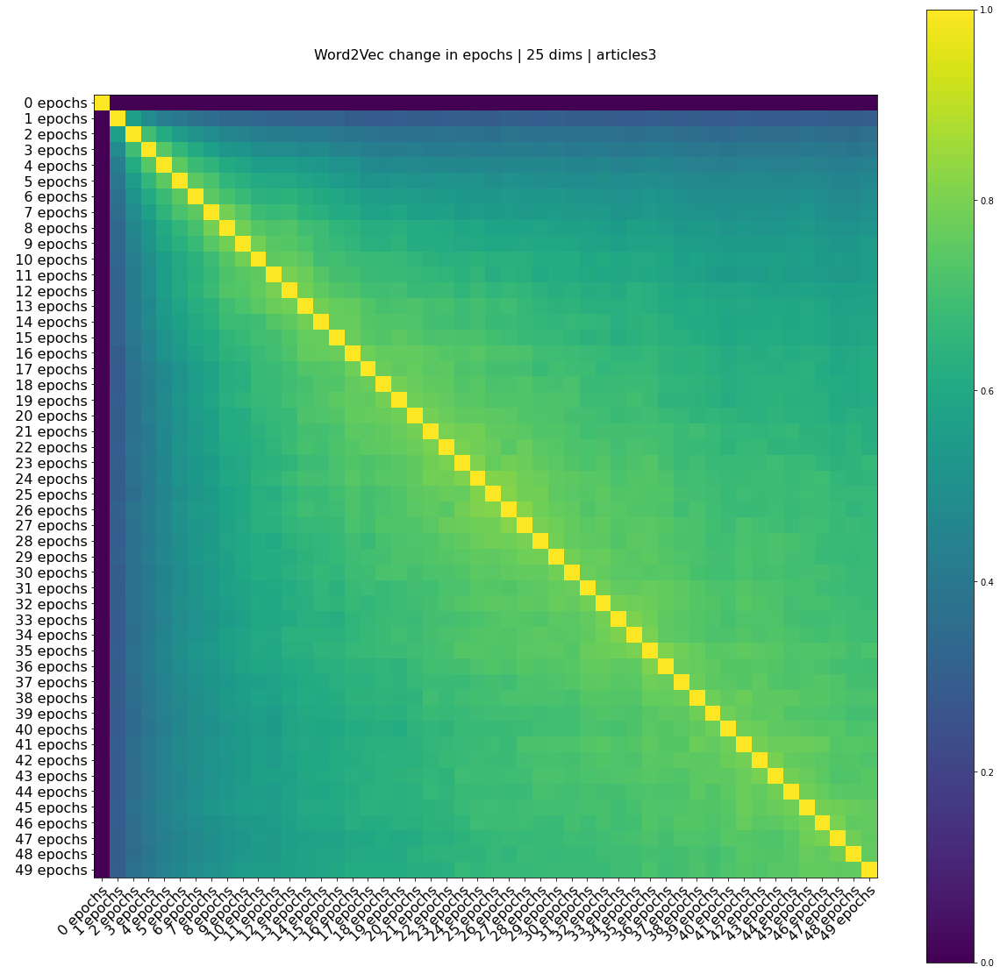

#### FastText change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

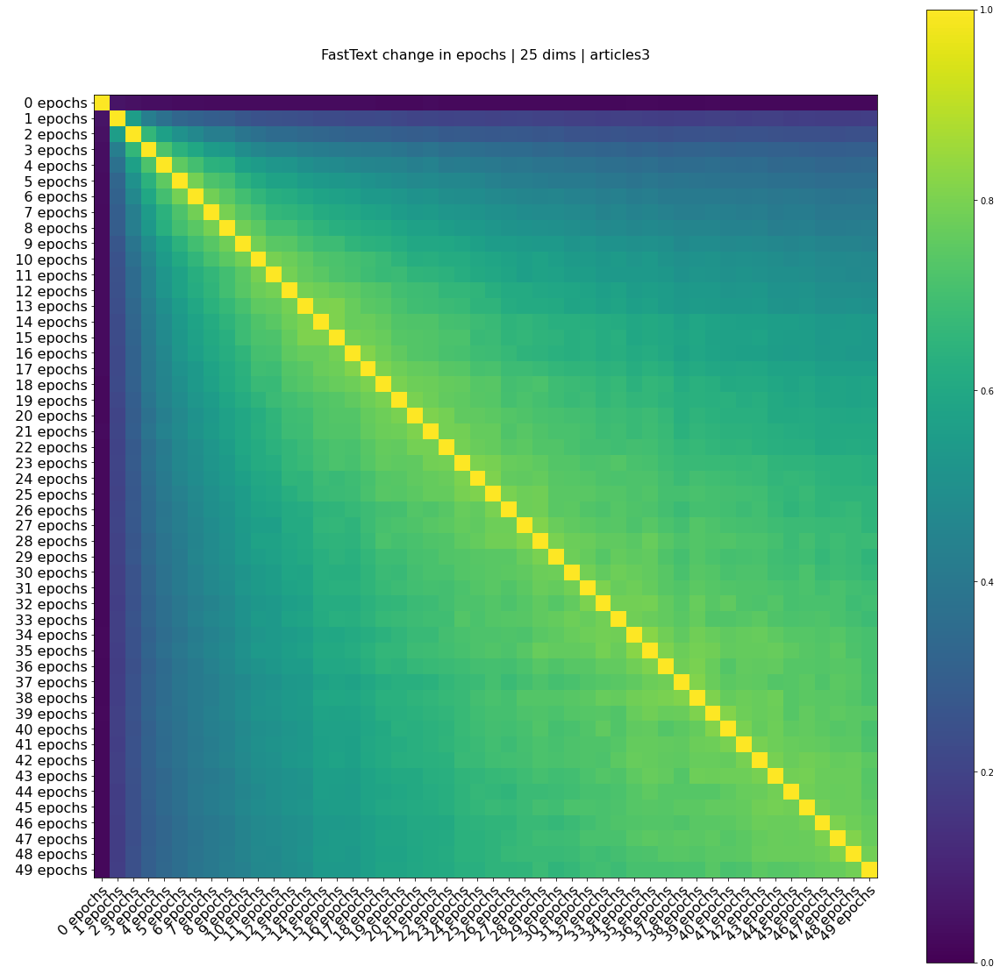

#### Train Vectors

All models:   0%|          | 0/6 [00:00<?, ?it/s]

w2v cbow default                                                                                    :   0%|   …

w2v cbow 20negative                                                                                 :   0%|   …

w2v cbow w7                                                                                         :   0%|   …

w2v skipgram defaultc                                                                               :   0%|   …

w2v skipgram 20negative                                                                             :   0%|   …

w2v skipgram w7                                                                                     :   0%|   …

All models:   0%|          | 0/6 [00:00<?, ?it/s]

ft cbow_default                                                                                     :   0%|   …

ft cbow 20negative                                                                                  :   0%|   …

ft cbow w7                                                                                          :   0%|   …

ft skipgram default                                                                                 :   0%|   …

ft skipgram 20negative                                                                              :   0%|   …

ft skipgram w7                                                                                      :   0%|   …

All models:   0%|          | 0/1 [00:00<?, ?it/s]

random projection                                                                                   : 0it [00:…

#### Word proximity change

  0%|          | 0/169 [00:00<?, ?it/s]

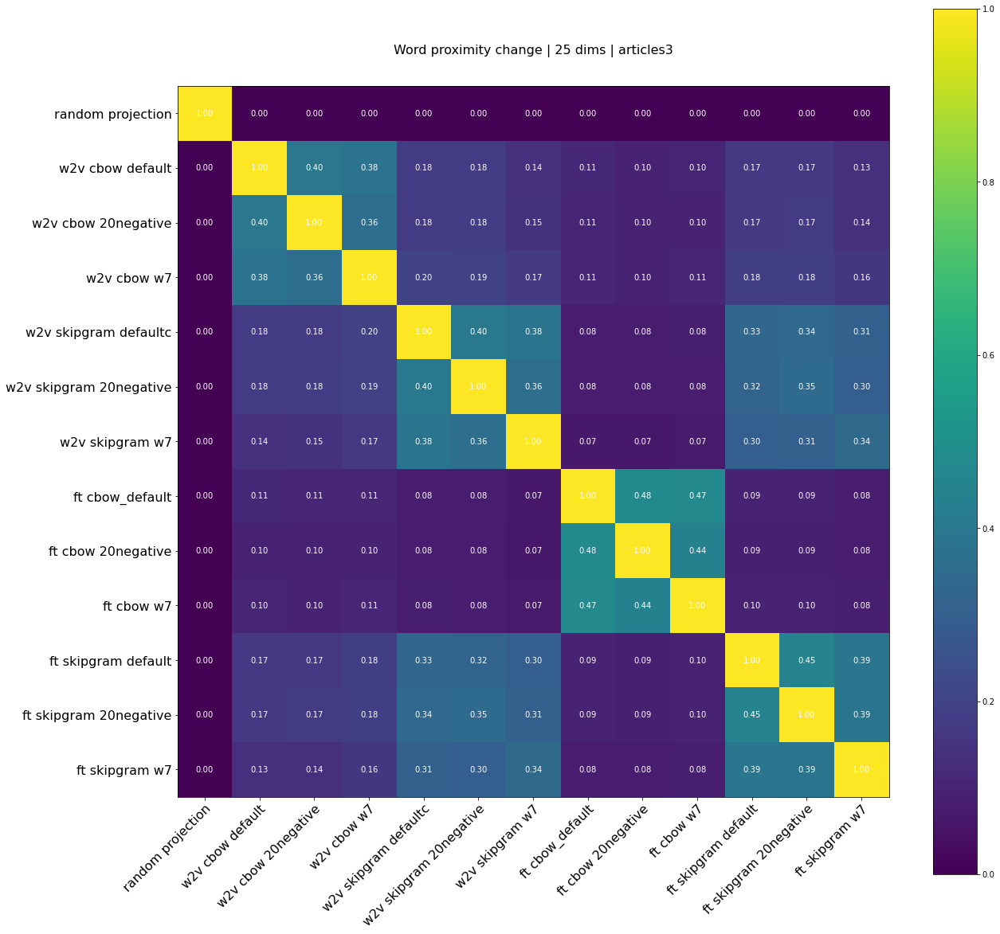

#### Analogy task change

  0%|          | 0/169 [00:00<?, ?it/s]

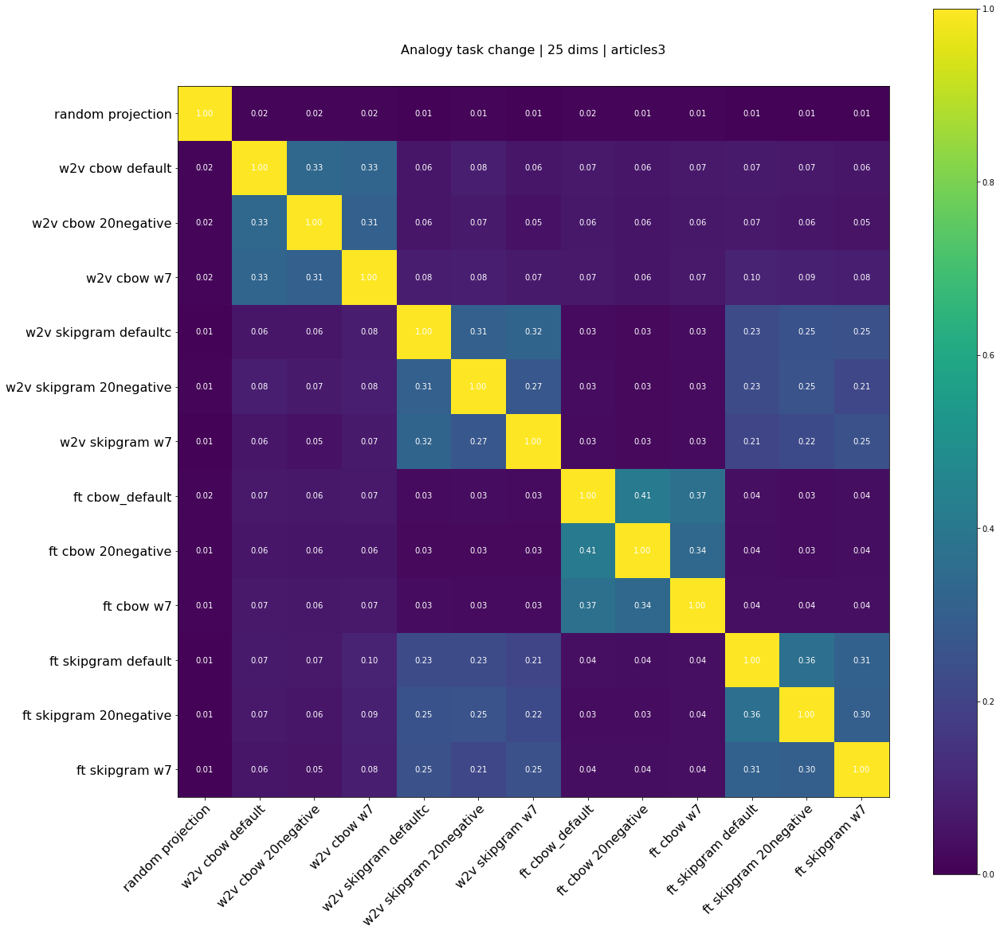

#### Word OD change

  0%|          | 0/169 [00:00<?, ?it/s]

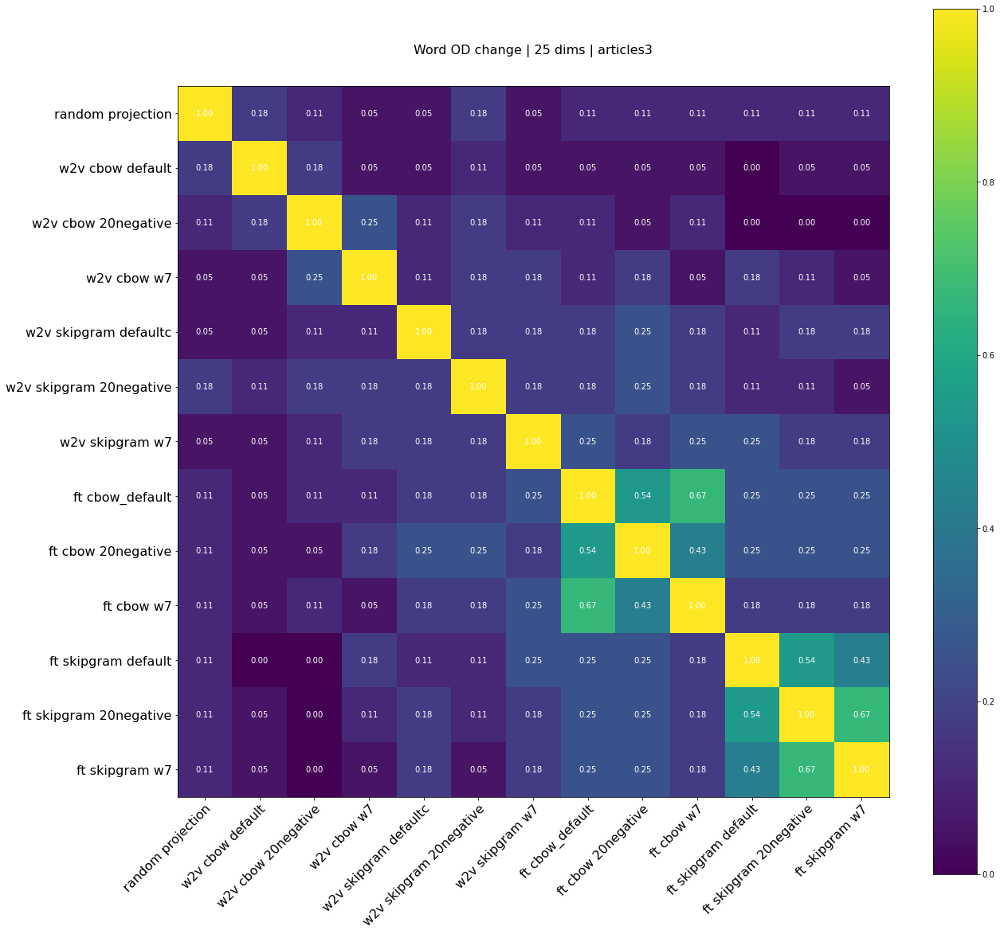

### 50 dims

#### Word2Vec change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

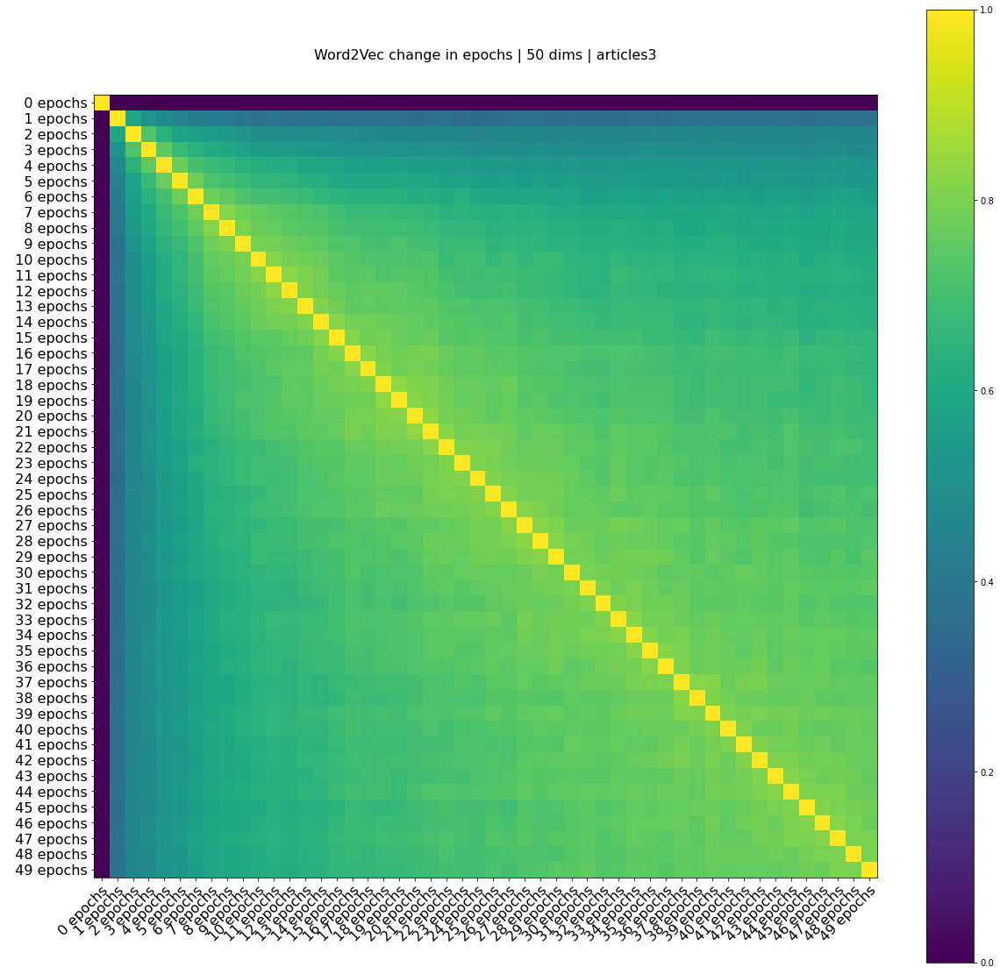

#### FastText change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

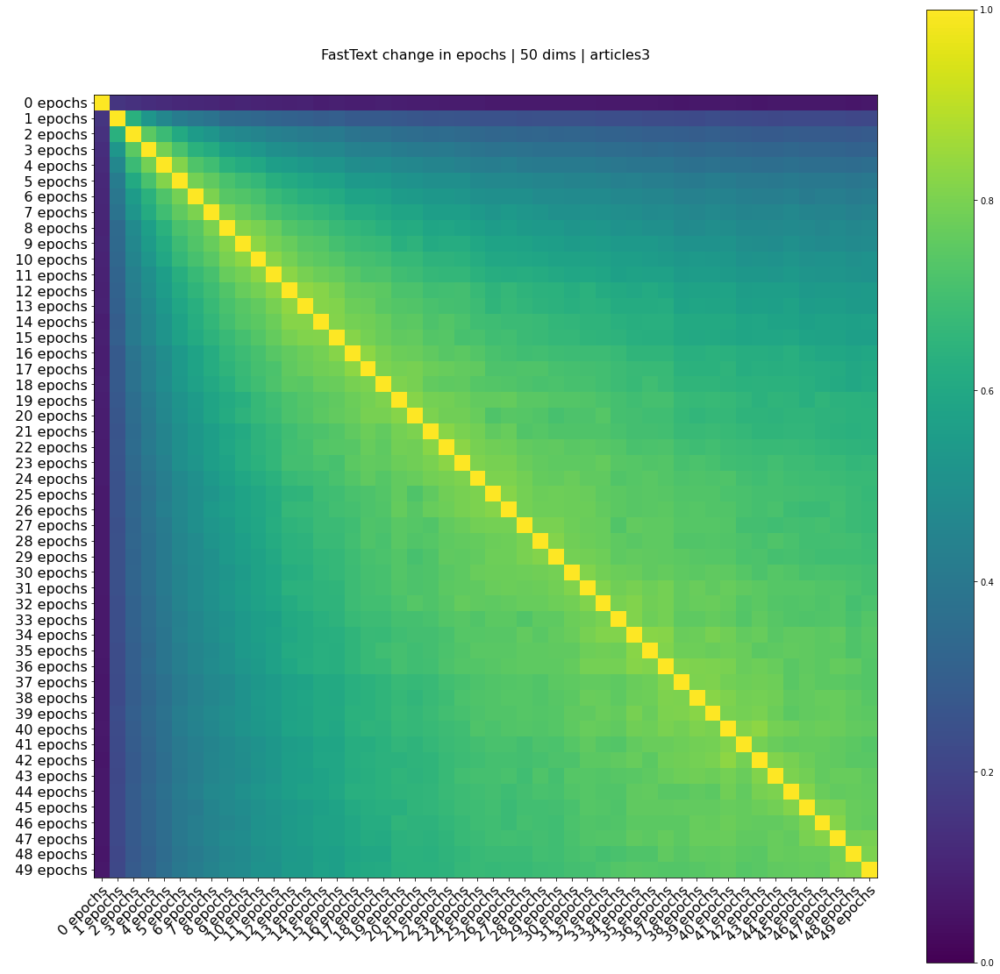

#### Train Vectors

All models:   0%|          | 0/6 [00:00<?, ?it/s]

w2v cbow default                                                                                    :   0%|   …

w2v cbow 20negative                                                                                 :   0%|   …

w2v cbow w7                                                                                         :   0%|   …

w2v skipgram defaultc                                                                               :   0%|   …

w2v skipgram 20negative                                                                             :   0%|   …

w2v skipgram w7                                                                                     :   0%|   …

All models:   0%|          | 0/6 [00:00<?, ?it/s]

ft cbow_default                                                                                     :   0%|   …

ft cbow 20negative                                                                                  :   0%|   …

ft cbow w7                                                                                          :   0%|   …

ft skipgram default                                                                                 :   0%|   …

ft skipgram 20negative                                                                              :   0%|   …

ft skipgram w7                                                                                      :   0%|   …

All models:   0%|          | 0/1 [00:00<?, ?it/s]

random projection                                                                                   : 0it [00:…

#### Word proximity change

  0%|          | 0/169 [00:00<?, ?it/s]

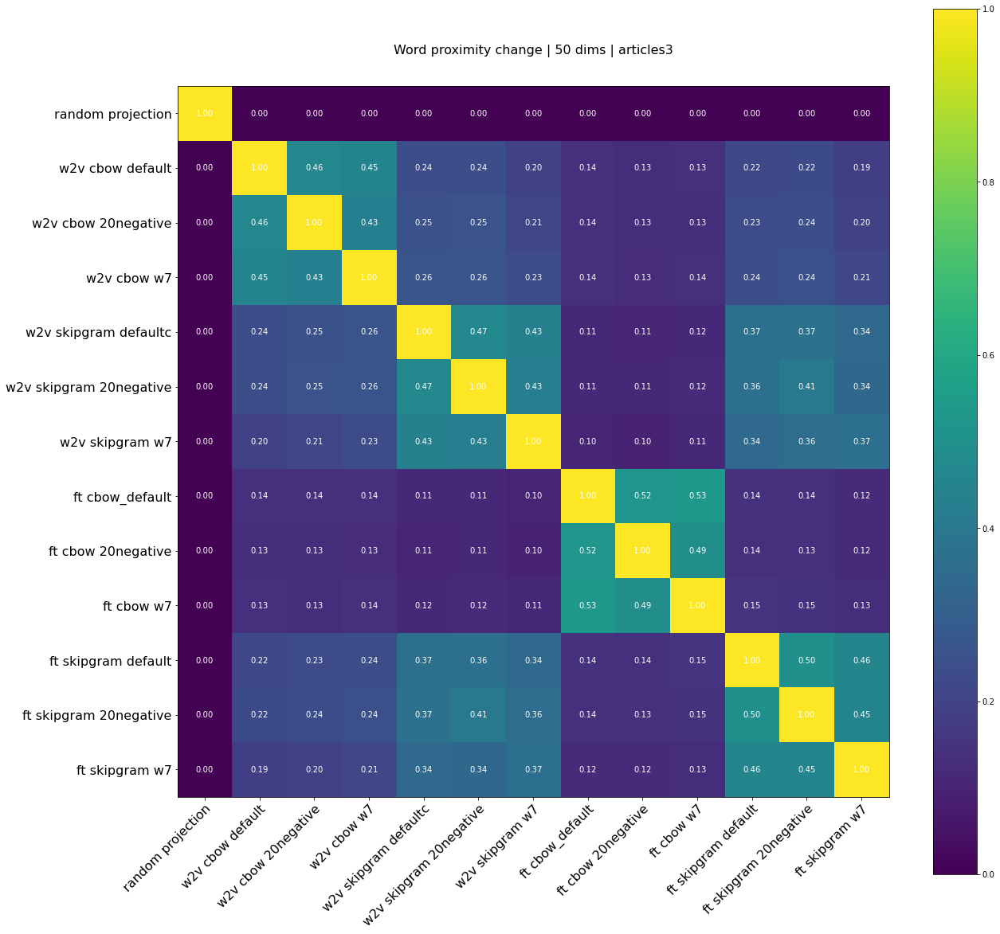

#### Analogy task change

  0%|          | 0/169 [00:00<?, ?it/s]

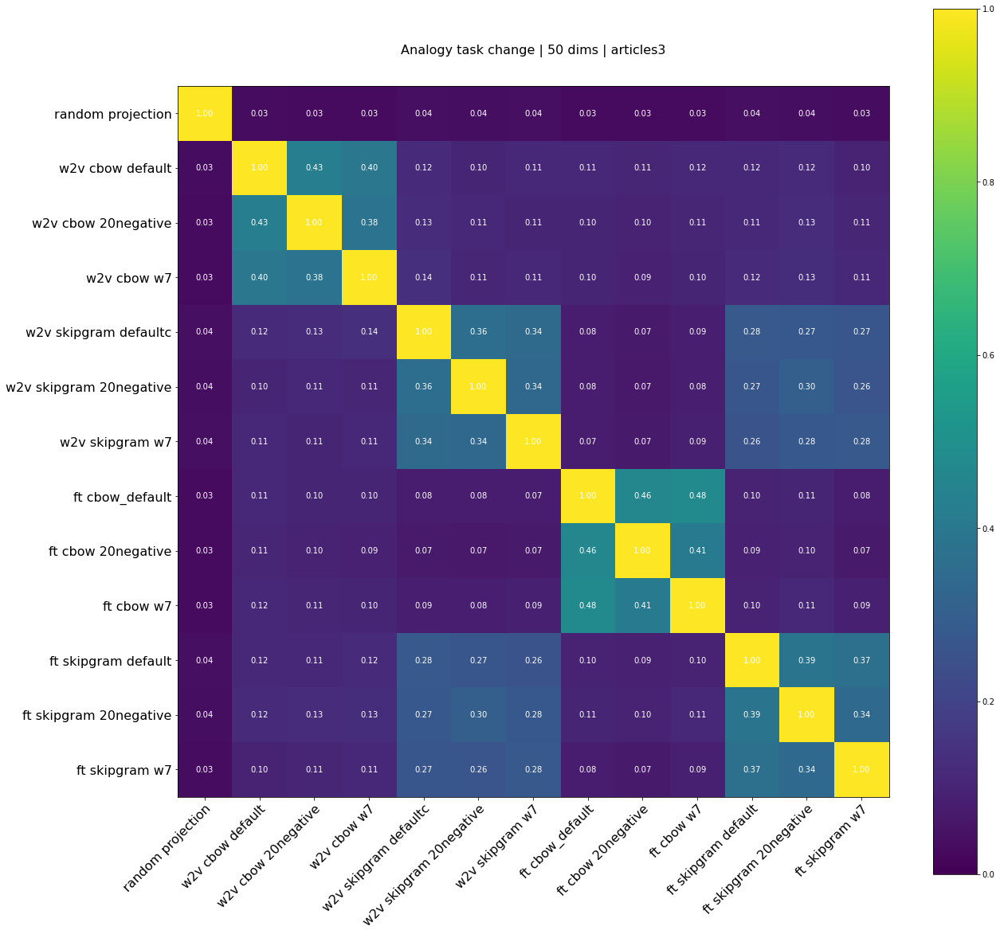

#### Word OD change

  0%|          | 0/169 [00:00<?, ?it/s]

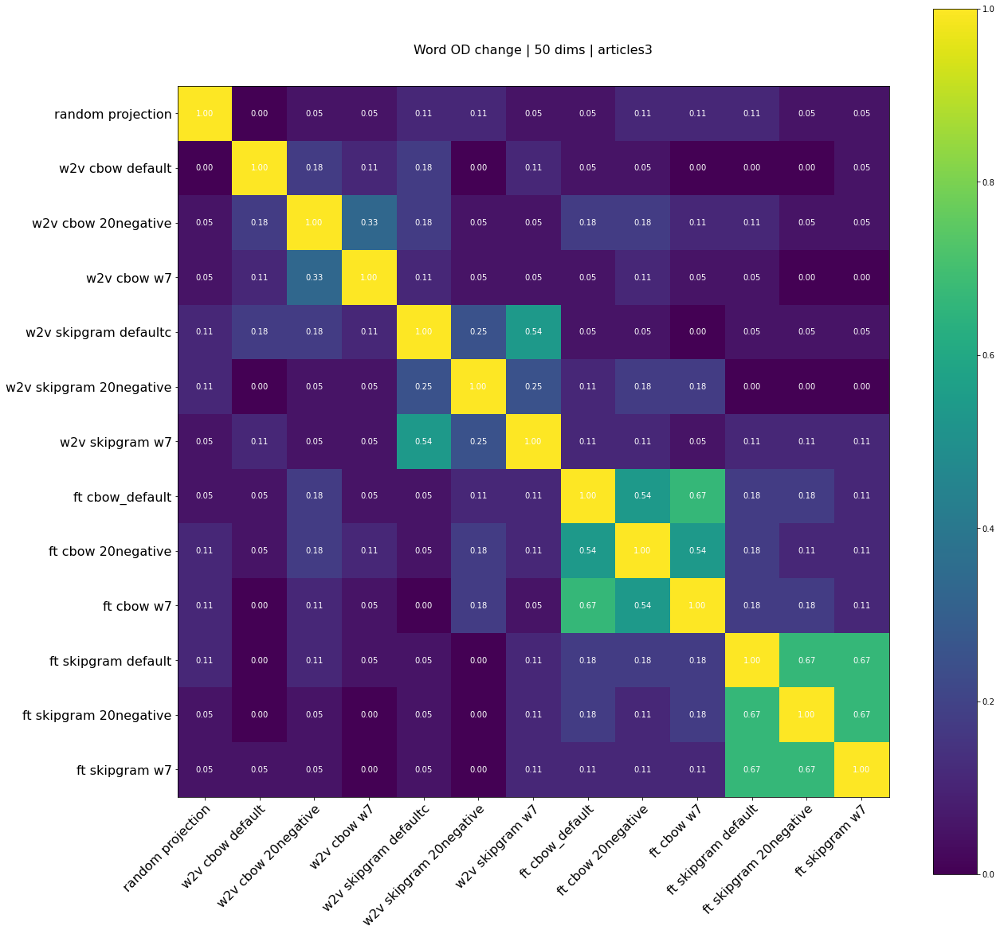

### 100 dims

#### Word2Vec change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

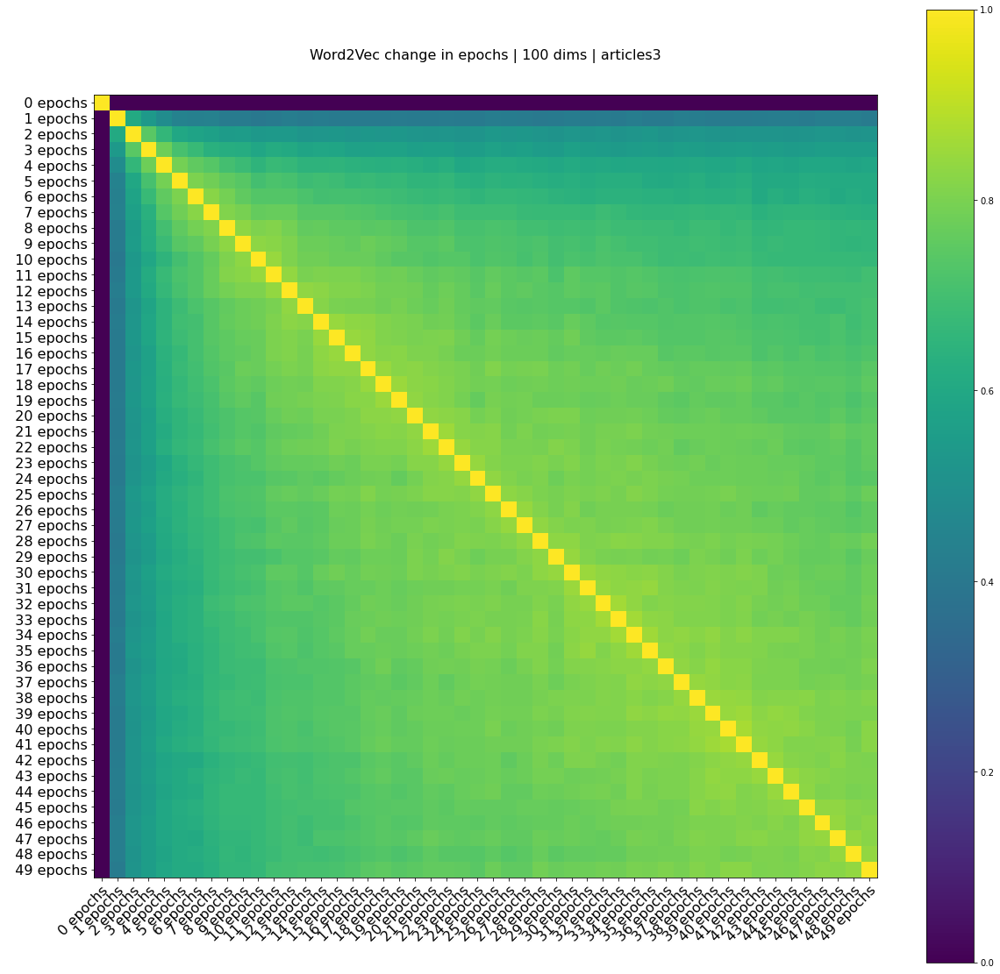

#### FastText change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

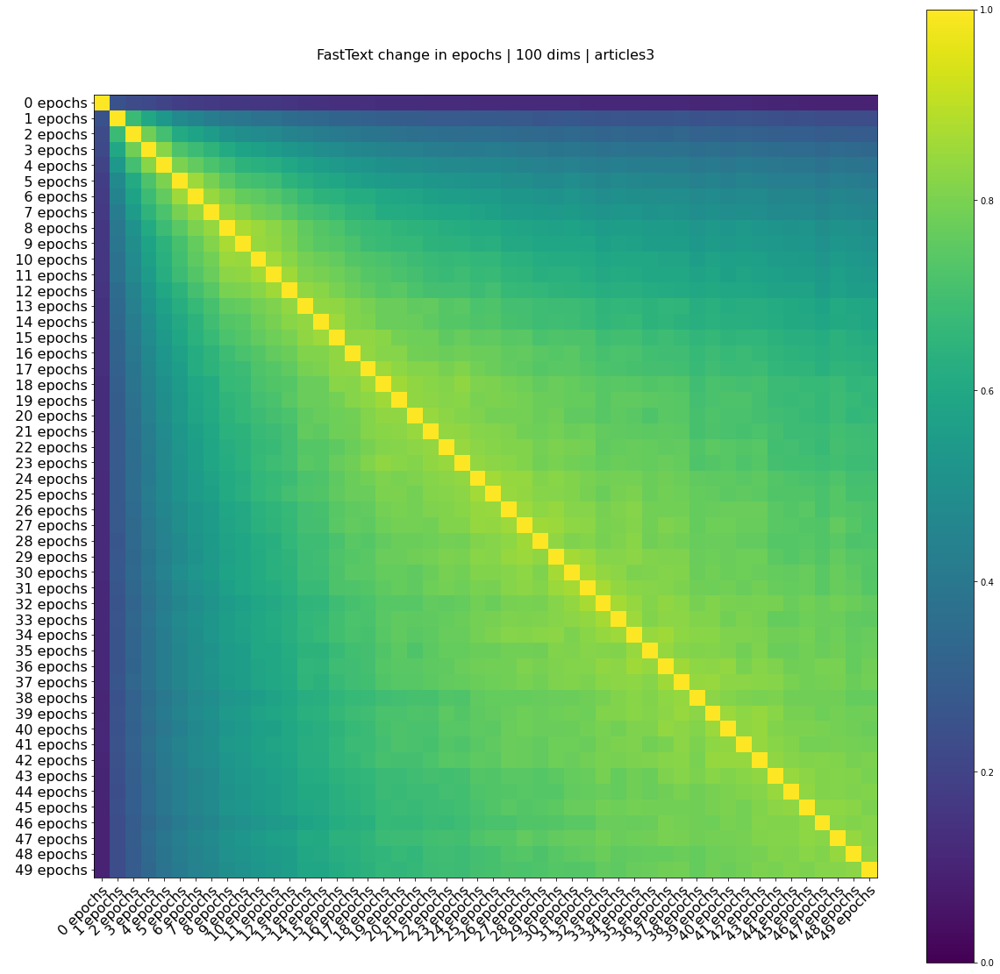

#### Train Vectors

All models:   0%|          | 0/6 [00:00<?, ?it/s]

w2v cbow default                                                                                    :   0%|   …

w2v cbow 20negative                                                                                 :   0%|   …

w2v cbow w7                                                                                         :   0%|   …

w2v skipgram defaultc                                                                               :   0%|   …

w2v skipgram 20negative                                                                             :   0%|   …

w2v skipgram w7                                                                                     :   0%|   …

All models:   0%|          | 0/6 [00:00<?, ?it/s]

ft cbow_default                                                                                     :   0%|   …

ft cbow 20negative                                                                                  :   0%|   …

ft cbow w7                                                                                          :   0%|   …

ft skipgram default                                                                                 :   0%|   …

ft skipgram 20negative                                                                              :   0%|   …

ft skipgram w7                                                                                      :   0%|   …

All models:   0%|          | 0/1 [00:00<?, ?it/s]

random projection                                                                                   : 0it [00:…

#### Word proximity change

  0%|          | 0/169 [00:00<?, ?it/s]

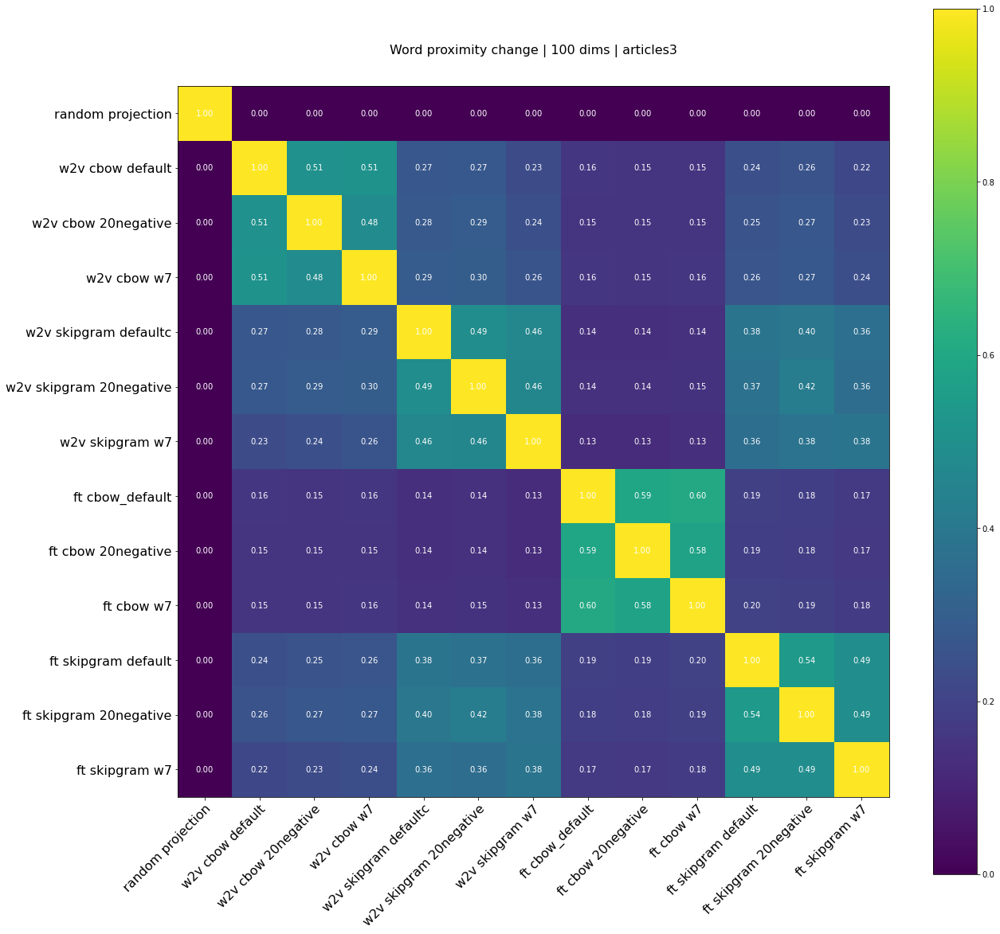

#### Analogy task change

  0%|          | 0/169 [00:00<?, ?it/s]

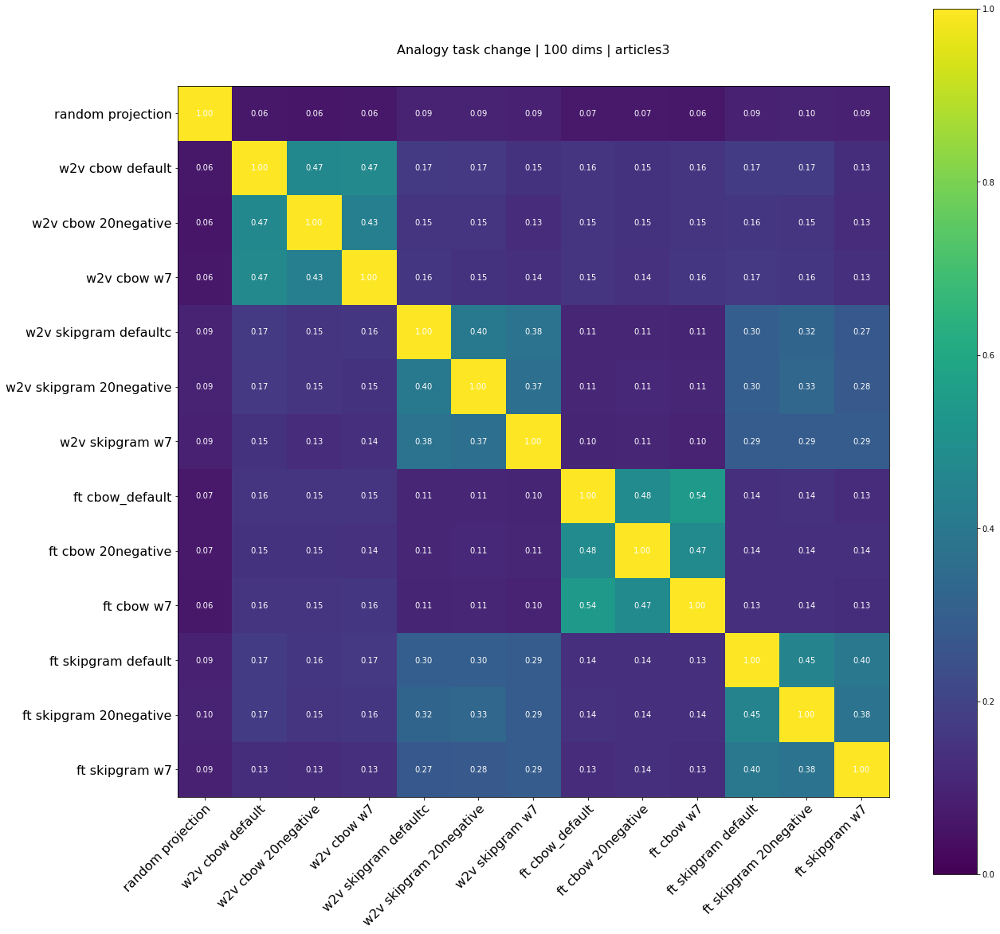

#### Word OD change

  0%|          | 0/169 [00:00<?, ?it/s]

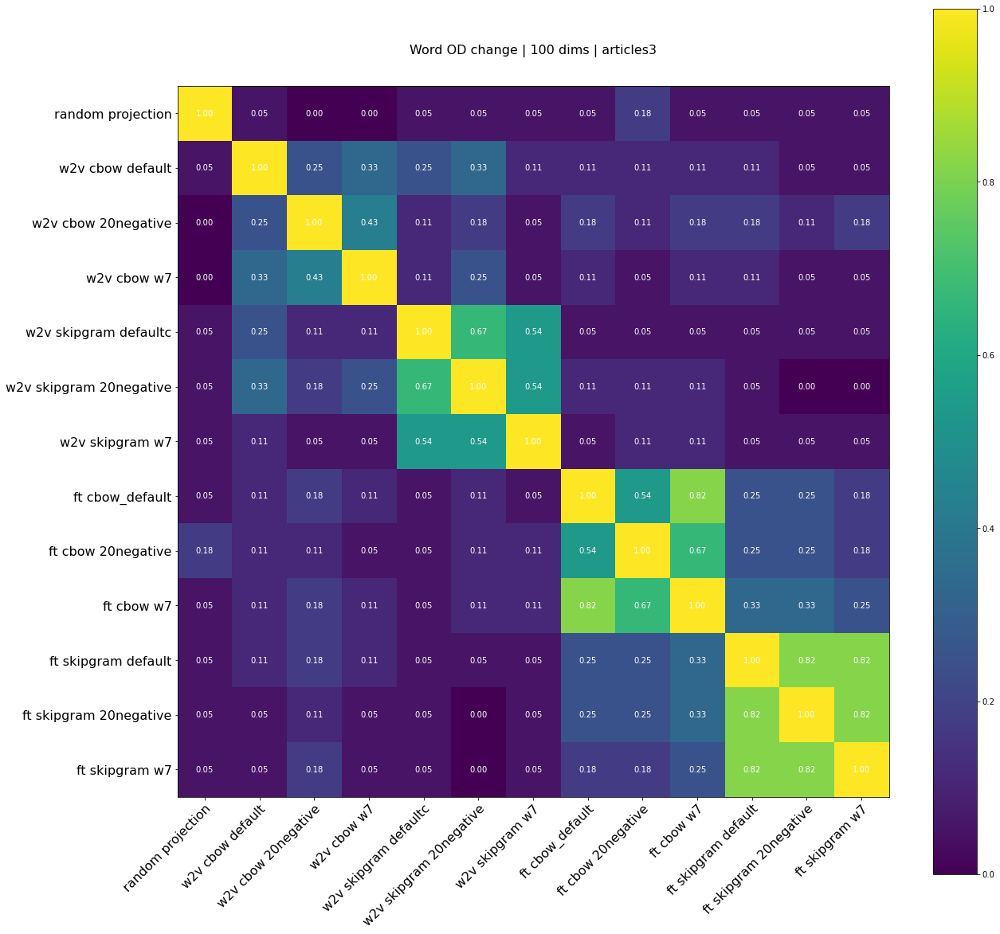

## articles1.csv

'   50000 docs used'

### 25 dims

#### Word2Vec change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

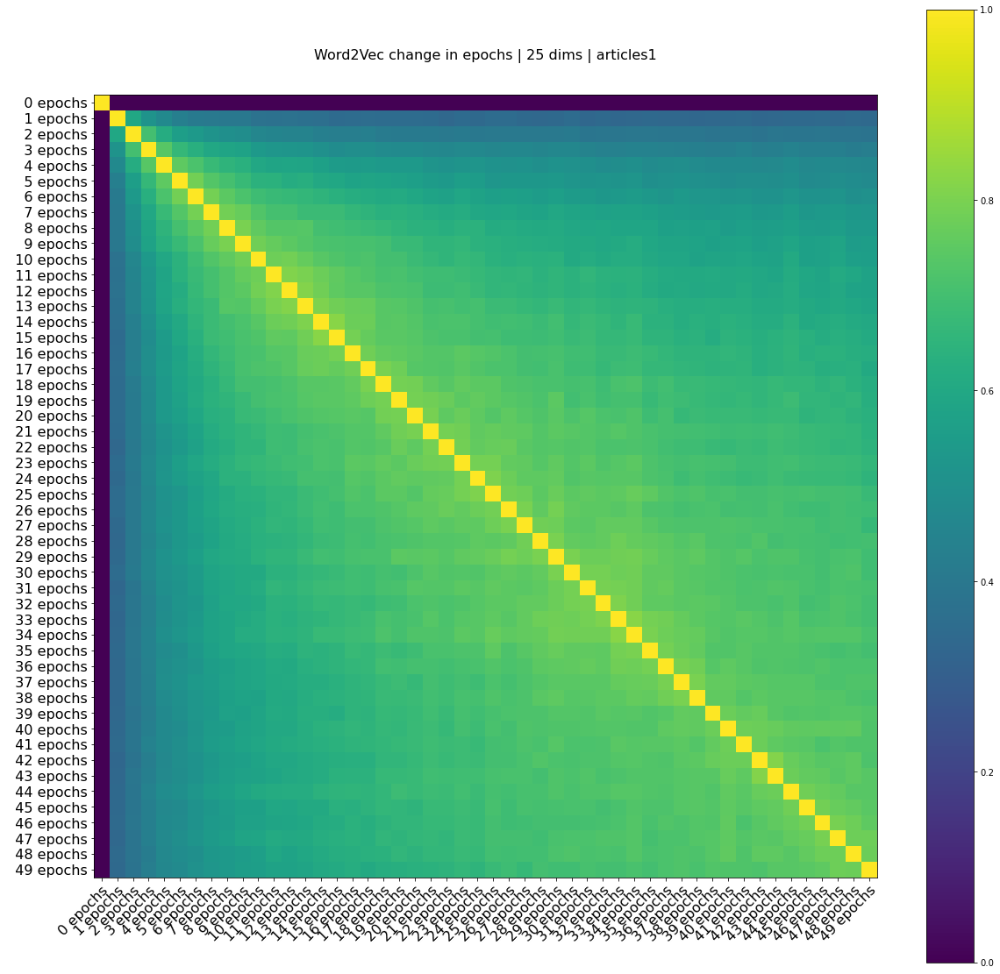

#### FastText change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

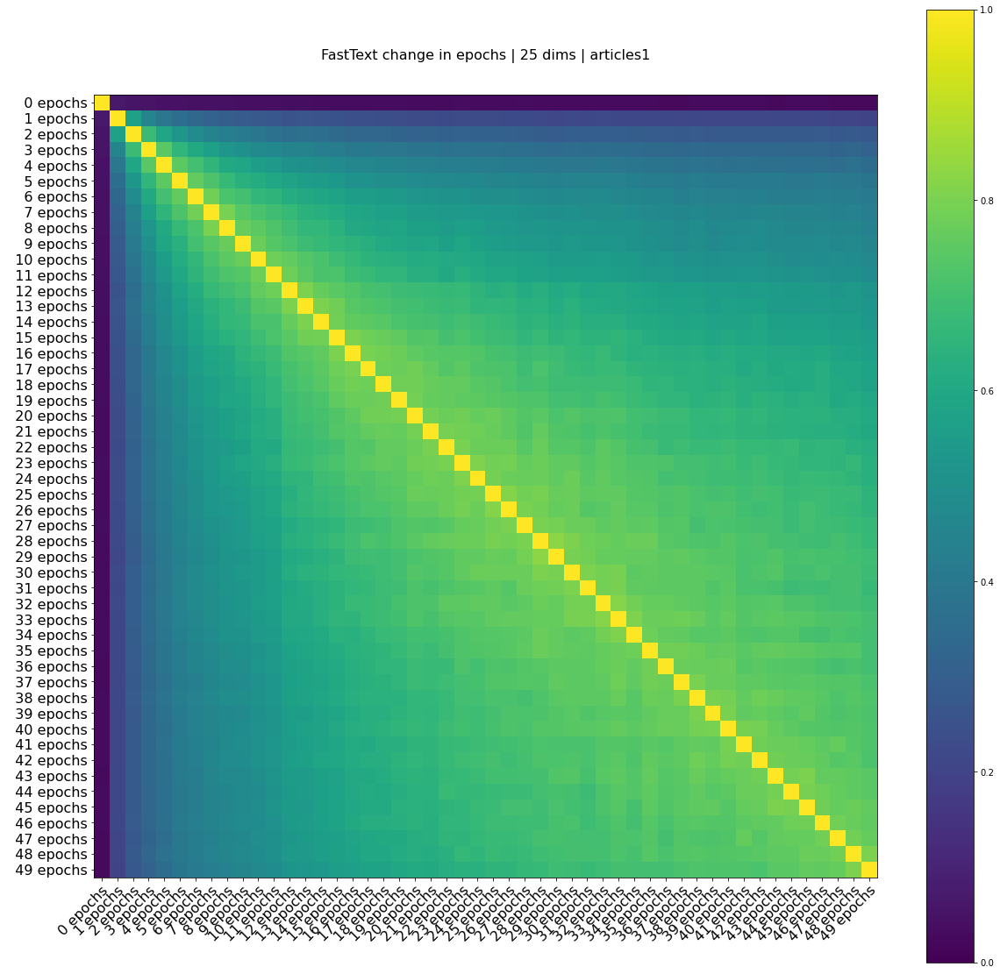

#### Train Vectors

All models:   0%|          | 0/6 [00:00<?, ?it/s]

w2v cbow default                                                                                    :   0%|   …

w2v cbow 20negative                                                                                 :   0%|   …

w2v cbow w7                                                                                         :   0%|   …

w2v skipgram defaultc                                                                               :   0%|   …

w2v skipgram 20negative                                                                             :   0%|   …

w2v skipgram w7                                                                                     :   0%|   …

All models:   0%|          | 0/6 [00:00<?, ?it/s]

ft cbow_default                                                                                     :   0%|   …

ft cbow 20negative                                                                                  :   0%|   …

ft cbow w7                                                                                          :   0%|   …

ft skipgram default                                                                                 :   0%|   …

ft skipgram 20negative                                                                              :   0%|   …

ft skipgram w7                                                                                      :   0%|   …

All models:   0%|          | 0/1 [00:00<?, ?it/s]

random projection                                                                                   : 0it [00:…

#### Word proximity change

  0%|          | 0/169 [00:00<?, ?it/s]

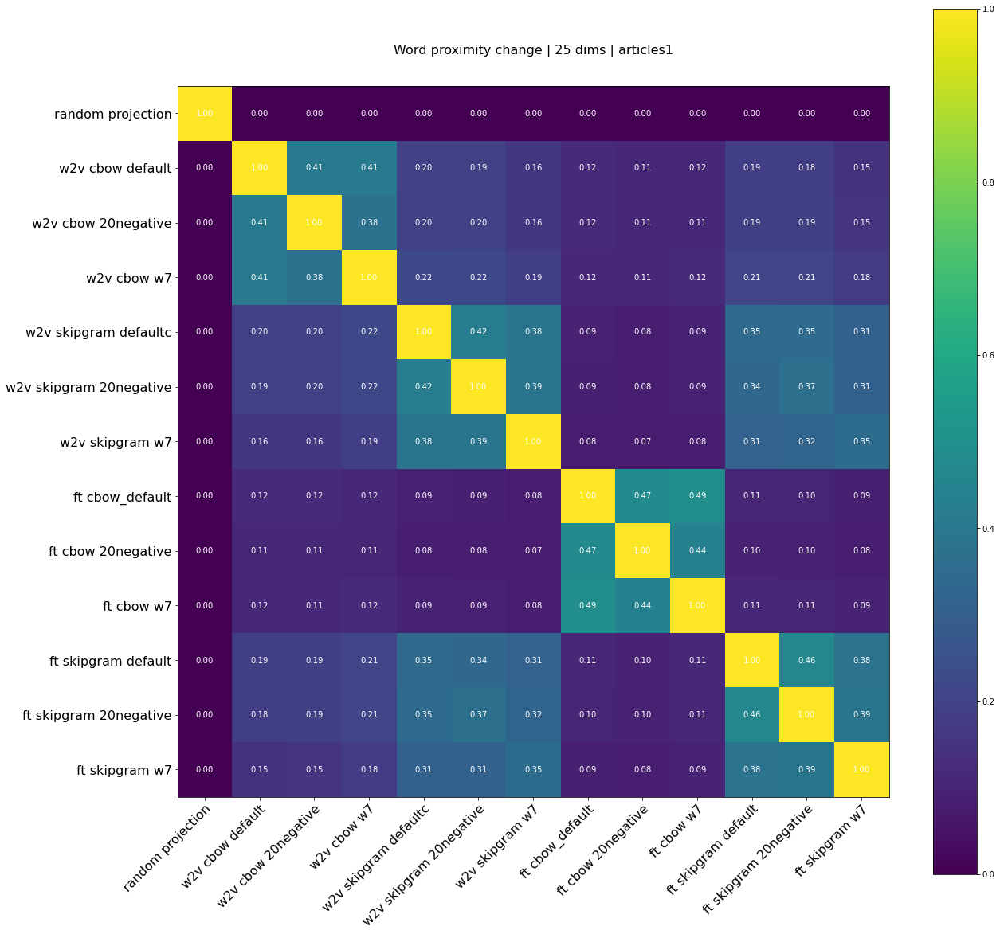

#### Analogy task change

  0%|          | 0/169 [00:00<?, ?it/s]

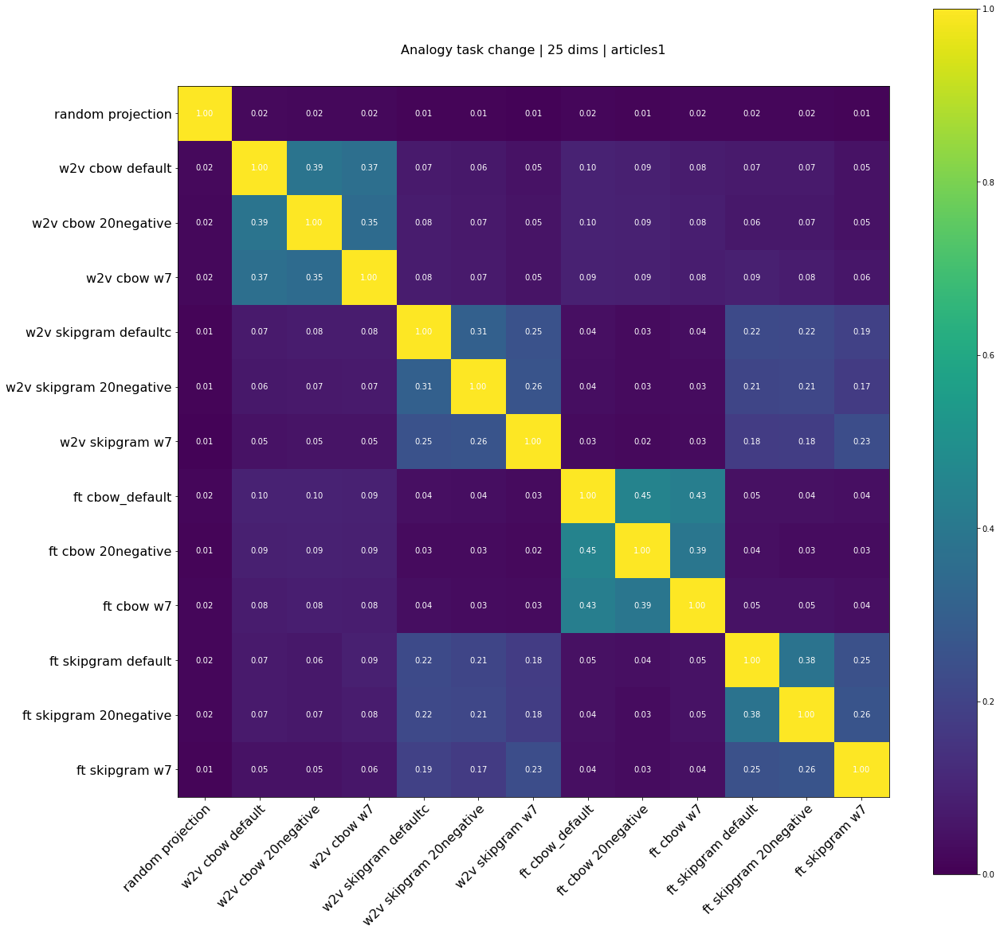

#### Word OD change

  0%|          | 0/169 [00:00<?, ?it/s]

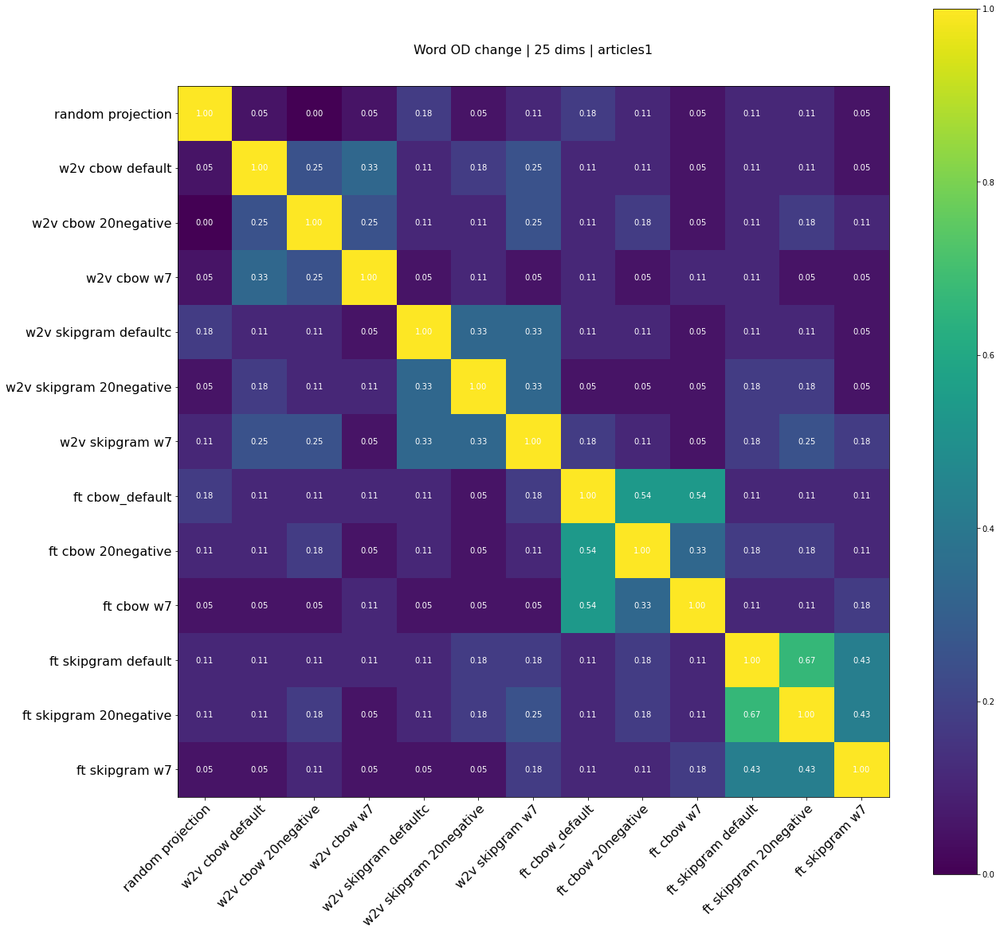

### 50 dims

#### Word2Vec change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

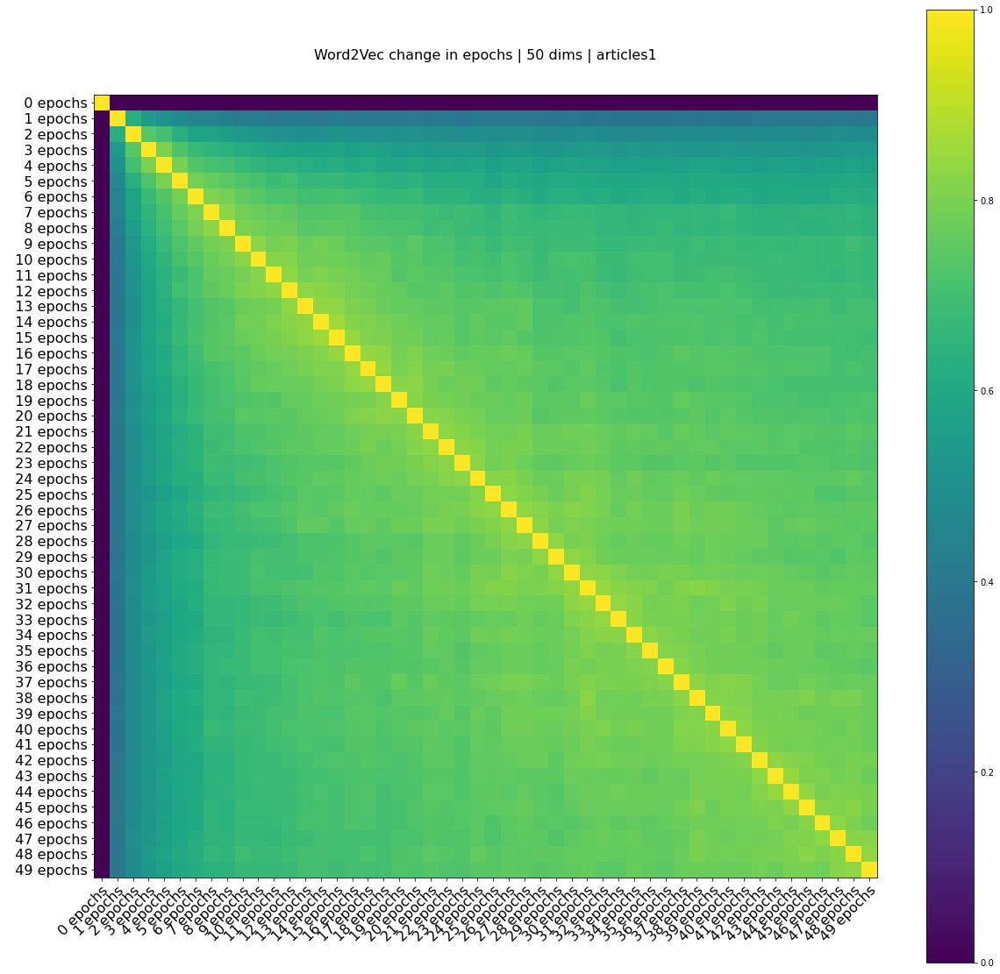

#### FastText change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

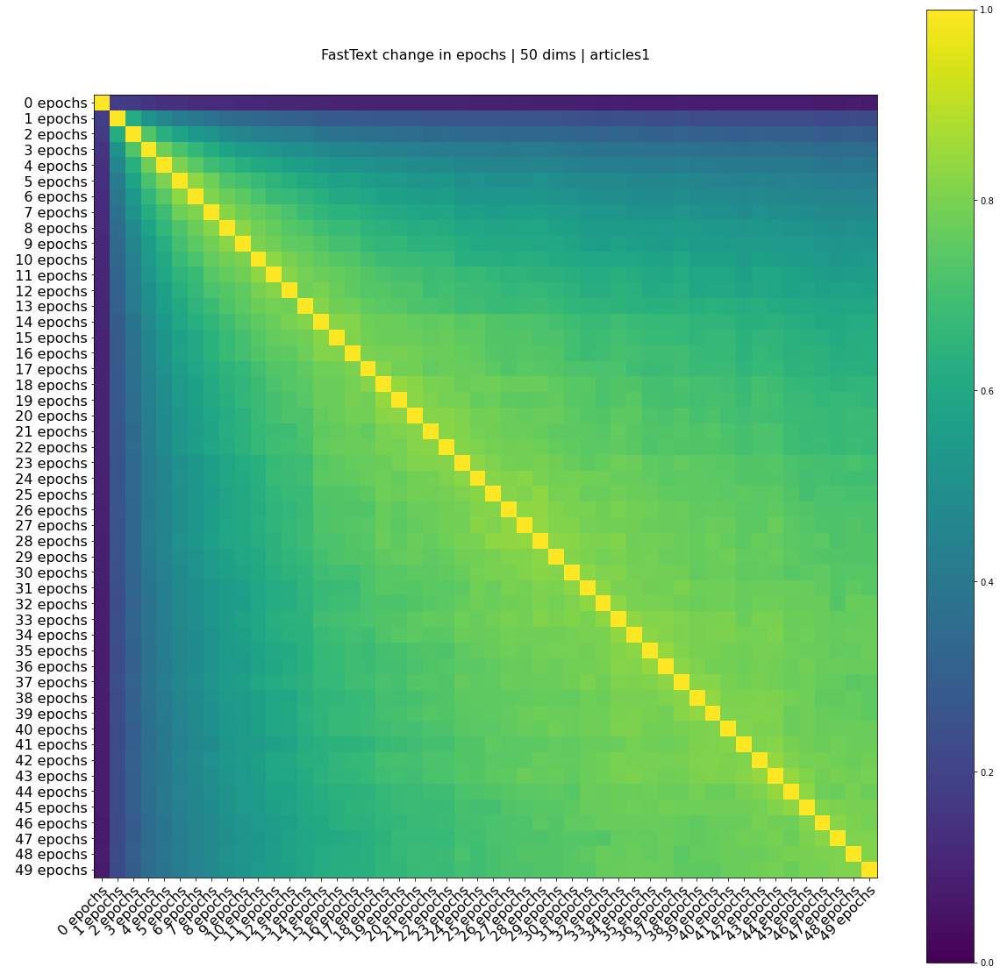

#### Train Vectors

All models:   0%|          | 0/6 [00:00<?, ?it/s]

w2v cbow default                                                                                    :   0%|   …

w2v cbow 20negative                                                                                 :   0%|   …

w2v cbow w7                                                                                         :   0%|   …

w2v skipgram defaultc                                                                               :   0%|   …

w2v skipgram 20negative                                                                             :   0%|   …

w2v skipgram w7                                                                                     :   0%|   …

All models:   0%|          | 0/6 [00:00<?, ?it/s]

ft cbow_default                                                                                     :   0%|   …

ft cbow 20negative                                                                                  :   0%|   …

ft cbow w7                                                                                          :   0%|   …

ft skipgram default                                                                                 :   0%|   …

ft skipgram 20negative                                                                              :   0%|   …

ft skipgram w7                                                                                      :   0%|   …

All models:   0%|          | 0/1 [00:00<?, ?it/s]

random projection                                                                                   : 0it [00:…

#### Word proximity change

  0%|          | 0/169 [00:00<?, ?it/s]

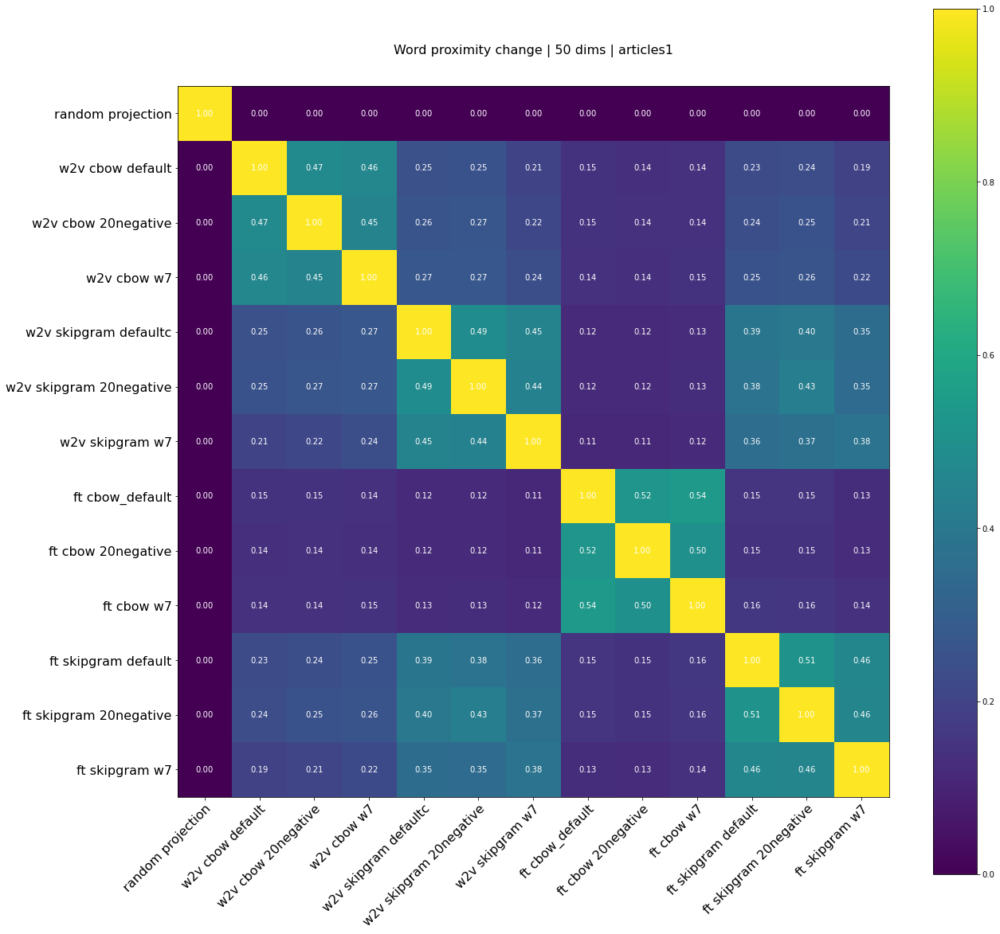

#### Analogy task change

  0%|          | 0/169 [00:00<?, ?it/s]

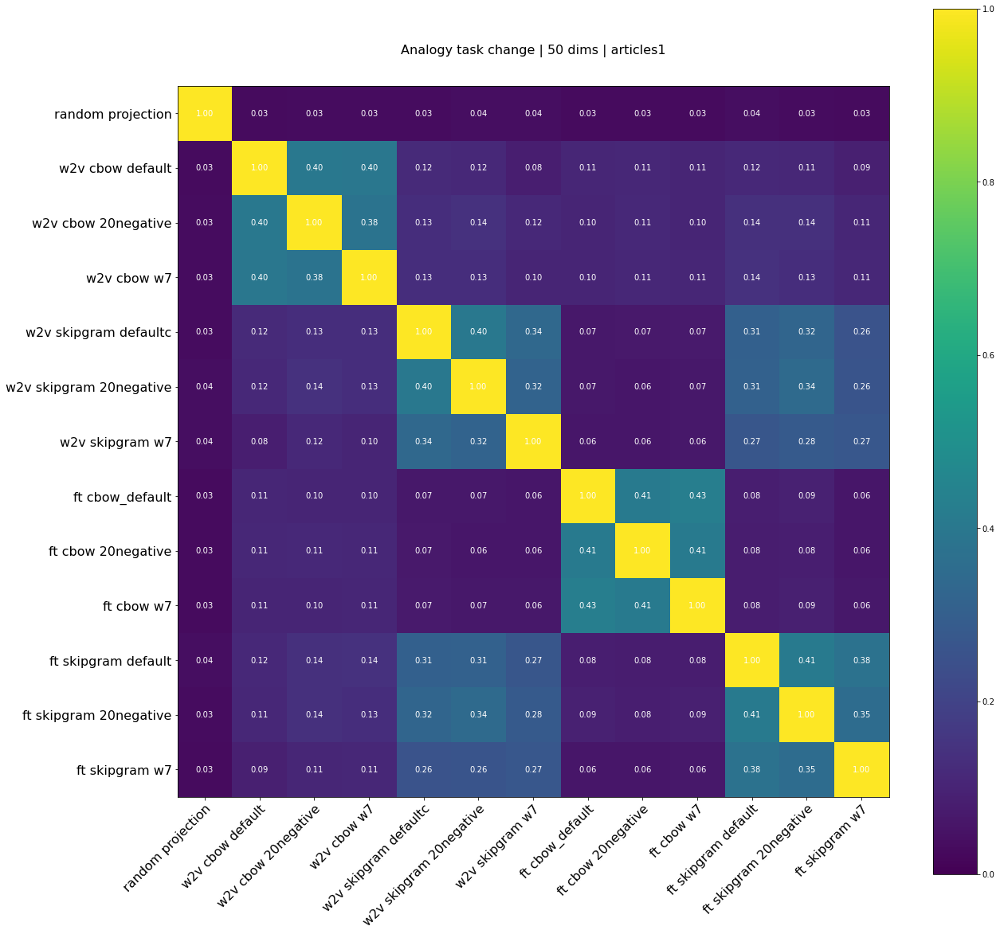

#### Word OD change

  0%|          | 0/169 [00:00<?, ?it/s]

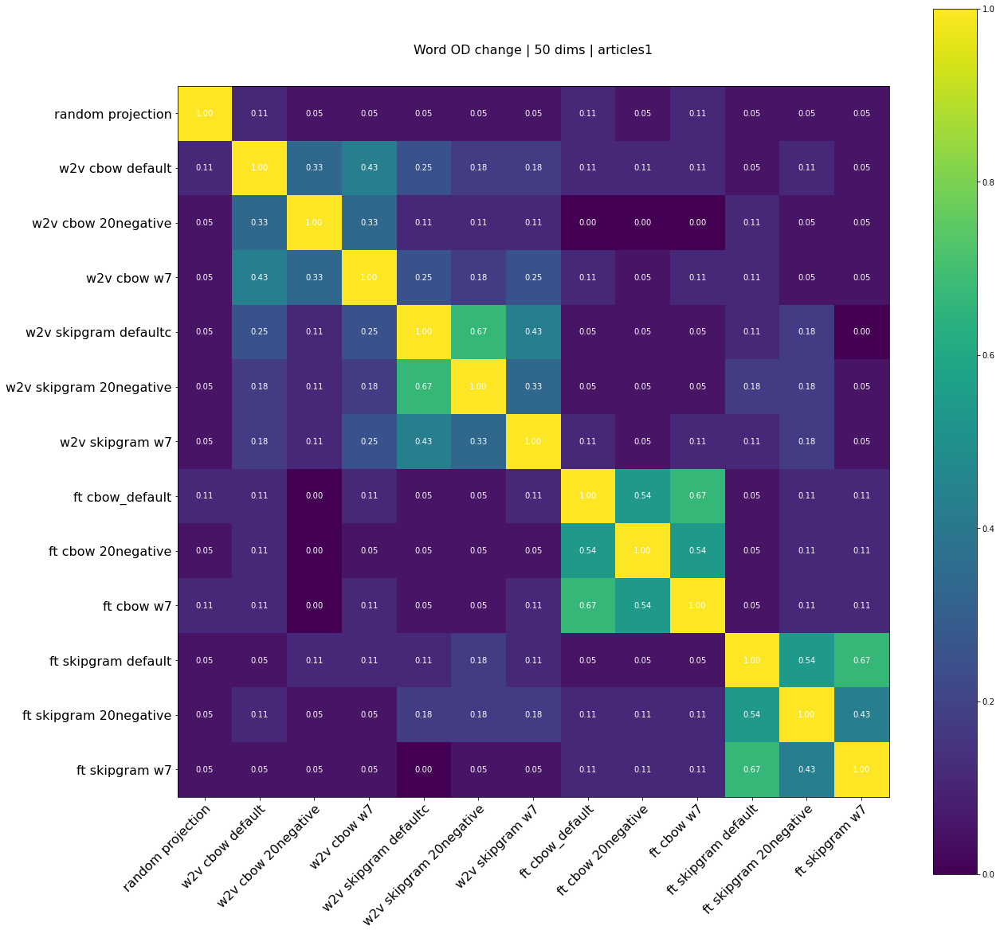

### 100 dims

#### Word2Vec change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

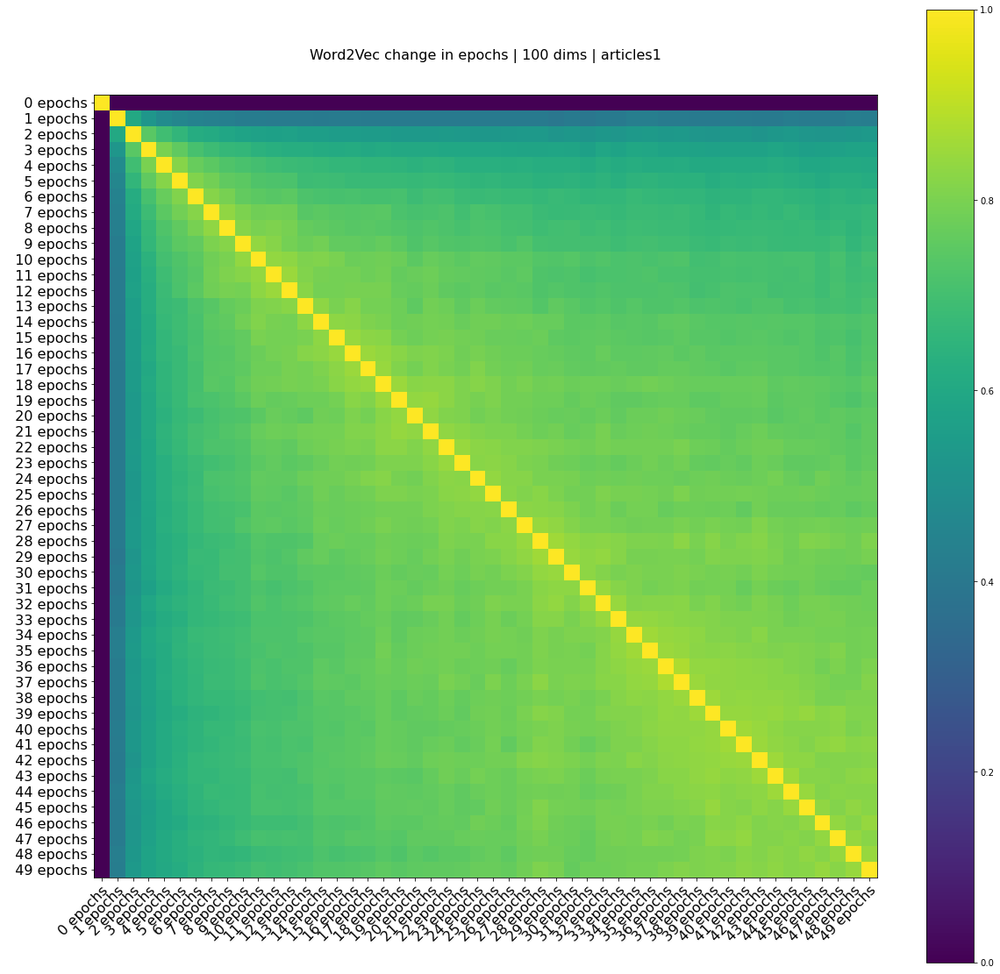

#### FastText change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

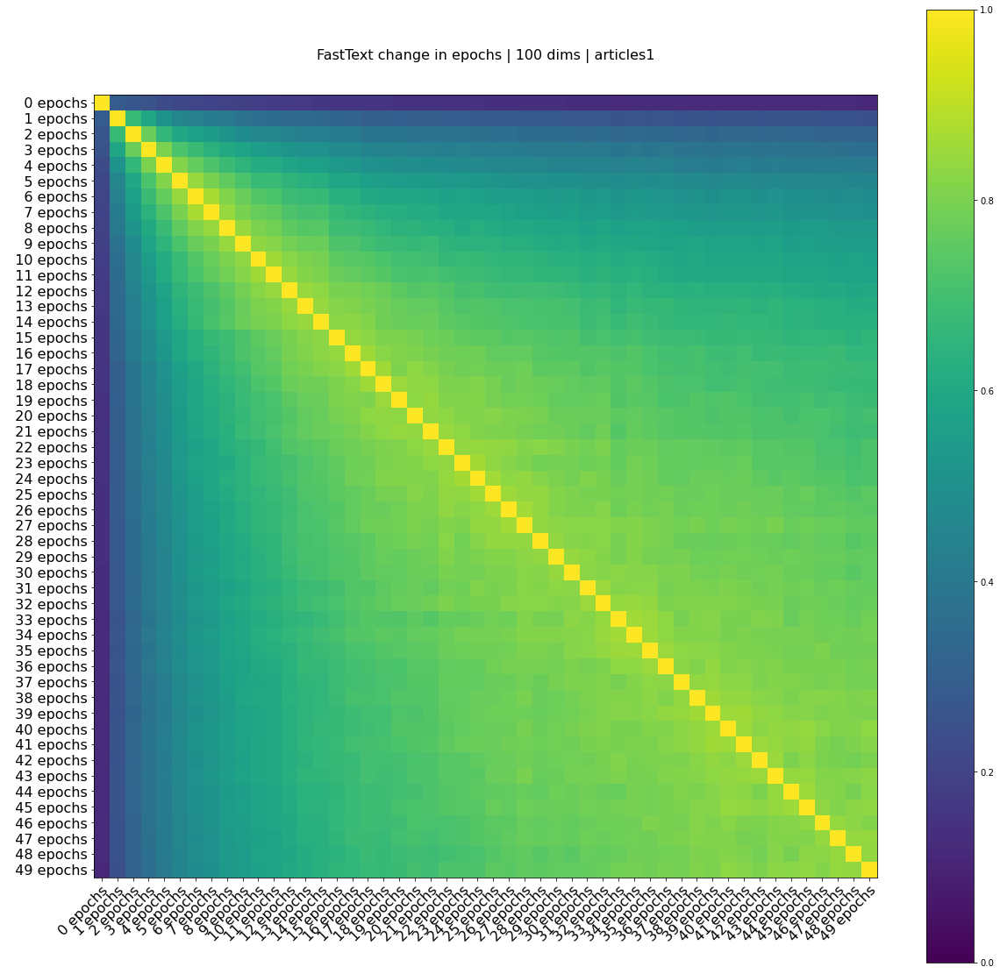

#### Train Vectors

All models:   0%|          | 0/6 [00:00<?, ?it/s]

w2v cbow default                                                                                    :   0%|   …

w2v cbow 20negative                                                                                 :   0%|   …

w2v cbow w7                                                                                         :   0%|   …

w2v skipgram defaultc                                                                               :   0%|   …

w2v skipgram 20negative                                                                             :   0%|   …

w2v skipgram w7                                                                                     :   0%|   …

All models:   0%|          | 0/6 [00:00<?, ?it/s]

ft cbow_default                                                                                     :   0%|   …

ft cbow 20negative                                                                                  :   0%|   …

ft cbow w7                                                                                          :   0%|   …

ft skipgram default                                                                                 :   0%|   …

ft skipgram 20negative                                                                              :   0%|   …

ft skipgram w7                                                                                      :   0%|   …

All models:   0%|          | 0/1 [00:00<?, ?it/s]

random projection                                                                                   : 0it [00:…

#### Word proximity change

  0%|          | 0/169 [00:00<?, ?it/s]

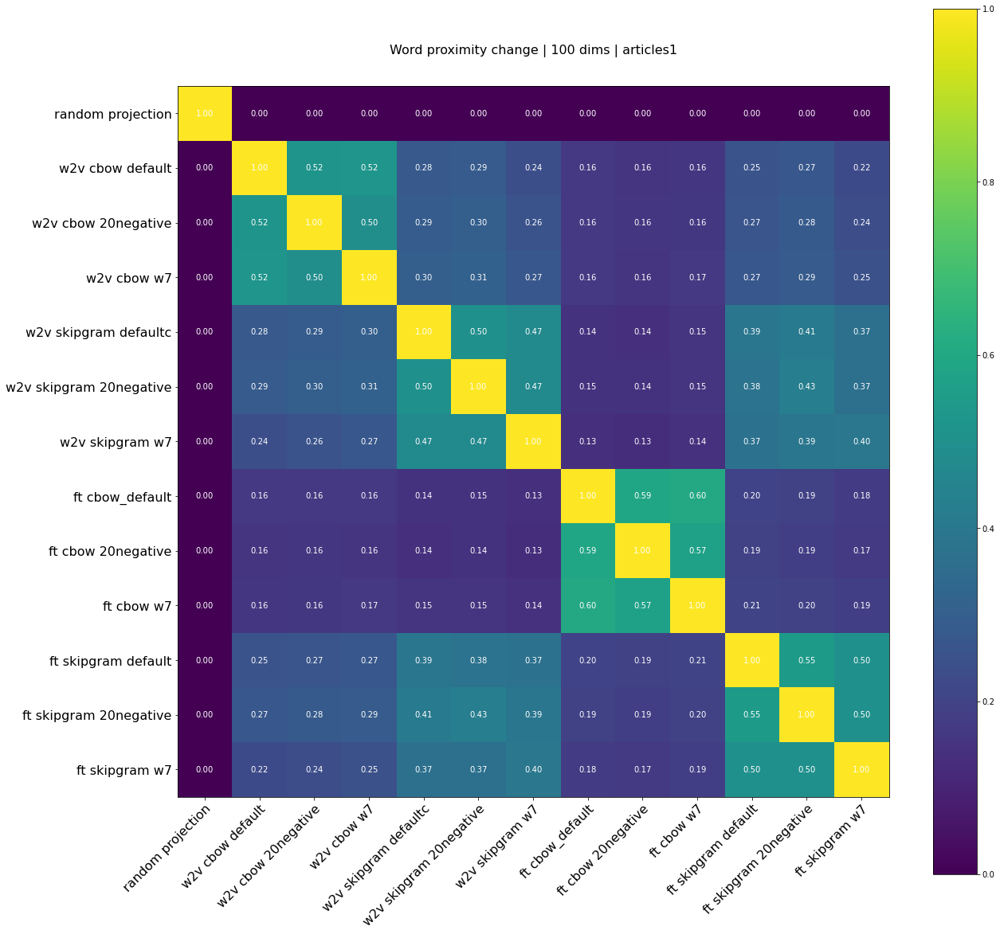

#### Analogy task change

  0%|          | 0/169 [00:00<?, ?it/s]

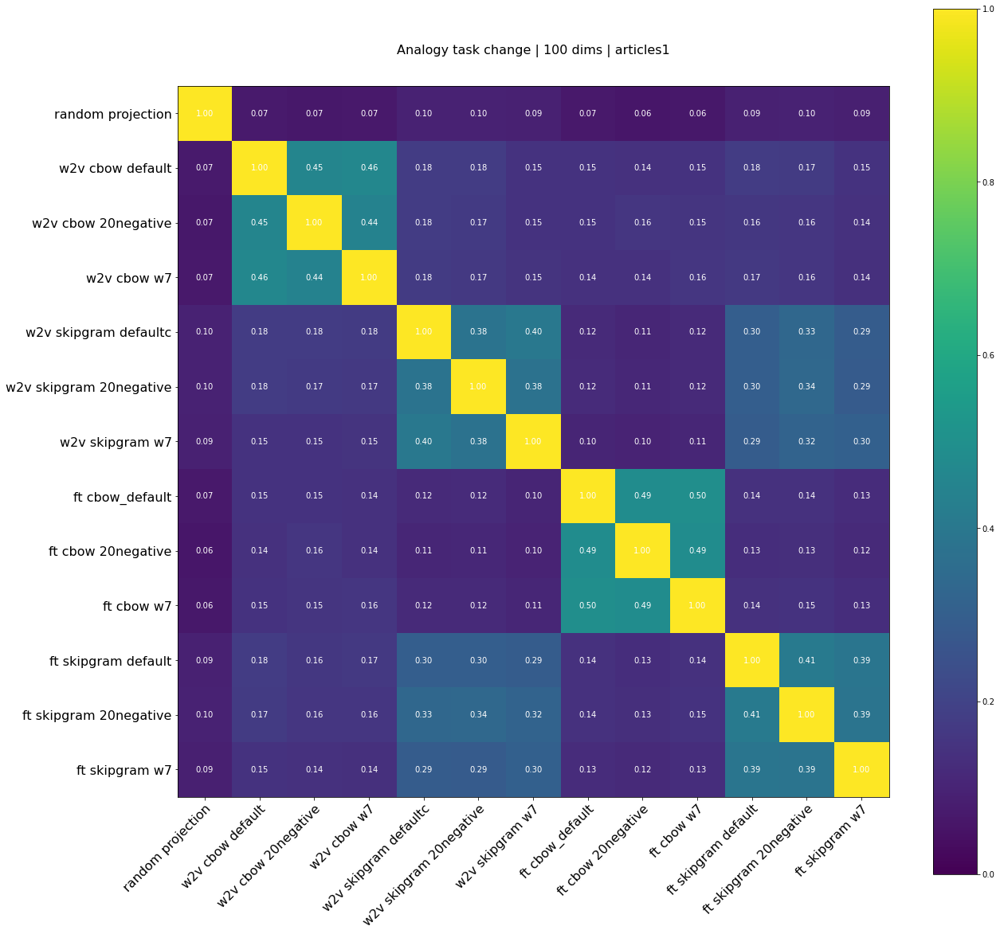

#### Word OD change

  0%|          | 0/169 [00:00<?, ?it/s]

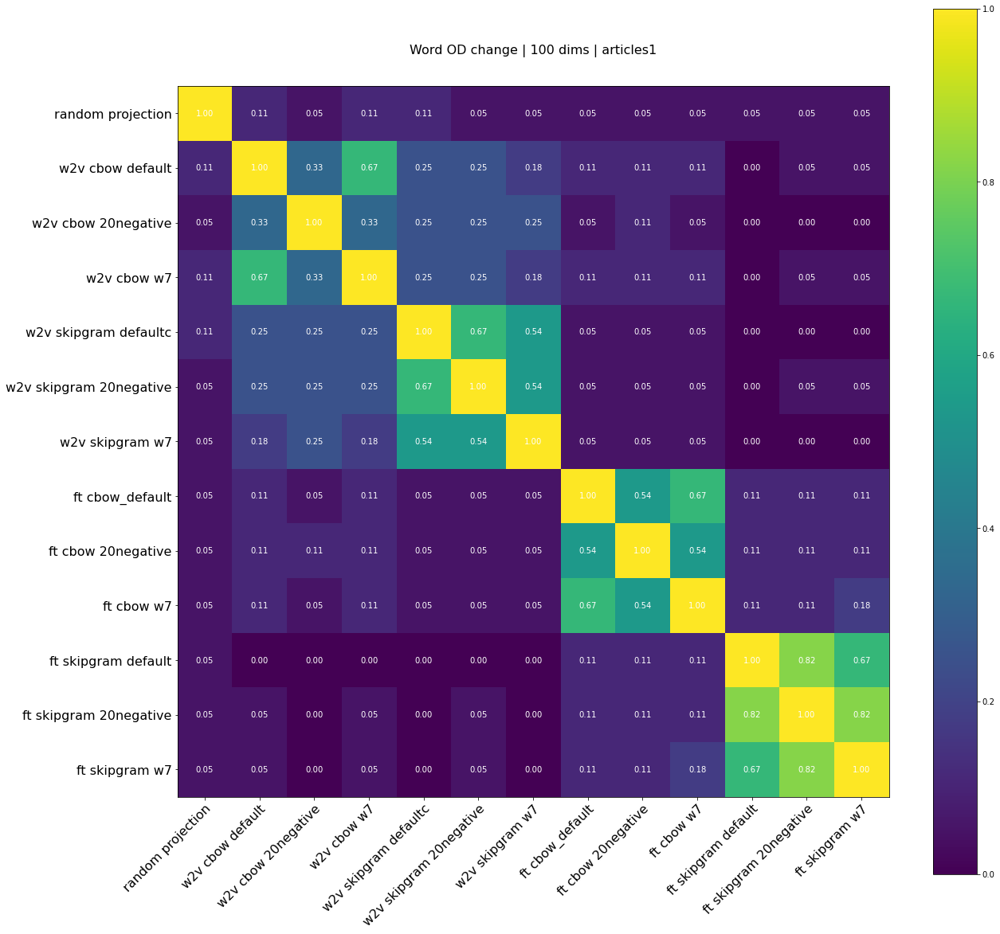

## articles2.csv

'   49999 docs used'

### 25 dims

#### Word2Vec change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

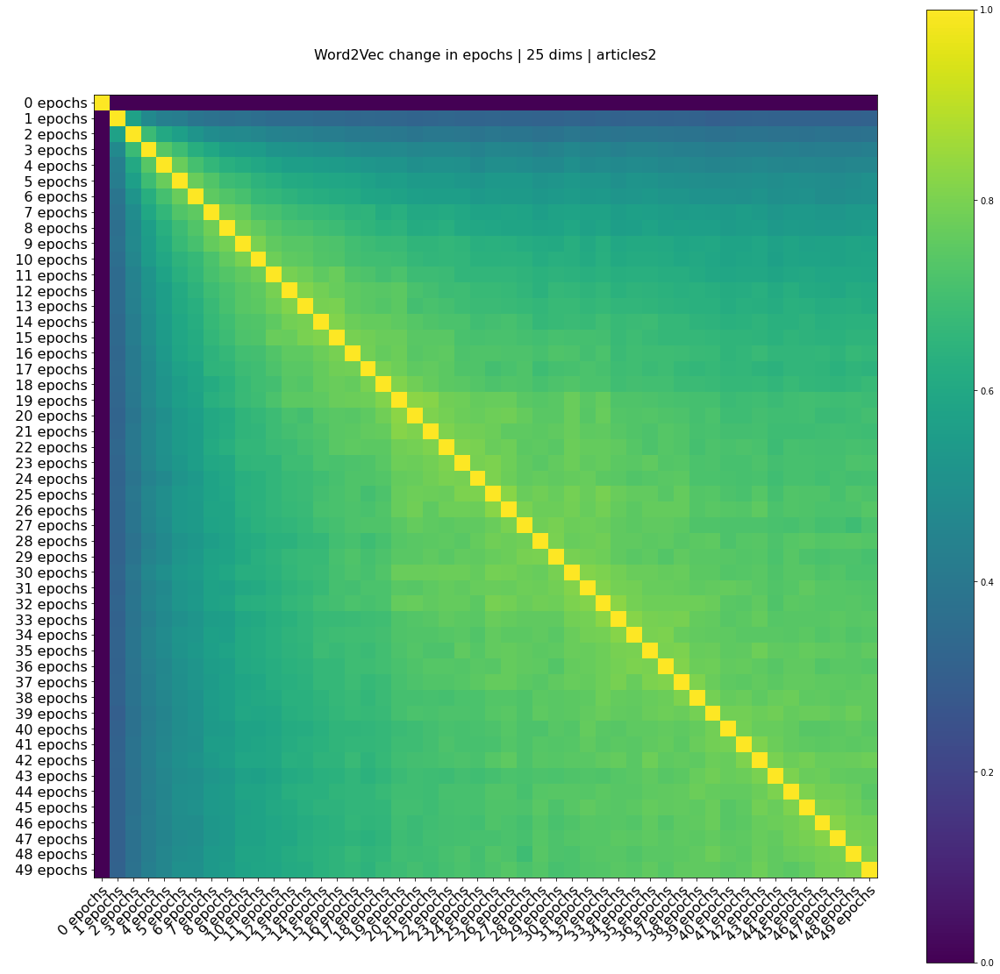

#### FastText change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

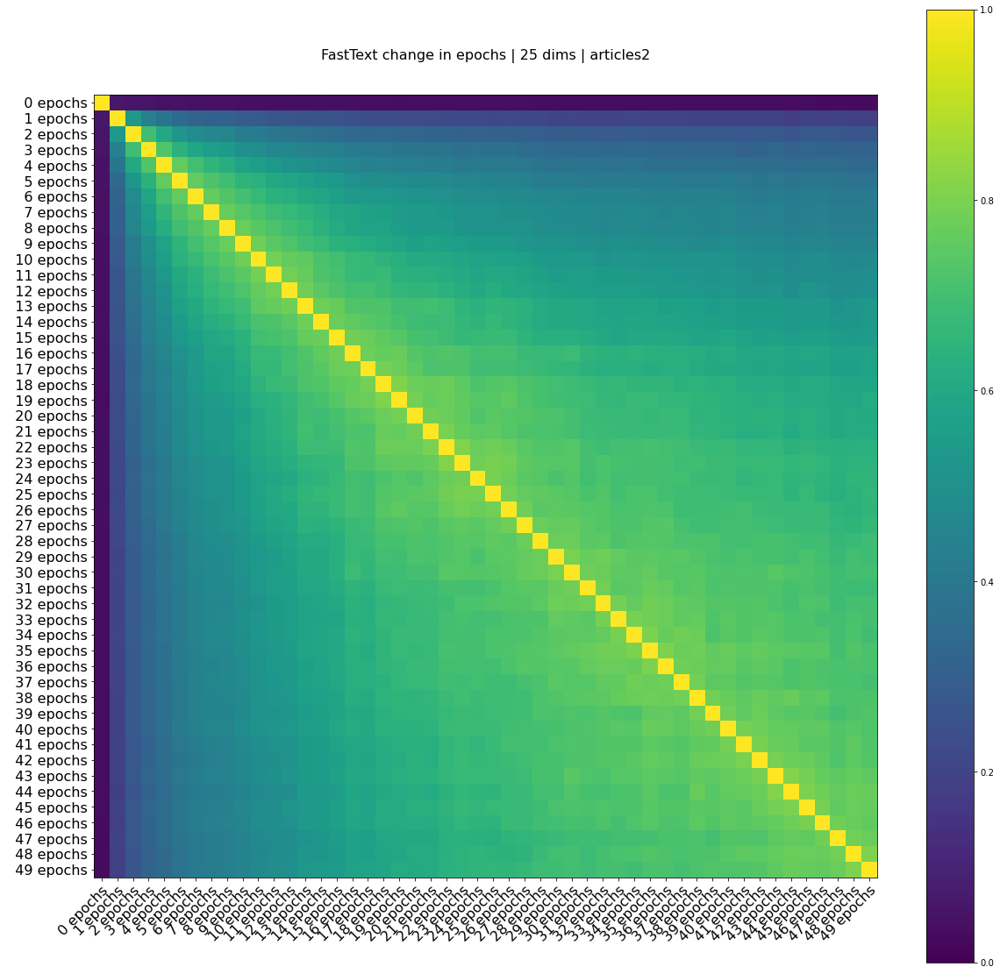

#### Train Vectors

All models:   0%|          | 0/6 [00:00<?, ?it/s]

w2v cbow default                                                                                    :   0%|   …

w2v cbow 20negative                                                                                 :   0%|   …

w2v cbow w7                                                                                         :   0%|   …

w2v skipgram defaultc                                                                               :   0%|   …

w2v skipgram 20negative                                                                             :   0%|   …

w2v skipgram w7                                                                                     :   0%|   …

All models:   0%|          | 0/6 [00:00<?, ?it/s]

ft cbow_default                                                                                     :   0%|   …

ft cbow 20negative                                                                                  :   0%|   …

ft cbow w7                                                                                          :   0%|   …

ft skipgram default                                                                                 :   0%|   …

ft skipgram 20negative                                                                              :   0%|   …

ft skipgram w7                                                                                      :   0%|   …

All models:   0%|          | 0/1 [00:00<?, ?it/s]

random projection                                                                                   : 0it [00:…

#### Word proximity change

  0%|          | 0/169 [00:00<?, ?it/s]

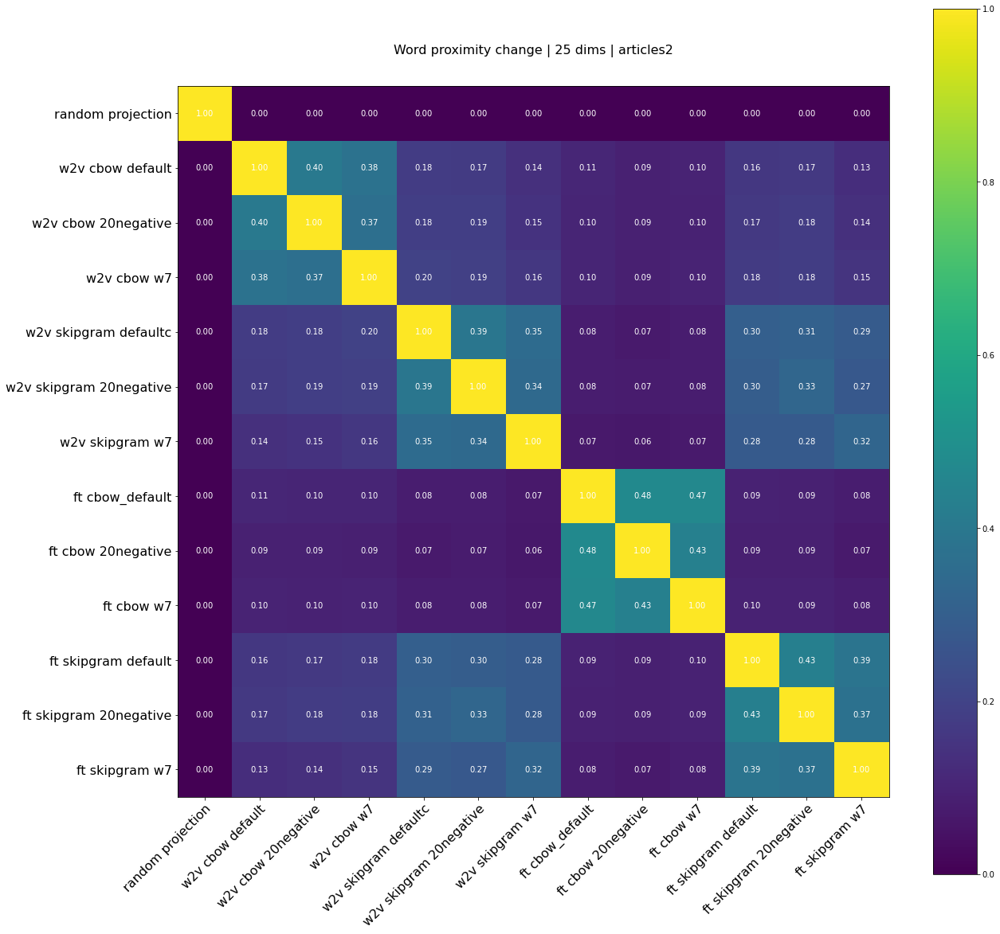

#### Analogy task change

  0%|          | 0/169 [00:00<?, ?it/s]

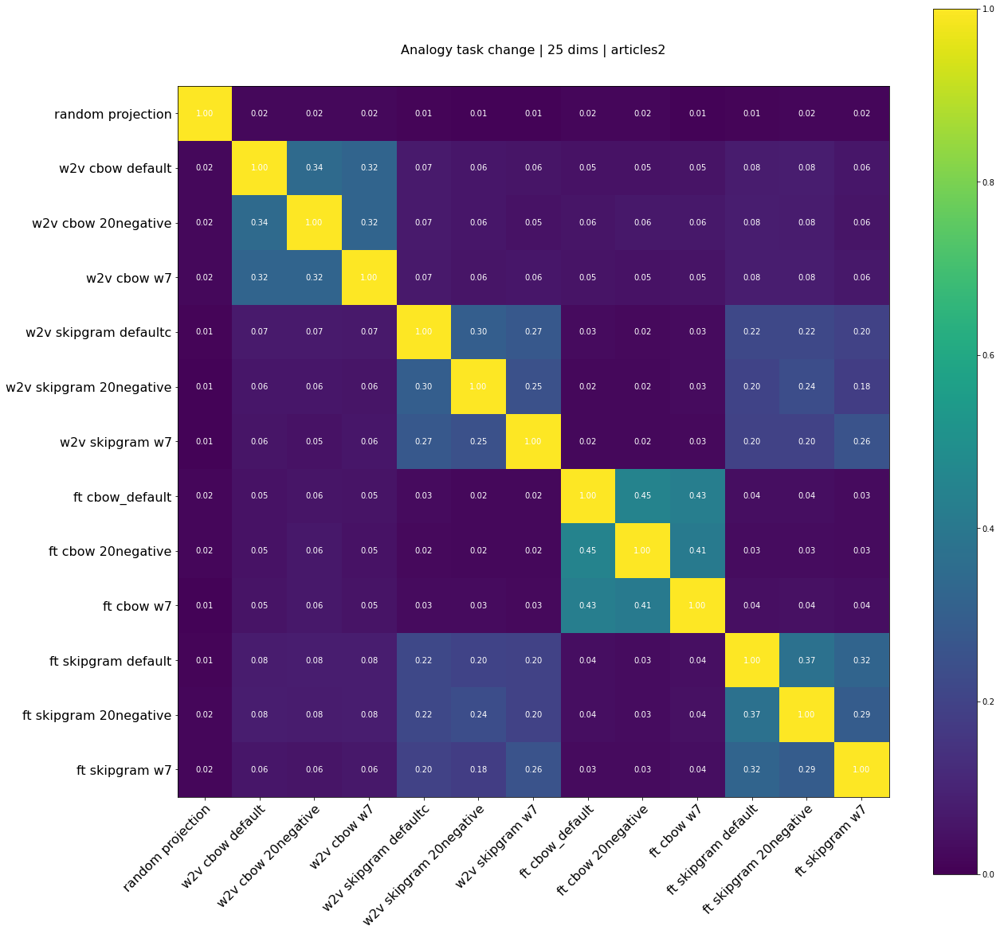

#### Word OD change

  0%|          | 0/169 [00:00<?, ?it/s]

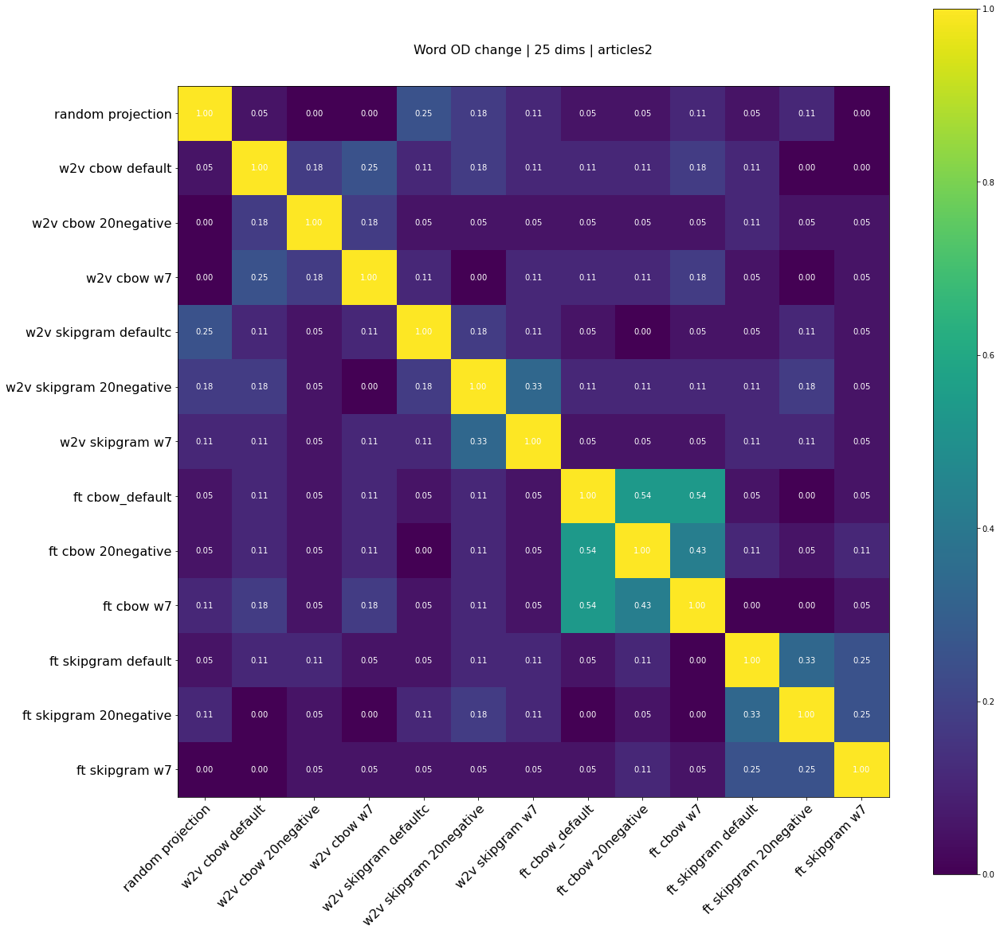

### 50 dims

#### Word2Vec change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

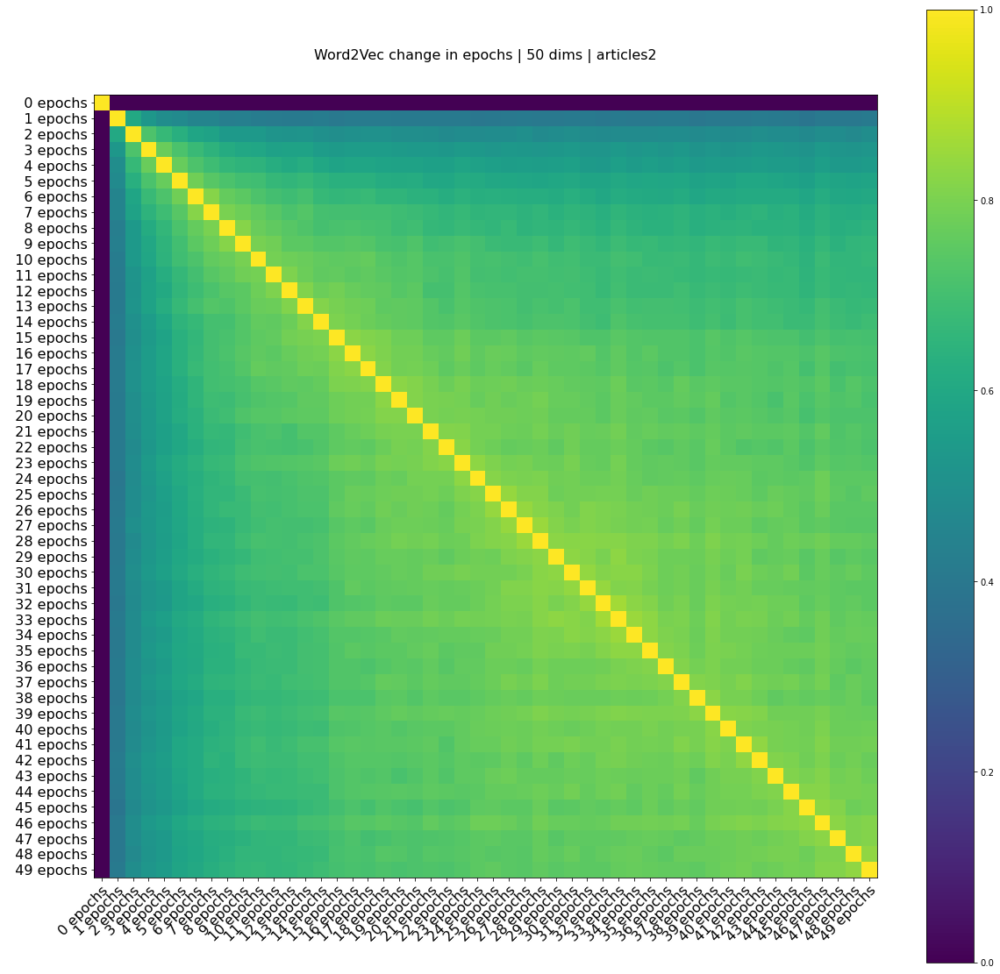

#### FastText change in epochs

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/2500 [00:00<?, ?it/s]

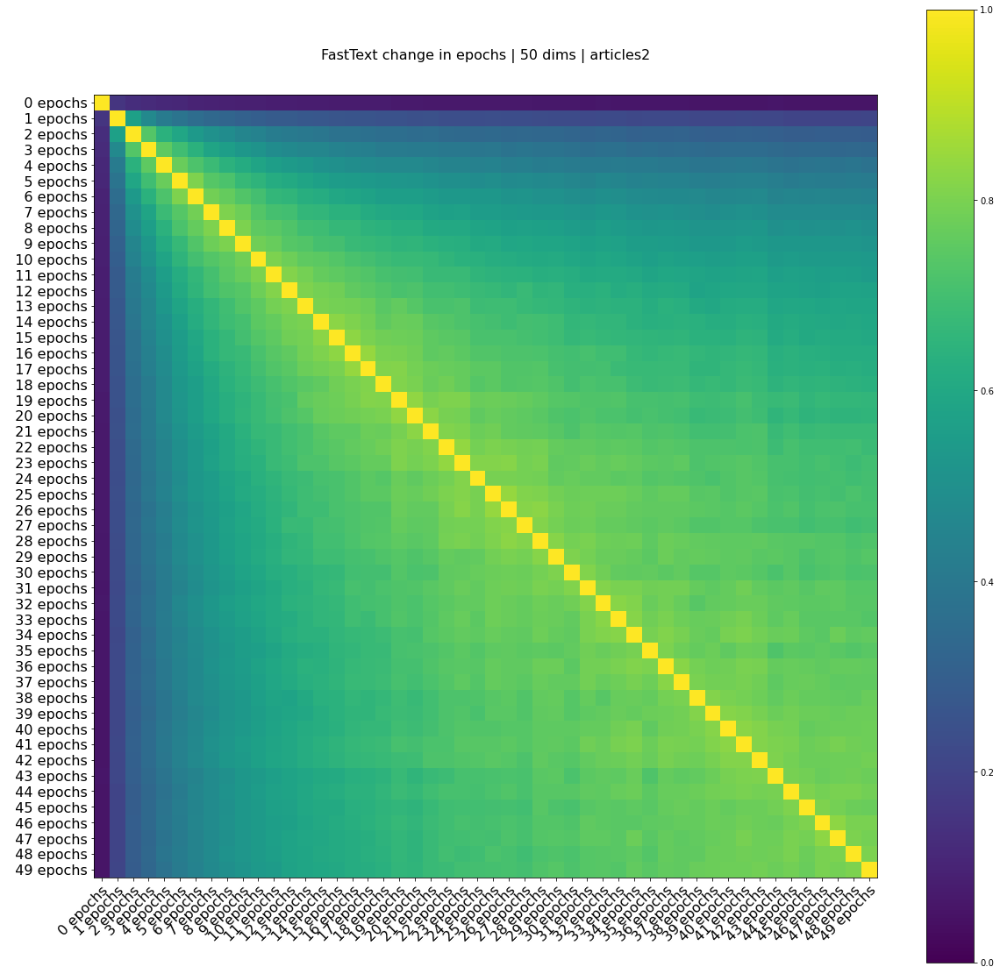

#### Train Vectors

All models:   0%|          | 0/6 [00:00<?, ?it/s]

w2v cbow default                                                                                    :   0%|   …

w2v cbow 20negative                                                                                 :   0%|   …

w2v cbow w7                                                                                         :   0%|   …

w2v skipgram defaultc                                                                               :   0%|   …

w2v skipgram 20negative                                                                             :   0%|   …

In [ ]:
%%time
random_params = {
    'random projection': {}
}

w2v_params = {
    'w2v cbow default': dict(sg=0),
#     'w2v_cbow_hs': dict(sg=0, hs=1),
    'w2v cbow 20negative': dict(sg=0, hs=0, negative=20),
   'w2v cbow w7': dict(sg=0, window=7),
   'w2v skipgram defaultc': dict(sg=1),
# #     'w2v_skipgram_hs': dict(sg=1, hs=1),
   'w2v skipgram 20negative': dict(sg=1, hs=0, negative=20),
   'w2v skipgram w7': dict(sg=1, window=7),
} 

fasttext_params = {
    'ft cbow_default': dict(sg=0),
#     'ft_cbow_hs': dict(sg=0, hs=1),
    'ft cbow 20negative': dict(sg=0, hs=0, negative=20),
    'ft cbow w7': dict(sg=0, window=7),
   'ft skipgram default': dict(sg=1),
# #     'ft_skipgram_hs': dict(sg=1, hs=1),
   'ft skipgram 20negative': dict(sg=1, hs=0, negative=20),
   'ft skipgram w7': dict(sg=1, window=7),
}


vector_sizes = [25, 50, 100]
common_params = dict(
    vector_size=25,
    alpha=0.025, 
    min_count=40, 
    workers=24,
    batch_words=10000,
)

imshow_kwargs = dict(
    vmin=0.0,
    vmax=1.0,
    fontdict=dict(size=16),
)


indexes = list(range(50))   # how many epochs to train for epoch change

sim_tables = defaultdict(lambda: defaultdict(dict))

for file_name in Path('data').glob('*.csv'):
    display(md(f'## {file_name.name}'))
    df = pd.read_csv(file_name)
    df['tokenized'] = df.text.str.lower().str.replace("[.,'!?()]", ' ', regex=True).str.split()
    if head <= 1:
        sentences = df['tokenized'].sample(frac=head)
    else:
        sentences = df['tokenized'].sample(n=head)
    display(f'{len(sentences):8} docs used')
    
    eval_on_ids = np.arange(100, 1000, 10)
    labels = [f'{i:4} epochs' for i in indexes]
    
    for vector_size in vector_sizes:
        display(md(f'### {vector_size} dims'))
        common_params['vector_size'] = vector_size
        epoch_tasks = {
            'Word2Vec change in epochs': lambda: get_similarity_epochs(Word2Vec(**common_params), sentences, eval_on_ids, indexes),
            'FastText change in epochs': lambda: get_similarity_epochs(FastText(**common_params), sentences, eval_on_ids, indexes),
        }
        for task_name, get_sim_table_ in epoch_tasks.items():
            display(md(f'#### {task_name}'))
            sim_table = get_sim_table_()
            sim_tables[f'{task_name} | {vector_size} dims']['sim_table'][file_name.stem] = sim_table
            sim_tables[f'{task_name} | {vector_size} dims']['labels'] = labels
            plot_similarity_table(sim_table, labels, title=f'{task_name} | {vector_size} dims | {file_name.stem}', **imshow_kwargs)

        display(md(f'#### Train Vectors'))
        word2vec_vecs = train_models(lambda **kwargs: 
                                    Word2Vec(sorted_vocab=1, compute_loss=False,
                                             max_final_vocab=None, shrink_windows=True,
                                             **common_params, **kwargs),
                                    w2v_params, sentences, epochs)
        fasttext_vecs = train_models(lambda **kwargs: 
                                    FastText(max_final_vocab=None, shrink_windows=True,
                                             **common_params, **kwargs),
                                    fasttext_params, sentences, epochs)
        random_vecs = train_models(lambda **kwargs: 
                                   Word2Vec(sorted_vocab=1, compute_loss=False,
                                            max_final_vocab=None, shrink_windows=True,            
                                            **common_params, **kwargs),
                                random_params, sentences, epochs=0)
        params = {**random_params, **w2v_params, **fasttext_params, }
        vecs = [*random_vecs, *word2vec_vecs, *fasttext_vecs, ]

        tokens = len(word2vec_vecs[0])
        tasks = {
            'Word proximity change': lambda: get_similarity_table_proximity(vecs, 
                                                   eval_on_ids = np.arange(100, 0.8 * tokens, 10, dtype=int),         
                                                   topn=10),
            'Analogy task change': lambda: get_similarity_table_analogy(vecs, 
                                                 eval_on_ids = np.arange(100, 0.8 * tokens, 10, dtype=int),         
                                                 topn=10),
            'Word OD change': lambda: get_similarity_table_outlier(vecs, 
                                                 eval_on_ids = np.arange(0.8 * tokens - 100, 0.8 * tokens, 1, dtype=int), 
                                                 topn=10),
            # useless task at this number of docs, better to test on Doc2Vec later
            # 'Doc OD change': lambda: get_similarity_table_doc_outlier(vecs, df['tokenized'][20:40]), 
        }
        for task_name, get_sim_table_ in tasks.items():
            display(md(f'#### {task_name}'))
            sim_table = get_sim_table_()
            sim_tables[f'{task_name} | {vector_size} dims']['sim_table'][file_name.stem] = sim_table
            sim_tables[f'{task_name} | {vector_size} dims']['labels'] = params
            plot_similarity_table(sim_table, params, title=f'{task_name} | {vector_size} dims | {file_name.stem}', **imshow_kwargs)

In [32]:
with open('sim_tables.pickle', 'wb') as wf:
    pickle.dump(dict(sim_tables), wf)

## Explore sim tables similarity

<ipython-input-25-734938776e82>:4: RuntimeWarning: invalid value encountered in true_divide
  std_ratio = std / mean


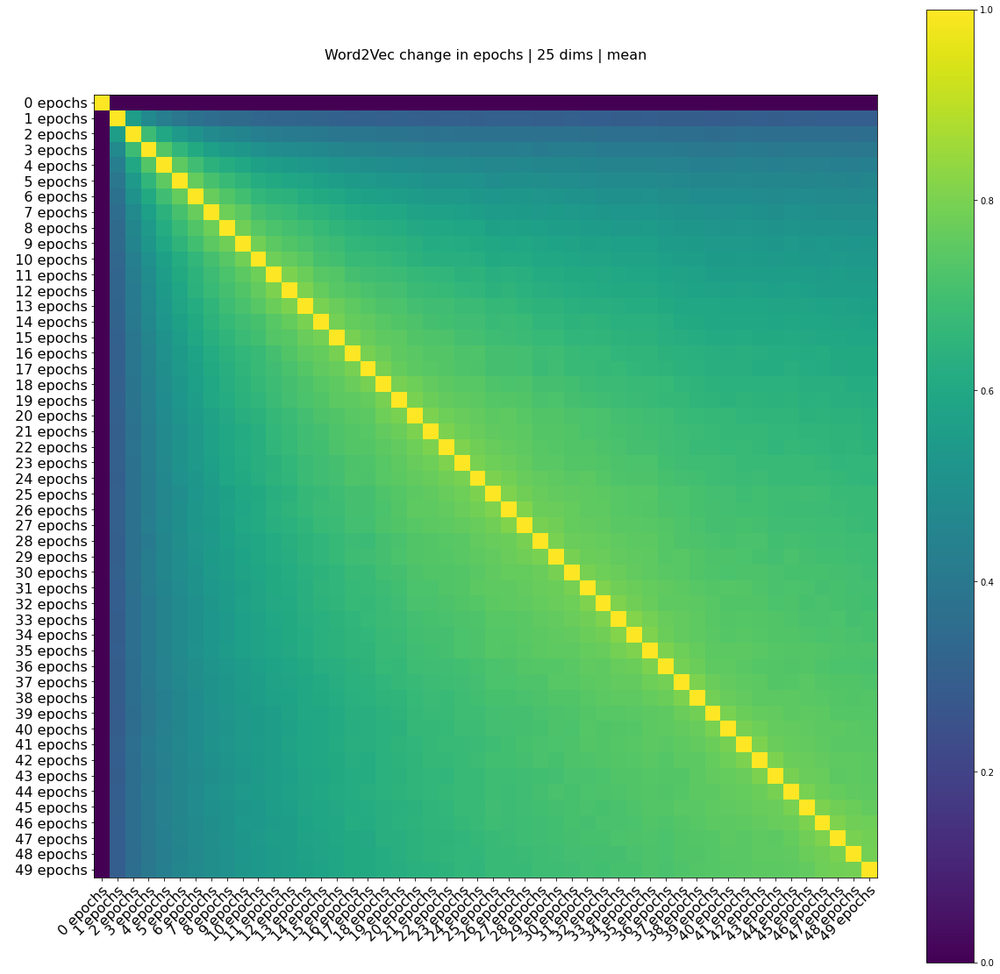

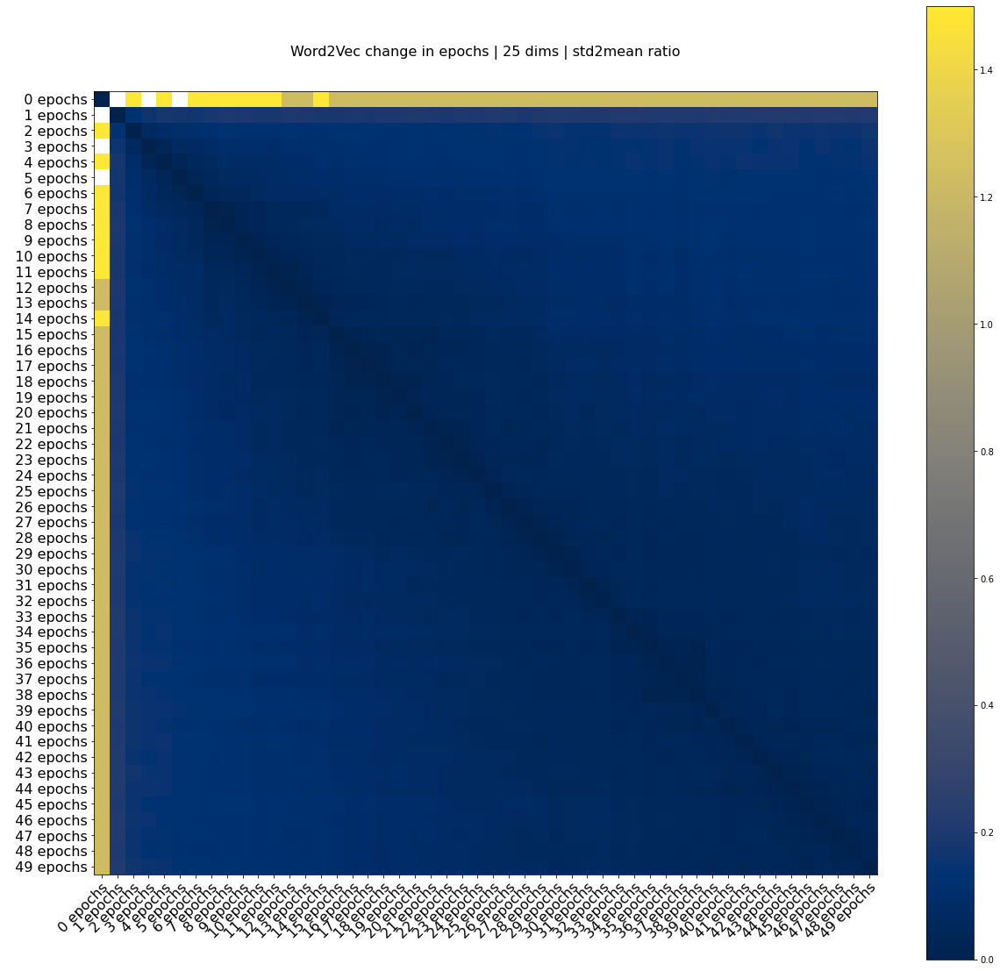

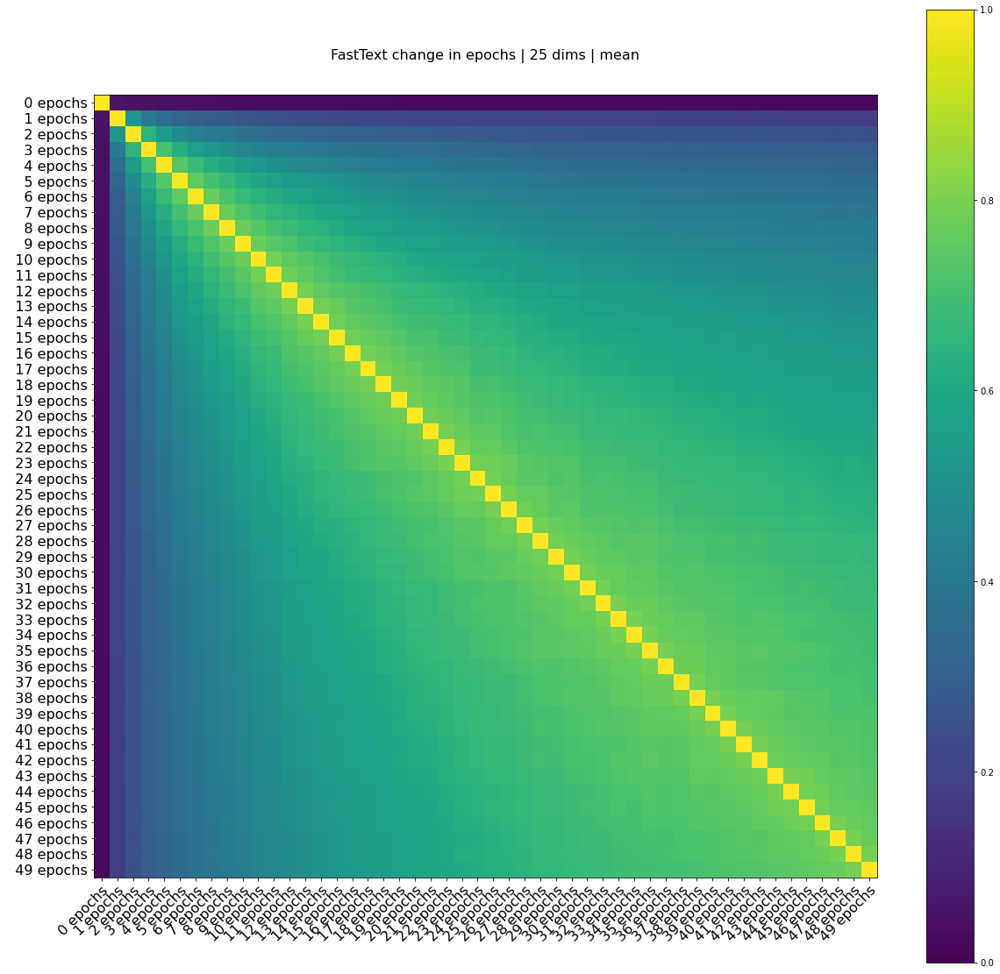

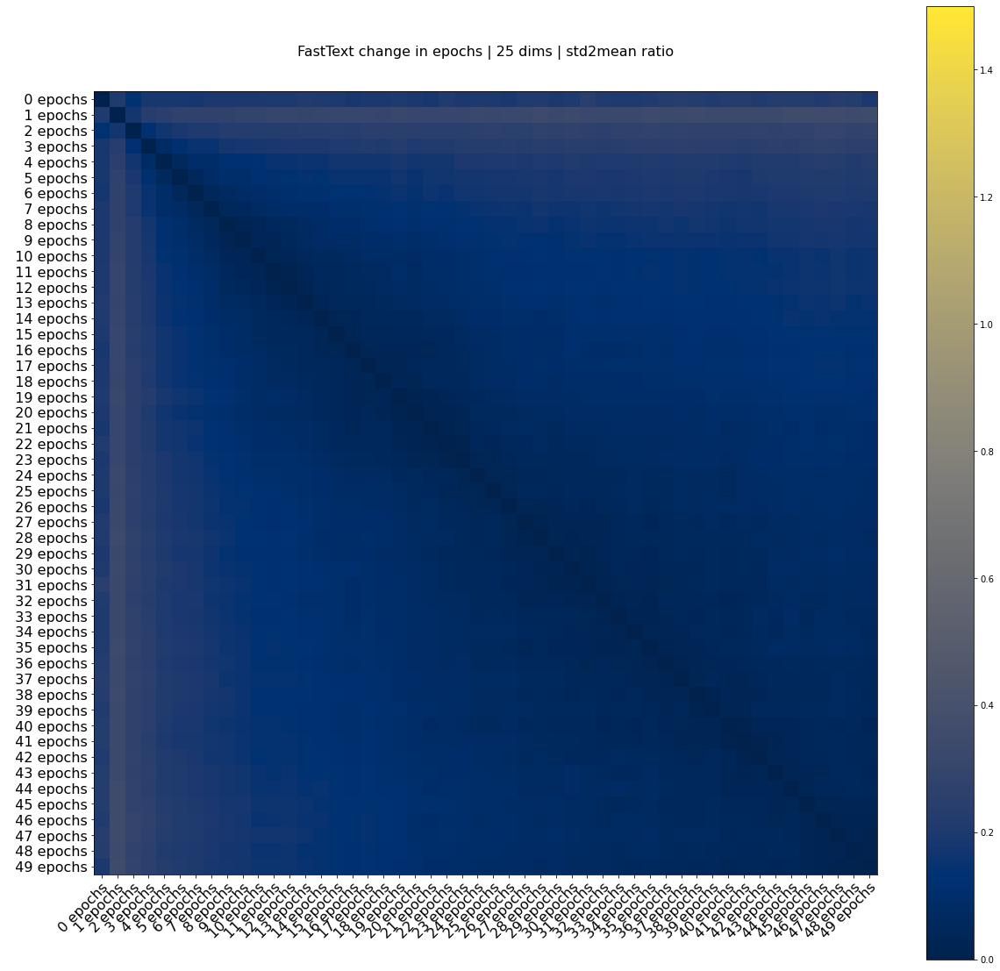

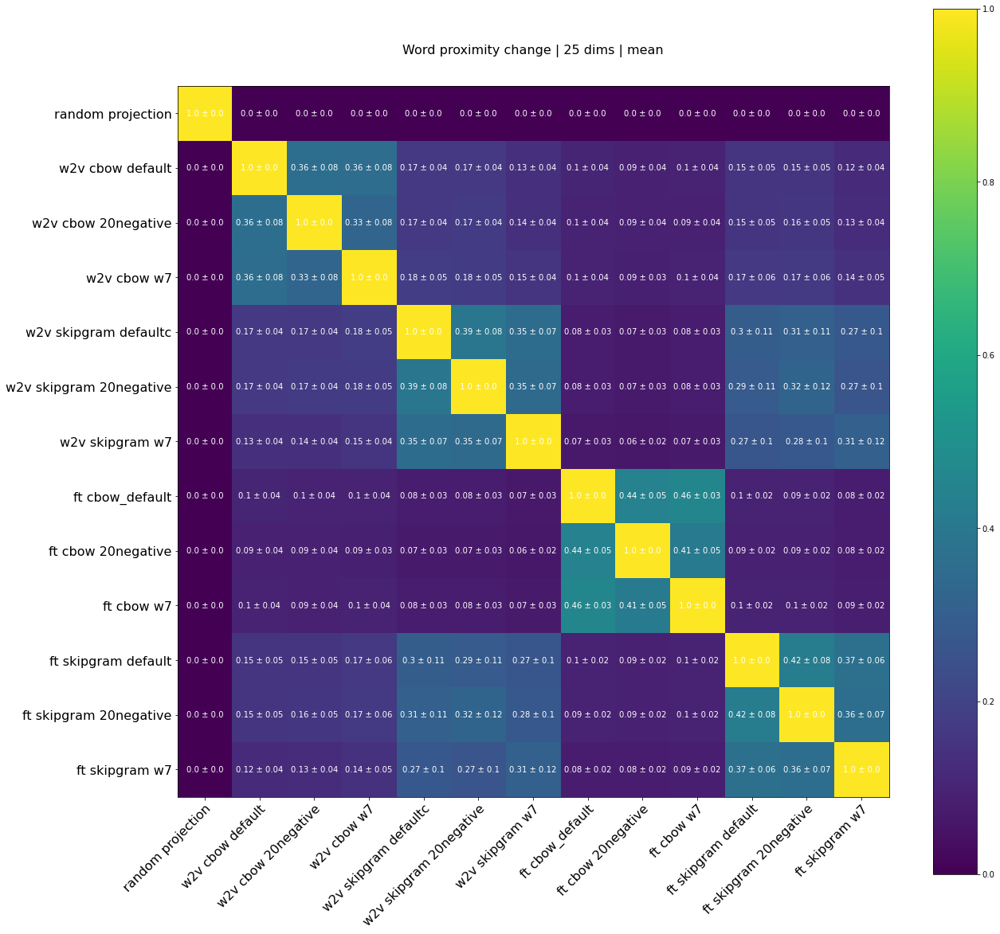

...

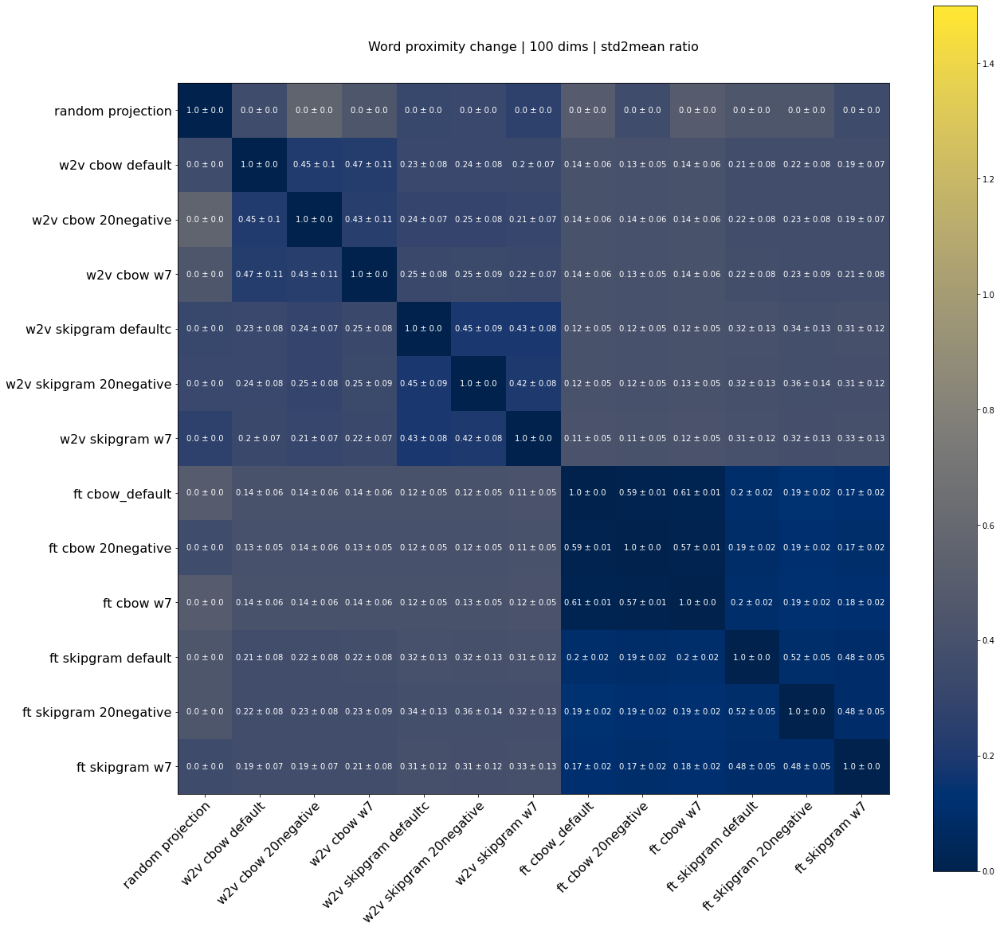

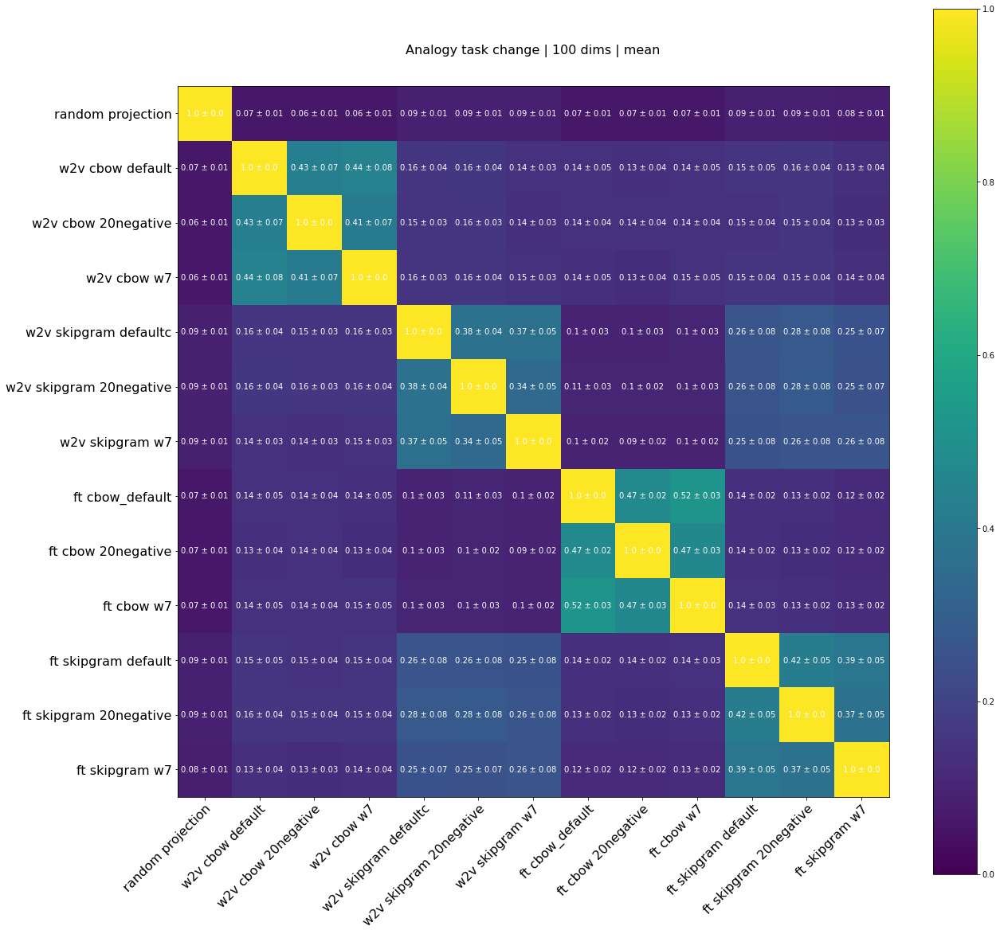

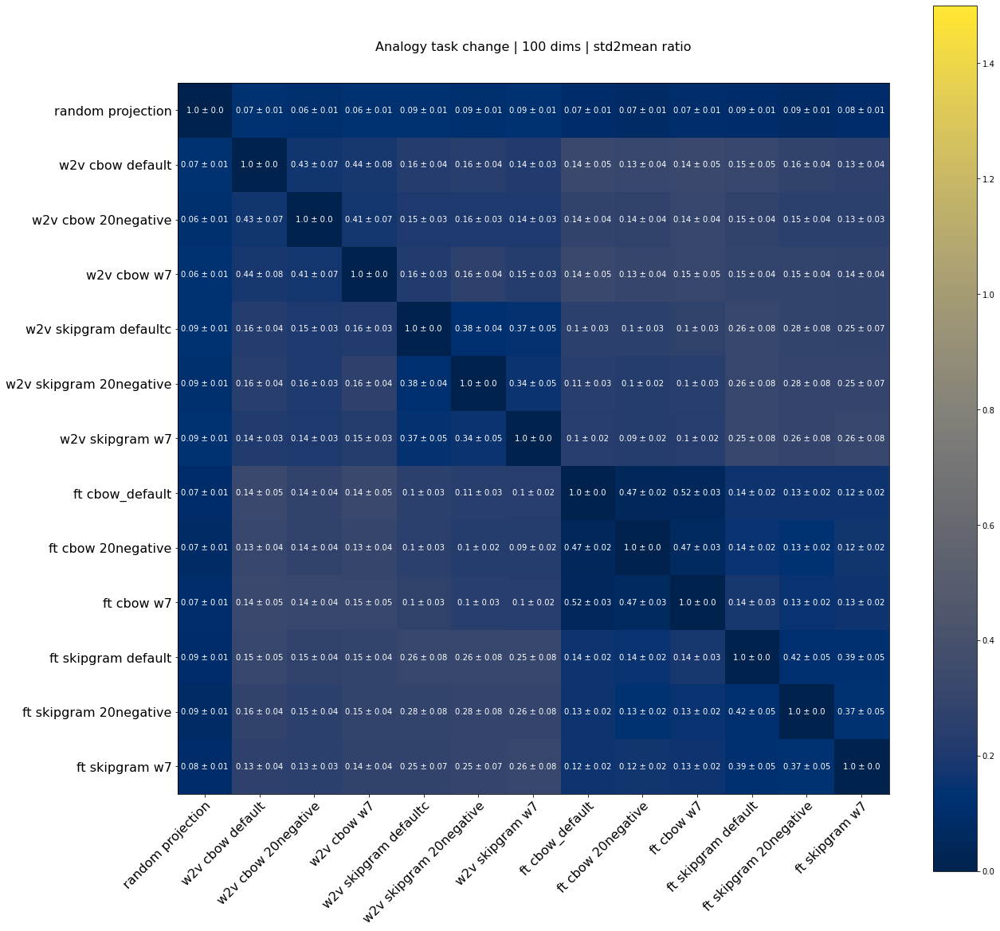

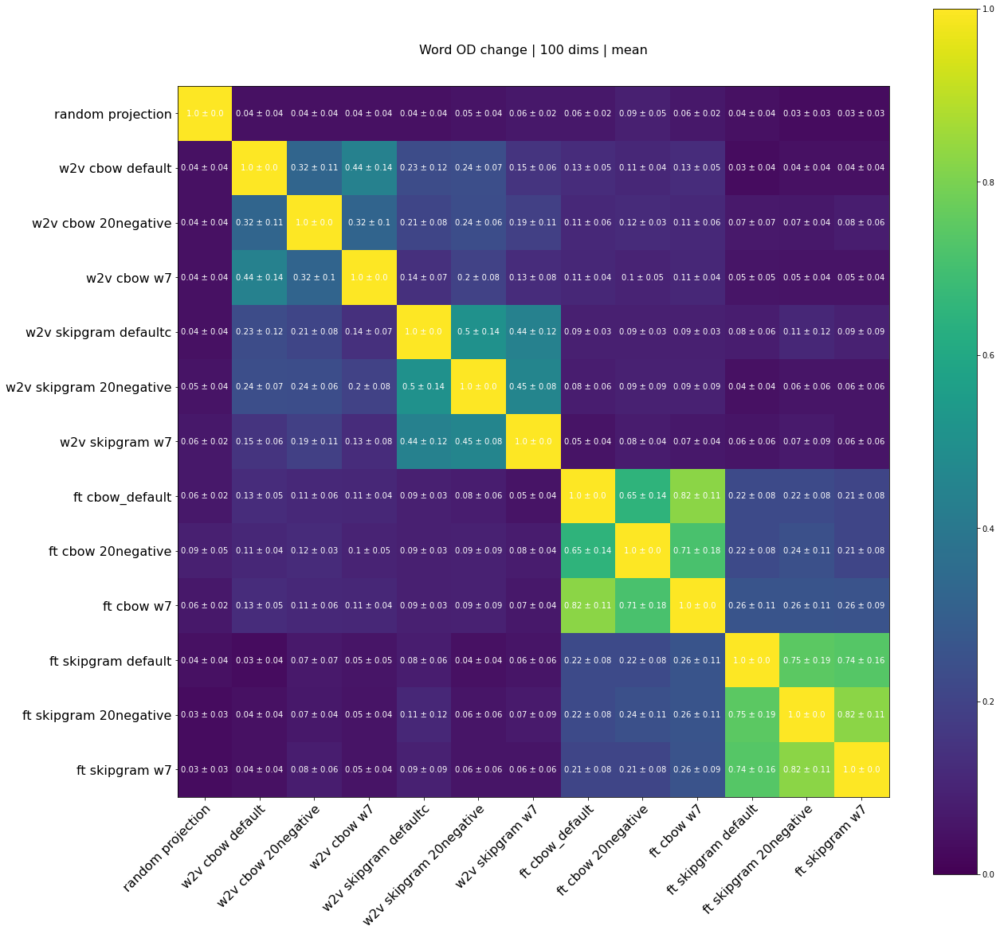

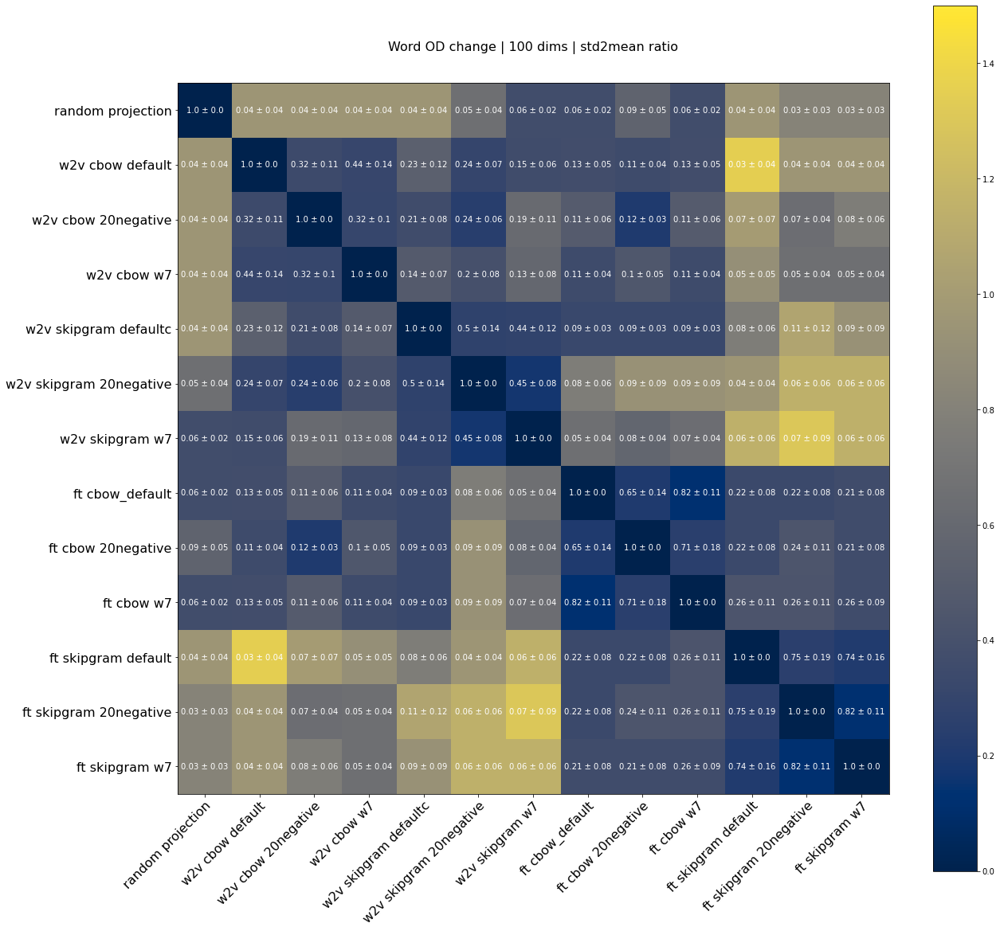

In [25]:
for task_name, tables in sim_tables.items():
    mean = np.array(list(tables['sim_table'].values())).mean(axis=0)
    std = np.array(list(tables['sim_table'].values())).std(axis=0)
    std_ratio = std / mean
    texts = pd.DataFrame(mean).round(2).astype(str) + ' ± ' + std.round(2).astype(str)
    _ = plot_similarity_table(mean, tables['labels'], title=f'{task_name} | mean', texts=texts.values, **imshow_kwargs)
    _ = plot_similarity_table(std_ratio, tables['labels'], title=f'{task_name} | std2mean ratio', texts=texts.values, vmin=0.0, vmax=1.5, cmap=plt.cm.cividis, fontdict=dict(size=16))

### Late epochs

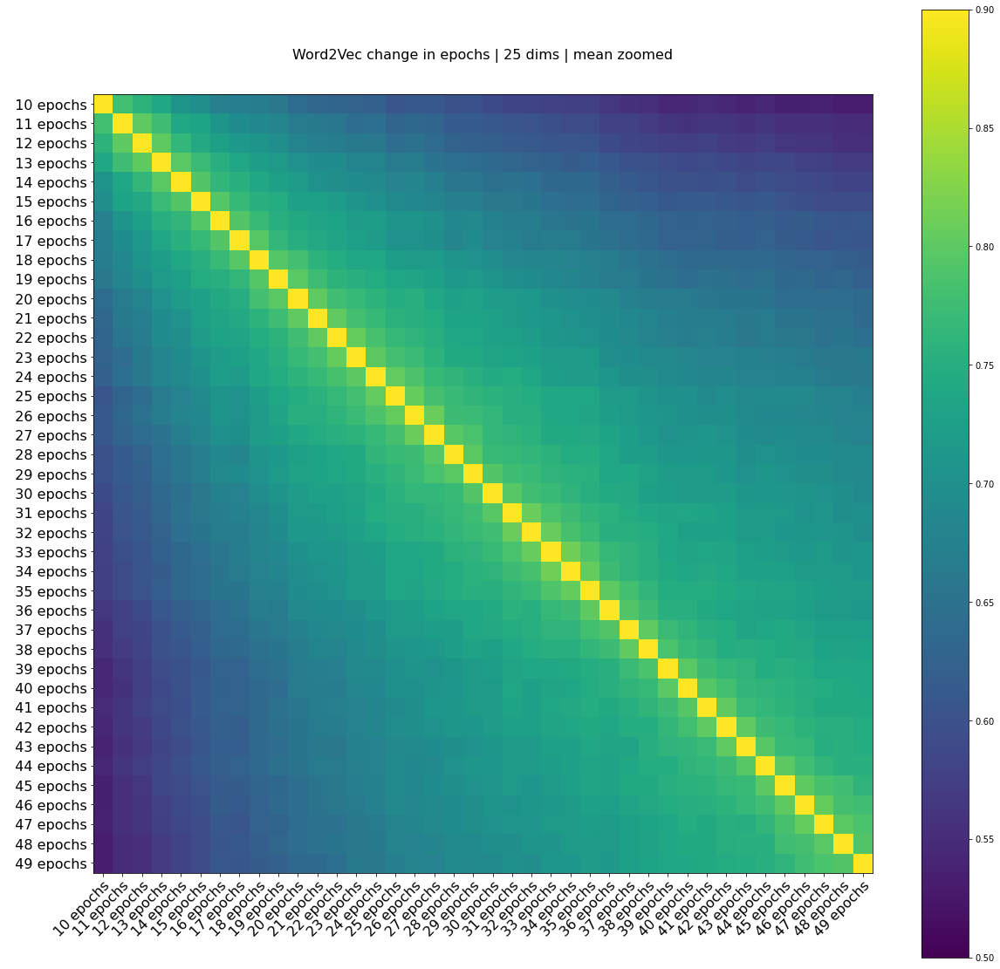

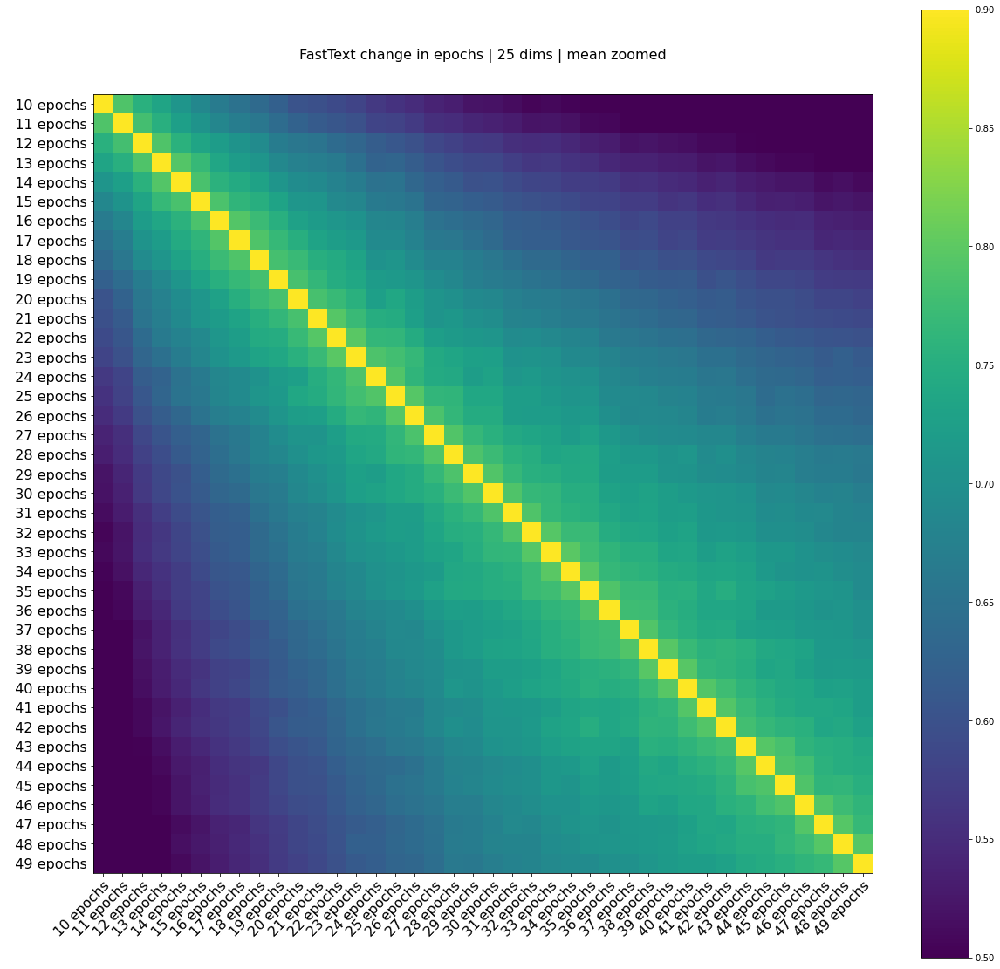

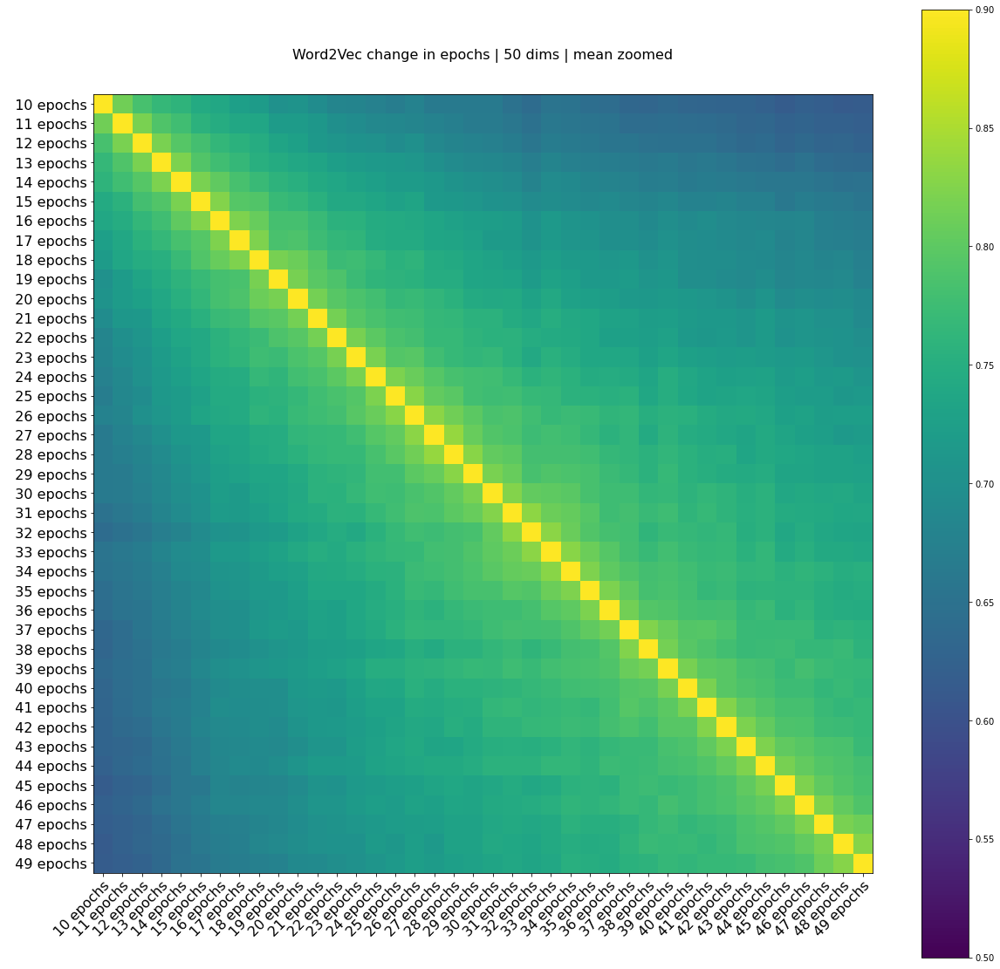

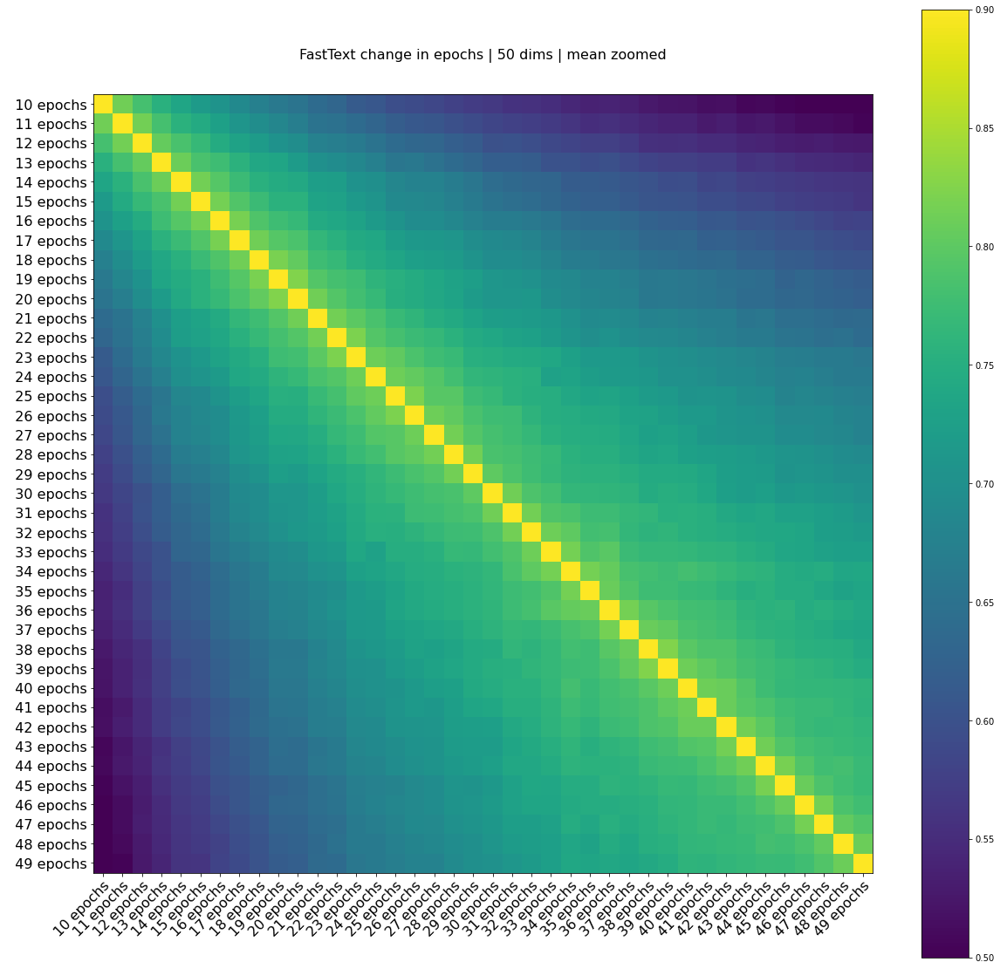

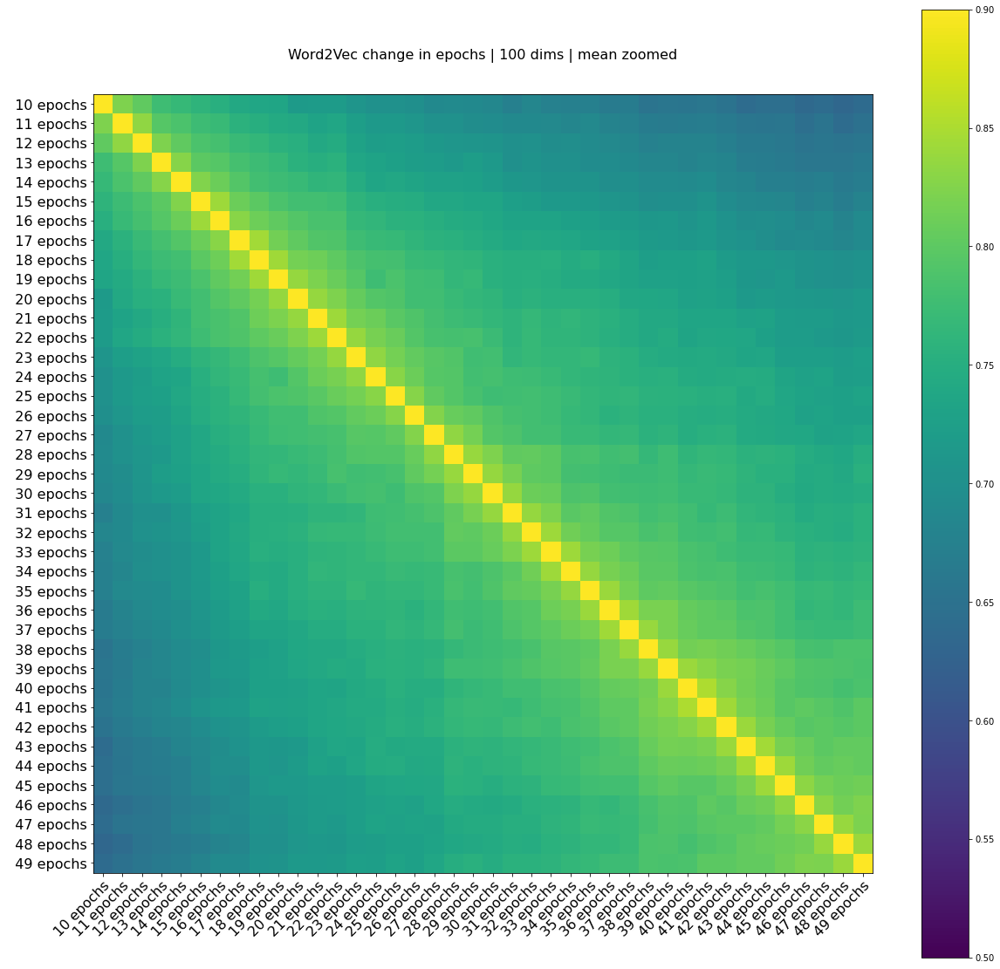

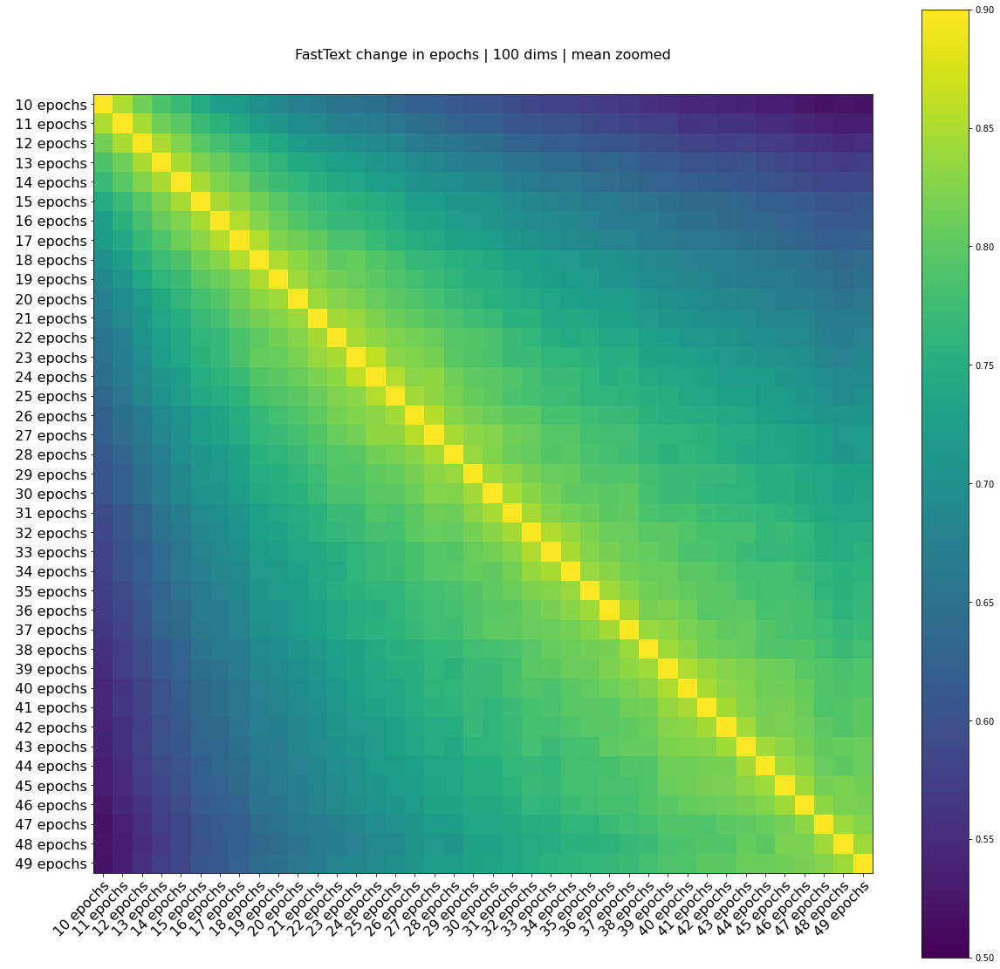

In [24]:
for task_name, tables in sim_tables.items():
    if 'epochs' in task_name:
        start, end = 10, None
        sim_table = np.array(list(tables['sim_table'].values()))[:, start:end, start:end]
        mean = sim_table.mean(axis=0)
        std = sim_table.std(axis=0)
        std_ratio = std / mean
        texts = pd.DataFrame(mean).round(2).astype(str) + ' ± ' + std.round(2).astype(str)
        _ = plot_similarity_table(mean, tables['labels'][start:end], title=f'{task_name} | mean zoomed', texts=texts.values, vmin=0.5, vmax=0.9, fontdict=dict(size=16))
#         _ = plot_similarity_table(std_ratio, tables['labels'], title=f'{task_name} | std2mean ratio', texts=texts.values, vmin=0.0, vmax=1.5, cmap=plt.cm.cividis, fontdict=dict(size=16))

# Experiment by hand

## Word2Vec

In [ ]:
%%time

sentences = df['tokenized'].iloc[:head]
model = Word2Vec(sentences=sentences, vector_size=100, window=5, min_count=20, workers=12, epochs=1)
model.save("word2vec.model")

CPU times: user 1.63 s, sys: 19.9 ms, total: 1.65 s
Wall time: 1.02 s


In [ ]:
%%time

# train multiple models with different epochs and save them
word_vecs = {}
for i in tqdm(range(50)):
   word_vecs[i] = copy.deepcopy(model.wv)
   model.train(sentences, total_examples=len(df), epochs=1)
word_vecs[i+1] = copy.deepcopy(model.wv)

  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 1min 9s, sys: 702 ms, total: 1min 10s
Wall time: 38.2 s


### Epochs change in word proximity

  0%|          | 0/2601 [00:00<?, ?it/s]

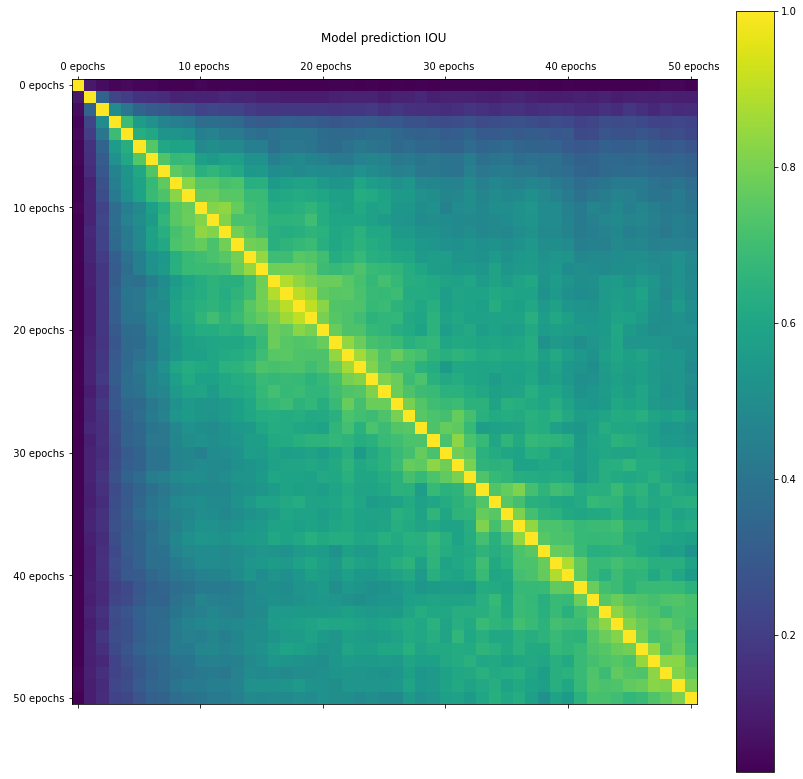

In [ ]:
eval_on_ids = np.arange(100, 1000, 100)
sim_table = get_similarity_table_proximity(word_vecs, eval_on_ids)
labels = [f'{i:4} epochs' for i in word_vecs.keys()][::len(word_vecs)//5]
plot_similarity_table(sim_table, labels)

## FastText change in epochs

Cell started
Model created


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

<ipython-input-6-97206122e624>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + [x.replace("_", "\n") for x in labels_])
<ipython-input-6-97206122e624>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels_)


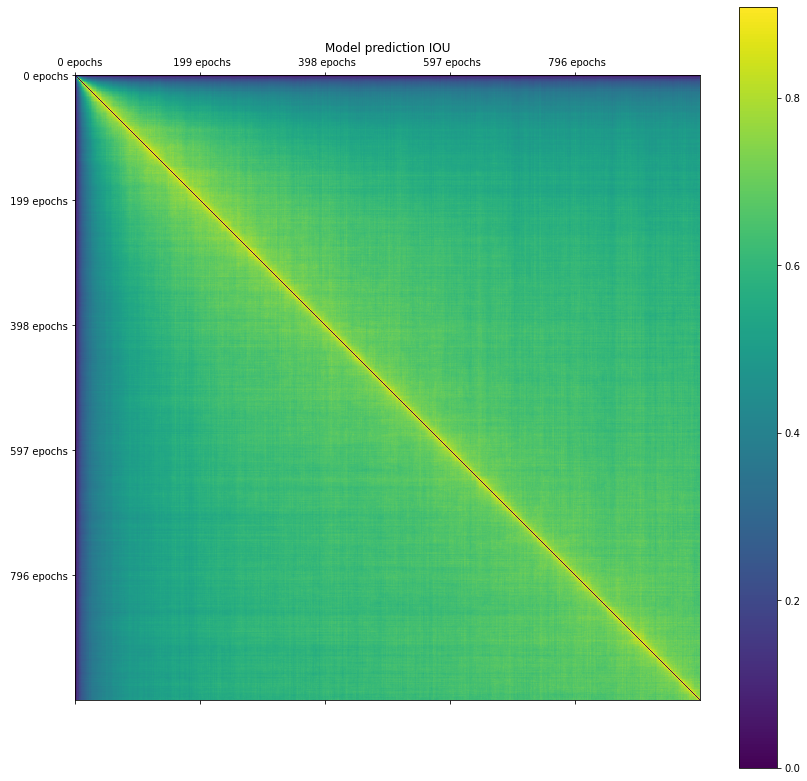

In [11]:
# "efficient" calculation of a similarities on a model across multiple epochs




sentences = df['tokenized'].iloc[:head]
#model = Word2Vec(sentences=sentences, vector_size=100, window=5, min_count=20, workers=12, epochs=1)
model = FastText(vector_size=100, min_count=40, workers=12, )
model.build_vocab(corpus_iterable=sentences)

eval_on_ids = np.arange(100, 1000, 10)
indexes = list(range(1000))
sim_table = get_sim_table_epochs(model, sentences, eval_on_ids, indexes)
labels = [f'{i:4} epochs' for i in indexes][::len(indexes)//5-1]
plot_similarity_table(sim_table, labels)

### Different param experiments

All models:   0%|          | 0/6 [00:00<?, ?it/s]

w2v_cbow_basic                                                                                      :   0%|   …

w2v_cbow_20negative                                                                                 :   0%|   …

w2v_cbow_w7                                                                                         :   0%|   …

w2v_skipgram_basic                                                                                  :   0%|   …

w2v_skipgram_20negative                                                                             :   0%|   …

w2v_skipgram_w7                                                                                     :   0%|   …

  0%|          | 0/36 [00:00<?, ?it/s]

<ipython-input-6-97206122e624>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + [x.replace("_", "\n") for x in labels_])
<ipython-input-6-97206122e624>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels_)


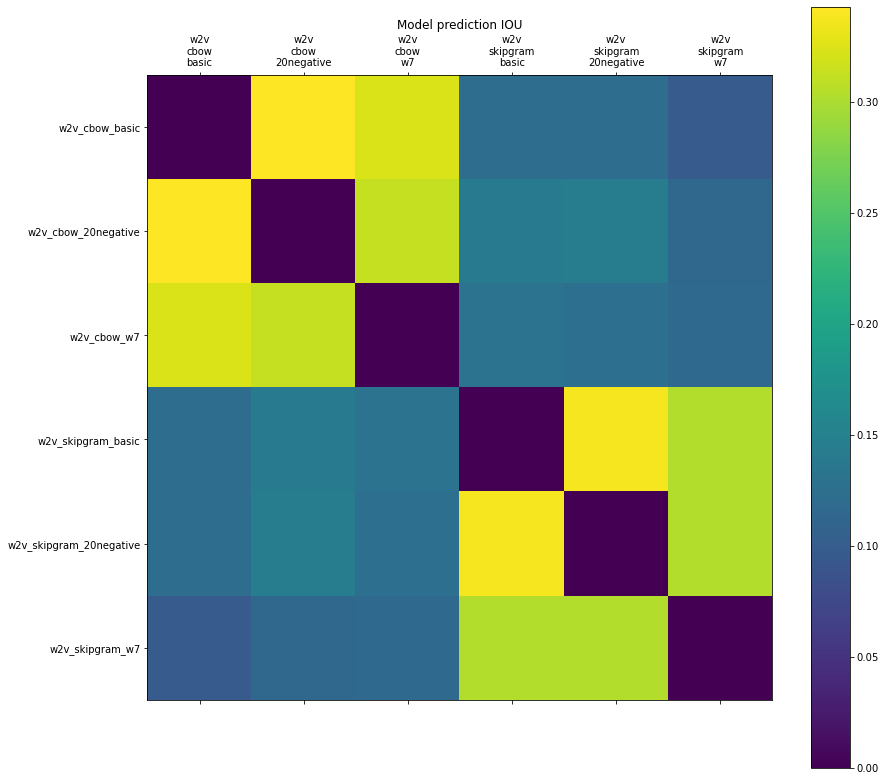

In [13]:
# sg = skipgram, hs = ??? 
w2v_params = {
    'w2v_cbow_basic': dict(sg=0),
#     'w2v_cbow_hs': dict(sg=0, hs=1),
    'w2v_cbow_20negative': dict(sg=0, hs=0, negative=20),
   'w2v_cbow_w7': dict(sg=0, window=7),
   'w2v_skipgram_basic': dict(sg=1),
#     'w2v_skipgram_hs': dict(sg=1, hs=1),
   'w2v_skipgram_20negative': dict(sg=1, hs=0, negative=20),
   'w2v_skipgram_w7': dict(sg=1, window=7),
} 

word_vecs = train_word2vec_models(w2v_params, sentences)
sim_table = get_similarity_table_proximity(word_vecs, 
                                 eval_on_ids = np.arange(100, 5000, 10), 
                                 topn=10)
labels = [i for i in w2v_params]#[::len(word_vecs)//5]|
plot_similarity_table(sim_table, labels)

In [12]:
with open("w2v_v_p.pickle", "wb") as ff:
    pickle.dump([word_vecs, w2v_params], ff)

  0%|          | 0/36 [00:00<?, ?it/s]

<ipython-input-8-97206122e624>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + [x.replace("_", "\n") for x in labels_])
<ipython-input-8-97206122e624>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels_)


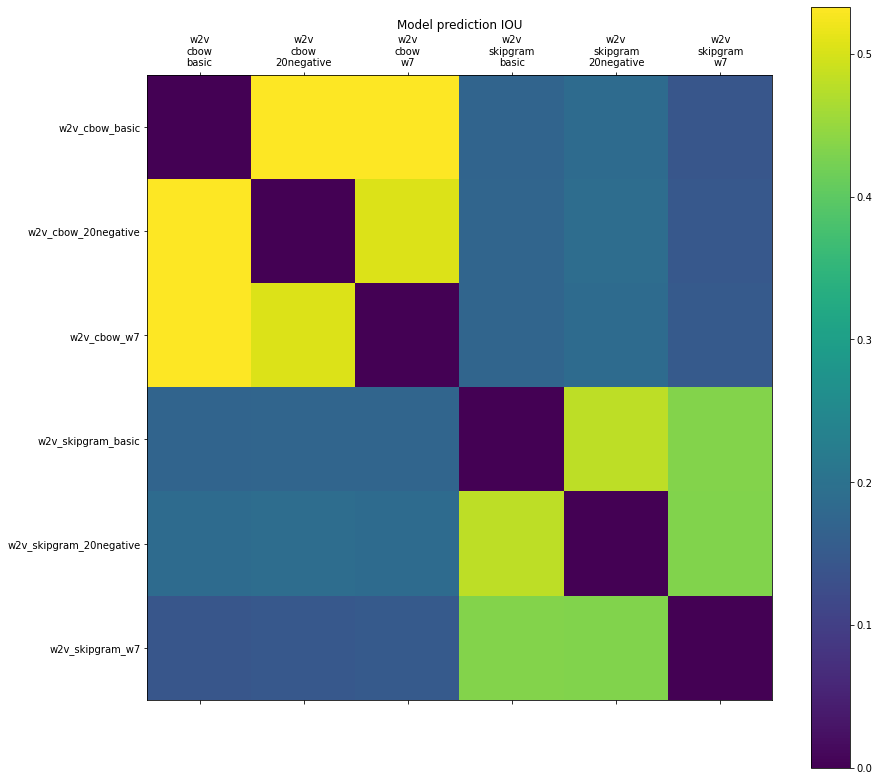

In [13]:
sim_table = get_similarity_table_proximity(word_vecs, 
                                 eval_on_ids = np.arange(5000, 7000, 50), 
                                 topn=100)
sim_table -= np.eye(len(sim_table))
labels = [i for i in w2v_params.keys()]#[::len(word_vecs)//5]|
plot_similarity_table(sim_table, labels)

  0%|          | 0/36 [00:00<?, ?it/s]

<ipython-input-8-97206122e624>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + [x.replace("_", "\n") for x in labels_])
<ipython-input-8-97206122e624>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels_)


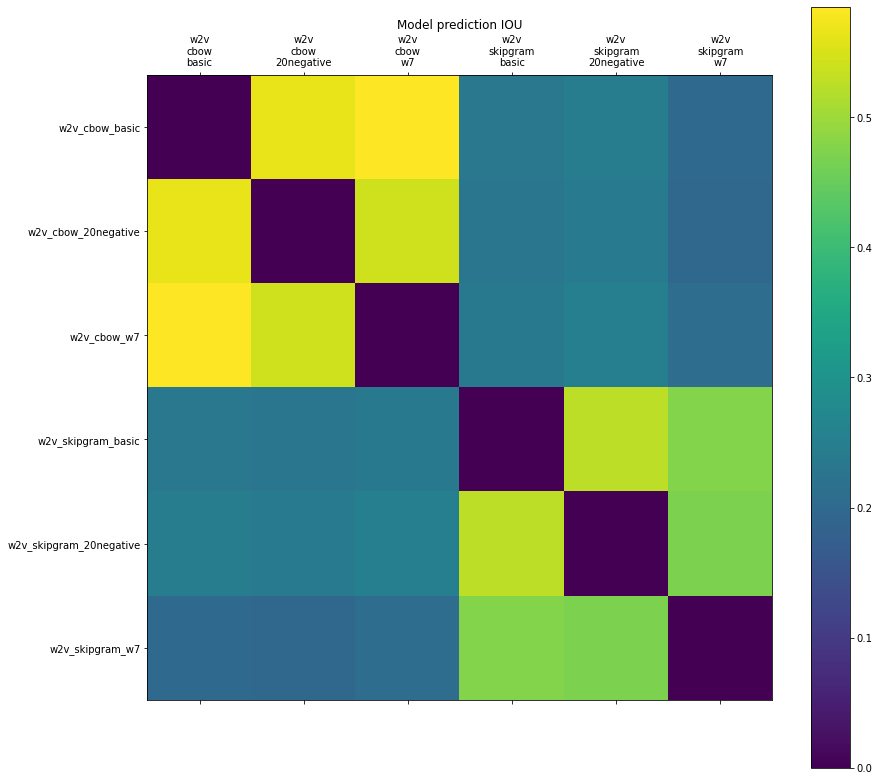

In [14]:
sim_table = get_similarity_table_proximity(word_vecs, 
                                 eval_on_ids = np.arange(100, 5000, 10), 
                                 topn=10)
sim_table -= np.eye(len(sim_table))
labels = [i for i in w2v_params.keys()]#[::len(word_vecs)//5]|
plot_similarity_table(sim_table, labels)

  0%|          | 0/36 [00:00<?, ?it/s]

<ipython-input-8-97206122e624>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + [x.replace("_", "\n") for x in labels_])
<ipython-input-8-97206122e624>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels_)


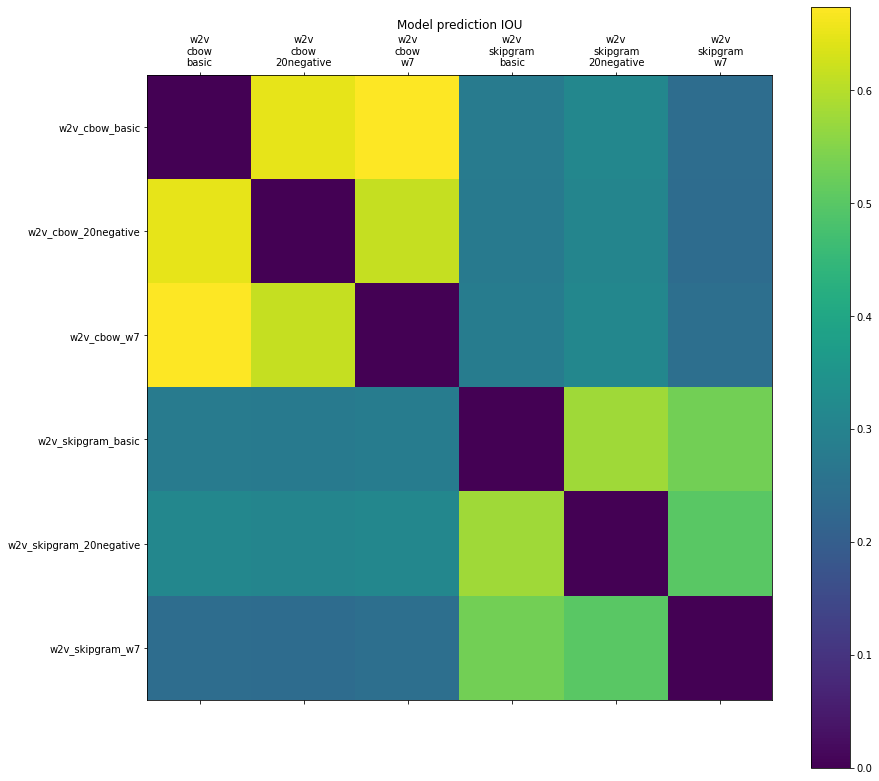

In [15]:
sim_table = get_similarity_table_proximity(word_vecs, 
                                 eval_on_ids = np.arange(100, 500, 1), 
                                 topn=10)
sim_table -= np.eye(len(sim_table))
labels = [i for i in w2v_params.keys()]#[::len(word_vecs)//5]|
plot_similarity_table(sim_table, labels)

## FastText

In [16]:
fasttext_params = {
    'ft_cbow_basic': dict(sg=0),
#     'ft_cbow_hs': dict(sg=0, hs=1),
    'ft_cbow_20negative': dict(sg=0, hs=0, negative=20),
    'ft_cbow_w7': dict(sg=0, window=7),
   'ft_skipgram_basic': dict(sg=1),
#     'ft_skipgram_hs': dict(sg=1, hs=1),
   'ft_skipgram_20negative': dict(sg=1, hs=0, negative=20),
   'ft_skipgram_w7': dict(sg=1, window=7),
}

fasttext_vecs = train_fasttext_models(fasttext_params, sentences)

All models:   0%|          | 0/6 [00:00<?, ?it/s]

ft_cbow_basic                                                                                       :   0%|   …

ft_cbow_20negative                                                                                  :   0%|   …

ft_cbow_w7                                                                                          :   0%|   …

ft_skipgram_basic                                                                                   :   0%|   …

ft_skipgram_20negative                                                                              :   0%|   …

ft_skipgram_w7                                                                                      :   0%|   …

In [17]:
with open("fastext_v_p.pickle", "wb") as ff:
    pickle.dump([fasttext_vecs, fasttext_params], ff)

  0%|          | 0/36 [00:00<?, ?it/s]

<ipython-input-8-97206122e624>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + [x.replace("_", "\n") for x in labels_])
<ipython-input-8-97206122e624>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels_)


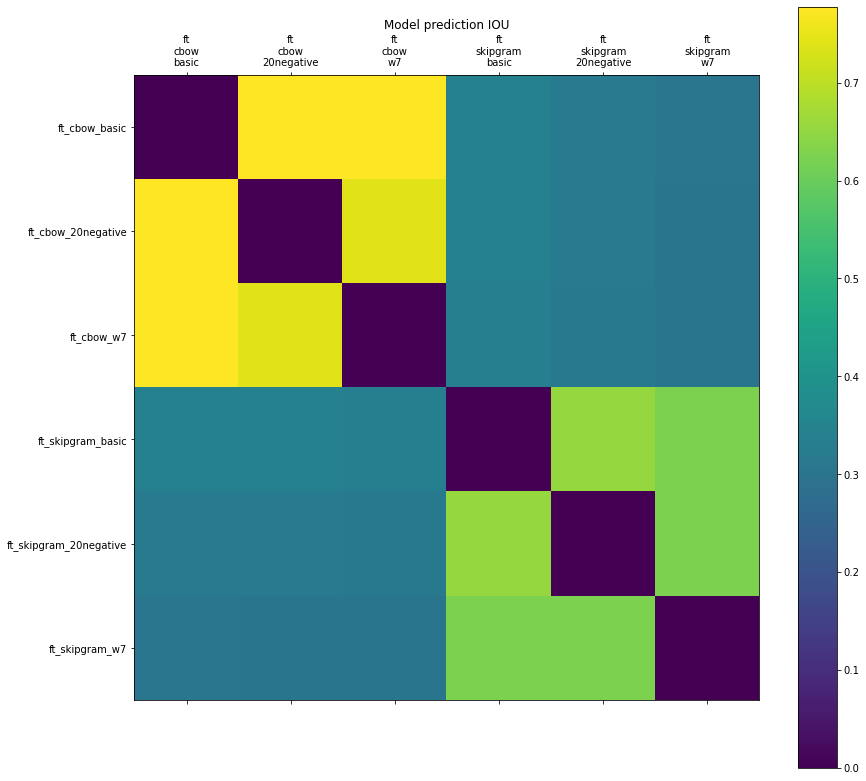

In [18]:
sim_table = get_similarity_table_proximity(fasttext_vecs, 
                                 eval_on_ids = np.arange(100, 5000, 10), 
                                 topn=10)
sim_table -= np.eye(len(sim_table))
labels = [i for i in fasttext_params]#[::len(word_vecs)//5]|
plot_similarity_table(sim_table, labels)

### Word proximity change results

  0%|          | 0/169 [00:00<?, ?it/s]

<ipython-input-8-97206122e624>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + [x.replace("_", "\n") for x in labels_])
<ipython-input-8-97206122e624>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels_)


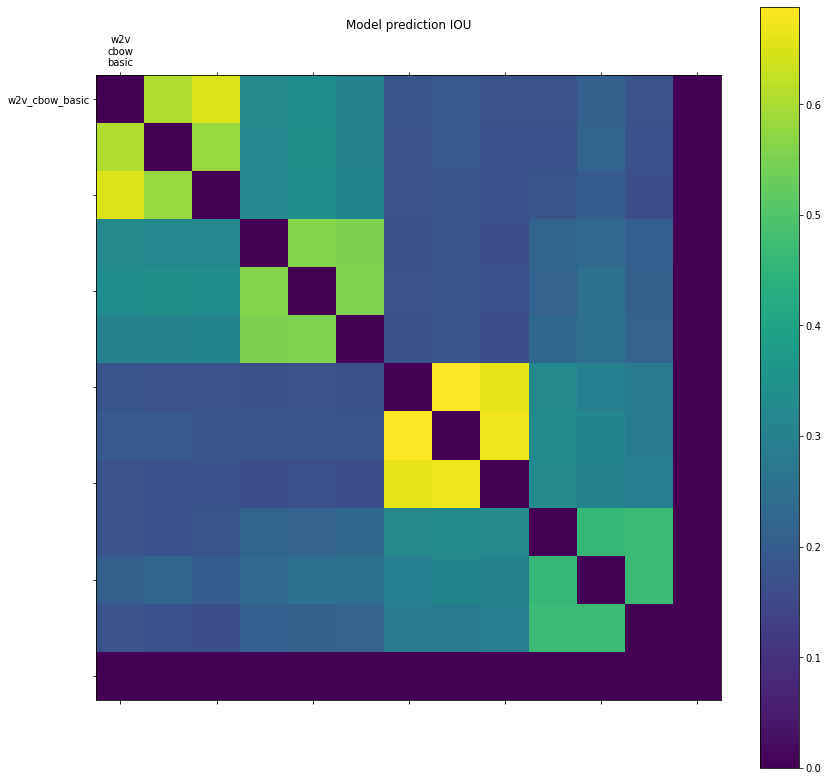

In [69]:
sim_table = get_similarity_table_proximity(vecs, 
                                 eval_on_ids = np.arange(100, 5000, 100), 
                                 topn=10)
sim_table -= np.eye(len(sim_table))
labels = [i for i in params.keys()][::len(params)//5]
plot_similarity_table(sim_table, labels)

  0%|          | 0/144 [00:00<?, ?it/s]

<ipython-input-8-97206122e624>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + [x.replace("_", "\n") for x in labels_])
<ipython-input-8-97206122e624>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels_)


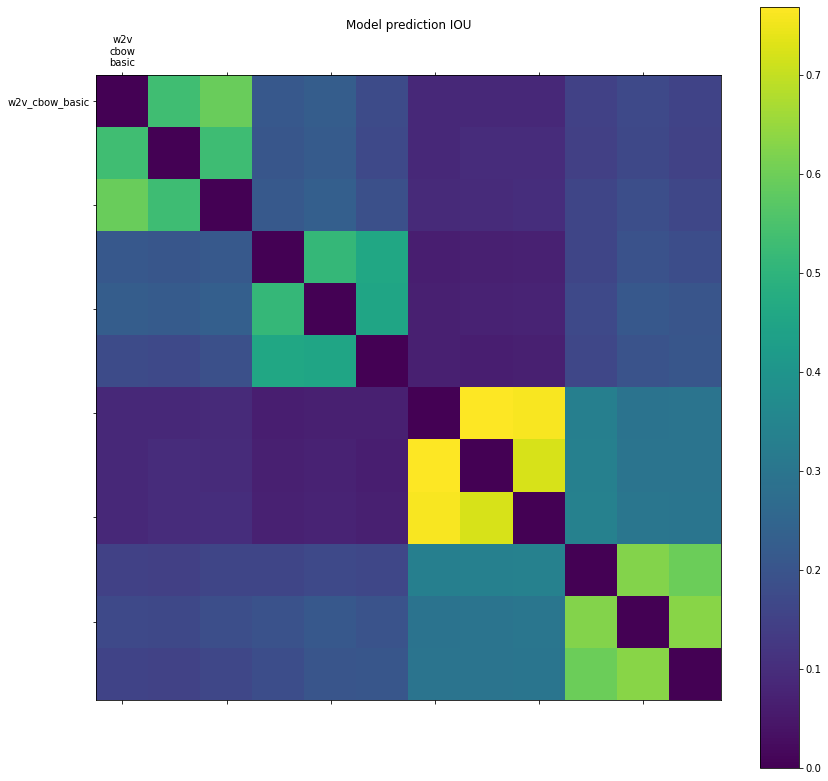

In [19]:
sim_table = get_similarity_table_proximity([*word_vecs.values(), *fasttext_vecs.values()], 
                                 eval_on_ids = np.arange(100, 5000, 100), 
                                 topn=10)
sim_table -= np.eye(len(sim_table))
params = {**w2v_params, **fasttext_params}
labels = [i for i in params.keys()][::len(params)]
plot_similarity_table(sim_table, labels)

## Load word vecs

In [8]:
with open('fastext_v_p.pickle', 'rb') as rf:
    fasttext_vecs, fasttext_params = pickle.load(rf)

with open('w2v_v_p.pickle', 'rb') as rf:
    word_vecs, w2v_params = pickle.load(rf)

In [9]:
vecs = [*word_vecs.values(), *fasttext_vecs.values()]
param_labels = [*w2v_params.keys(), *fasttext_params.keys()]
param_labels

['w2v_cbow_basic',
 'w2v_cbow_20negative',
 'w2v_cbow_w7',
 'w2v_skipgram_basic',
 'w2v_skipgram_20negative',
 'w2v_skipgram_w7',
 'ft_cbow_basic',
 'ft_cbow_20negative',
 'ft_cbow_w7',
 'ft_skipgram_basic',
 'ft_skipgram_20negative',
 'ft_skipgram_w7']

### Load data

In [22]:
# with open('models.pickle', 'rb') as rf:
#     vecs, params = pickle.load(rf)


## Analogies

In [11]:
words_ = np.array(vecs[0].index_to_key)
analogies_input = generate_analogies_input(vecs[0], words_, word_count=50)
analogies_input

[('2012)<br', '9lbs', '2012<br'),
 ('sow', 'speak-', 'dulling'),
 ('painstaking', 'symphathetic', '/>"truth'),
 ('com/gp/product/b004777f3m">celestial', 'thirty-two', 'marci'),
 ('generic)', '"caloric"', 'p-butter'),
 ('scudders', 'outweigh', 'vu:'),
 ('greemies', 'eventual', 'dominion'),
 ('tinting', 'stunted', 'orbee'),
 ('overpriced;', '25-count', 'lasts)'),
 ('rihanna', 'unclog', 'jingle'),
 ('partitioned', '(p', 'singled'),
 ('(shaking', '/>46', '170g</a>'),
 ('now:', 'collar', '"joint'),
 ('can;', 'barrel"', '9/2010'),
 ('mid-day;', 'freakishly', 'miscarriages'),
 ('luxe', '"pressure', 'vida'),
 ('lasagne', 'death<br', 'fettucine'),
 ('consult', 'failed', 'consulting'),
 ('overpowering', 'yoyo', 'strong'),
 ('*or*', 'misconception', 'desired;'),
 ('mega', 'serve"', 'duck/ecopad'),
 ('numbers)', 'these--all', 'alkylamides'),
 ('medium-roasts', 'oxidization', 'cup-o-joe'),
 ('farm"', 'bedford', 'mice-type'),
 ('wonderfully', 'equaled', 'fantastically'),
 ('sweeties', '/>placed', 'v

### Analogy task change results

  0%|          | 0/144 [00:00<?, ?it/s]

<ipython-input-7-97206122e624>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + [x.replace("_", "\n") for x in labels_])
<ipython-input-7-97206122e624>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels_)


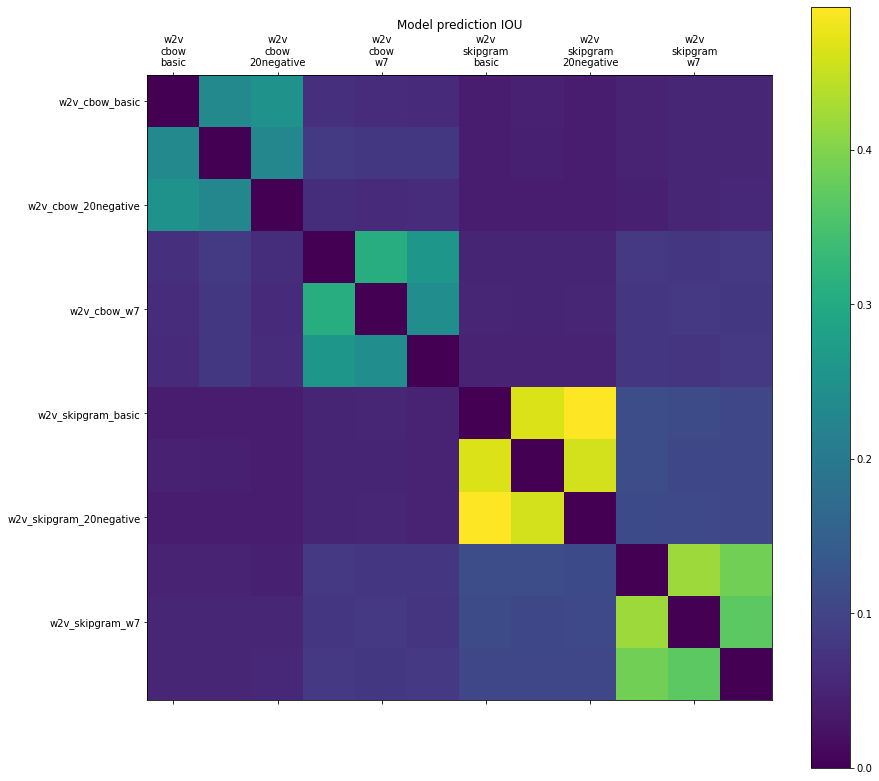

In [12]:
sim_table = get_similarity_table_analogy(vecs, 
                                         eval_on_ids = np.arange(100, 5000, 10), 
                                         topn=10, 
                                         analogy_inputs=analogies_input)
sim_table -= np.eye(len(sim_table))

plot_similarity_table(sim_table, param_labels)

## Percentage of changes in the Outlier Detection task

### Outlier words change results
- Beware of topn ~ len(eval_on_ids) as it can easily lead to very high lowest possible IOU

In [ ]:
%%time
sim_table = get_similarity_table_outlier(vecs, 
                                         eval_on_ids = np.arange(4000, 5000, 50), 
                                         topn=3)
sim_table -= np.eye(len(sim_table))

plot_similarity_table(sim_table, param_labels)

  0%|          | 0/169 [00:00<?, ?it/s]

Process ForkPoolWorker-2043:
Process ForkPoolWorker-2041:
Process ForkPoolWorker-2039:
Process ForkPoolWorker-2048:
Process ForkPoolWorker-2042:
Process ForkPoolWorker-2047:
Process ForkPoolWorker-2045:
Process ForkPoolWorker-2038:
Process ForkPoolWorker-2044:
Process ForkPoolWorker-2036:
Process ForkPoolWorker-2040:
Process ForkPoolWorker-2037:
Process ForkPoolWorker-2046:
Process ForkPoolWorker-2033:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):


### Doc OD change results

In [17]:
%time
# this takes too long, dont run it, 28 seconds
sim_table = get_similarity_table_doc_outlier(vecs, df['tokenized'][20:40])
sim_table -= np.eye(len(sim_table))

CPU times: user 1 µs, sys: 1e+03 ns, total: 2 µs
Wall time: 3.34 µs


<ipython-input-7-97206122e624>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + [x.replace("_", "\n") for x in labels_])
<ipython-input-7-97206122e624>:29: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels_)


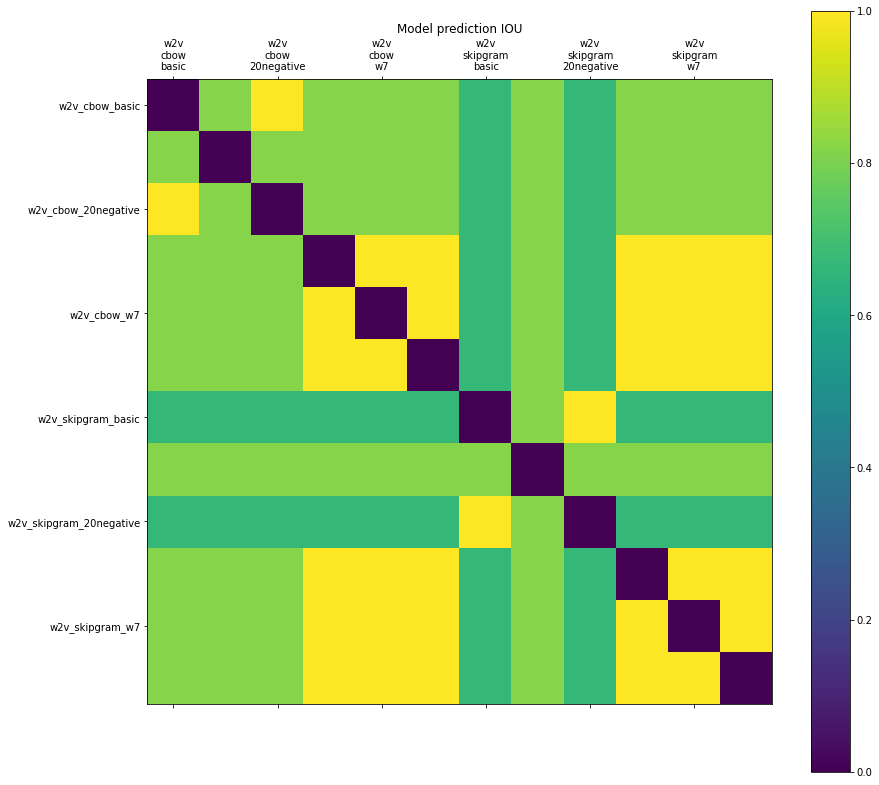

In [16]:
plot_similarity_table(sim_table, param_labels)

In [ ]:
sim_table = get_similarity_table_outlier(vecs, 
                                         eval_on_ids = np.arange(100, 500, 100), 
                                         topn=10)
sim_table -= np.eye(len(sim_table))

plot_similarity_table(sim_table, param_labels)

  0%|          | 0/9 [00:00<?, ?it/s]

TypeError: ignored

## Store/load models

In [ ]:
import pickle

vecs = [*word_vecs.values(), *fasttext_vecs.values()]
params = {**w2v_params, **fasttext_params}
data = vecs, params

with open('models.pickle', 'wb') as wf:
    pickle.dump(data, wf)

In [65]:
import pickle

with open('models.pickle', 'rb') as rf:
    vecs, params = pickle.load(rf)

Add random projection

In [66]:
random_projection = Word2Vec(vector_size=100, min_count=40, workers=12, )
random_projection.build_vocab(corpus_iterable=df['tokenized'])
params['random_projection'] = {}
vecs.append(random_projection.wv)

In [67]:
len(params), len(vecs)

(13, 13)

In [68]:
params

{'w2v_cbow_basic': {'sg': 0},
 'w2v_cbow_20negative': {'sg': 0, 'hs': 0, 'negative': 20},
 'w2v_cbow_w7': {'sg': 0, 'window': 7},
 'w2v_skipgram_basic': {'sg': 1},
 'w2v_skipgram_20negative': {'sg': 1, 'hs': 0, 'negative': 20},
 'w2v_skipgram_w7': {'sg': 1, 'window': 7},
 'ft_cbow_basic': {'sg': 0},
 'ft_cbow_20negative': {'sg': 0, 'hs': 0, 'negative': 20},
 'ft_cbow_w7': {'sg': 0, 'window': 7},
 'ft_skipgram_basic': {'sg': 1},
 'ft_skipgram_20negative': {'sg': 1, 'hs': 0, 'negative': 20},
 'ft_skipgram_w7': {'sg': 1, 'window': 7},
 'random_projection': {}}

# Conclusions

- Overall results (all tasks)
    - The difference between task (cbow, skipgram) is almost as great as between architecture (Word2Vec, FastText)
    - FastText is more stable than Word2Vec architecture
    - CBOW is more stable than skipgram task
    - Architecture and task change the word vec behavior a lot, hyperparameter tuning not so much
- Change in word proximity
    - Similar stability when evaluated on differently frequent words (ranks ~100, 100-5000, 5000-7000)
- Change in analogies
    - The randomly generated similarities task results could be mostly explained by the difference in word proximity => not conclusive
- Change in outlier word vectors
    - Does not make sense to evaluate on sparse ranks (eg. range(100:7000:500)), because the infrequency highly correlates with how strong outlier a word is (eg. how close is the closest word)
    - Even for only infrequent words, the models have high IOU on the biggest outliers across all models, with a bit higher for the same architecture and task
- Influence of epochs on word proximity
    - Models are more similar with less epochs separating them even after 40 epochs
    - The biggest change is in the first 8 epochs